In [24]:
import os
import pandas as pd

# Path to your folder
folder_path = r"/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# Automatically find all CSV files in the folder
csv_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.csv')]

# Loop through each CSV file found, read it, and print head
for file_name in csv_files:
    file_path = os.path.join(folder_path, file_name)
    print(f"--- HEAD OF {file_name} ---")
    df = pd.read_csv(file_path)
    print(df.head())
    print()  # Blank line for readability


--- HEAD OF UGRID_Darga_73kcells.csv ---
   ID  AREA_2M          X          Y  STRM_ORDER  STREAM_CELL         DEM  \
0   1    76074  35.267583  31.578099           3            0  517.346514   
1   2    42902  35.263291  31.581563           3            0  533.465940   
2   3    32735  35.265746  31.580044           3            0  508.528631   
3   4    36378  35.267899  31.579994           3            0  487.063278   
4   5    36378  35.265648  31.581530           3            0  517.589021   

       SLOPE      ASPECT       TPI       TRI  TRIRILEY   TRIRMSD  ROUGHNESS  \
0  13.240807  150.377468  0.002569  0.731672  2.342673  0.828260   2.368693   
1  11.668658   80.669572  0.008181  0.639824  2.052027  0.725501   2.126688   
2  15.062540   88.287047 -0.009987  0.813083  2.671906  0.944662   2.896779   
3  23.831584  225.718806 -0.010727  1.402405  4.549023  1.608323   4.869579   
4  12.298974  109.785292  0.023146  0.675987  2.163425  0.764886   2.232534   

     FLOWDIR EQUATION

In [25]:
import os
import pandas as pd

folder_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"
csv_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.csv')]

for file_name in csv_files:
    file_path = os.path.join(folder_path, file_name)
    print(f"--- HEAD OF {file_name} ---")
    
    # Option 1: Treat 'Unnamed: 0' as the index when reading
    df = pd.read_csv(file_path, index_col=0)
    
    # Option 2: If you prefer reading all columns and then dropping 'Unnamed: 0', you can do:
    # df = pd.read_csv(file_path)
    # if 'Unnamed: 0' in df.columns:
    #     df.drop(columns='Unnamed: 0', inplace=True)
    
    print(df.head())
    print()


--- HEAD OF UGRID_Darga_73kcells.csv ---
    AREA_2M          X          Y  STRM_ORDER  STREAM_CELL         DEM  \
ID                                                                       
1     76074  35.267583  31.578099           3            0  517.346514   
2     42902  35.263291  31.581563           3            0  533.465940   
3     32735  35.265746  31.580044           3            0  508.528631   
4     36378  35.267899  31.579994           3            0  487.063278   
5     36378  35.265648  31.581530           3            0  517.589021   

        SLOPE      ASPECT       TPI       TRI  TRIRILEY   TRIRMSD  ROUGHNESS  \
ID                                                                             
1   13.240807  150.377468  0.002569  0.731672  2.342673  0.828260   2.368693   
2   11.668658   80.669572  0.008181  0.639824  2.052027  0.725501   2.126688   
3   15.062540   88.287047 -0.009987  0.813083  2.671906  0.944662   2.896779   
4   23.831584  225.718806 -0.010727  1.4

==================== PLOTS FOR UGRID_Darga_73kcells.csv ====================


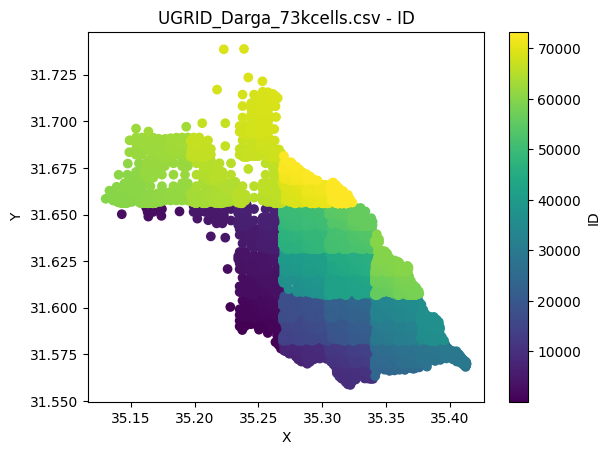

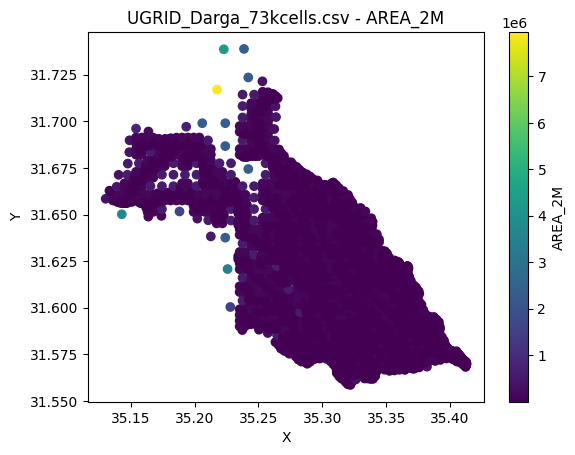

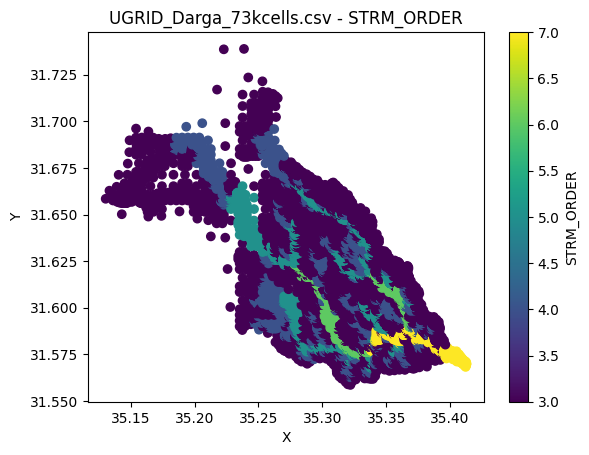

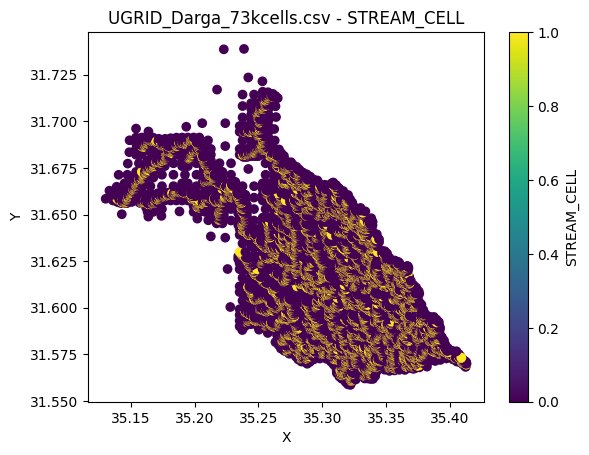

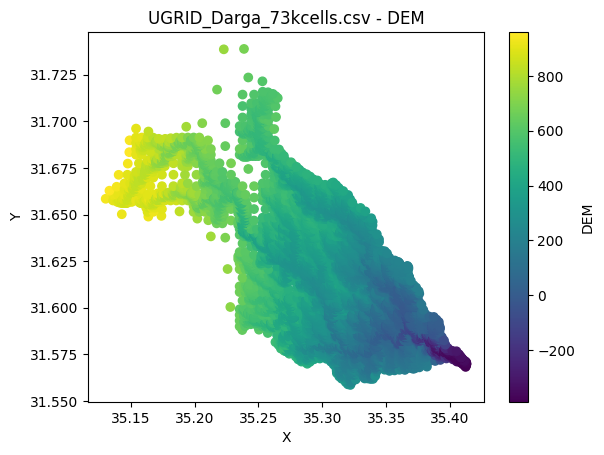

...

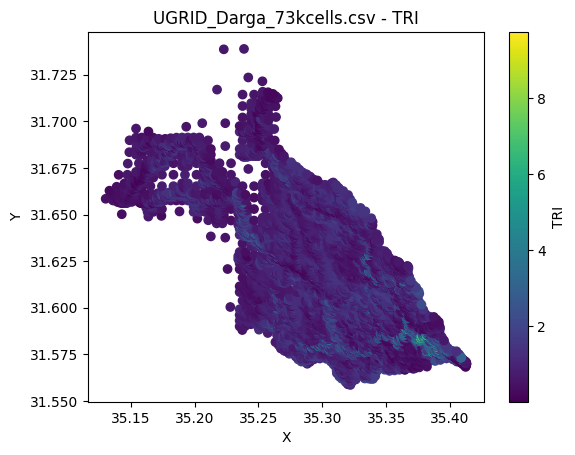

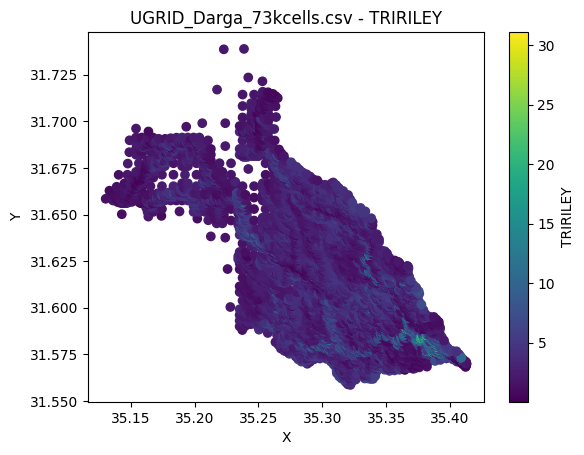

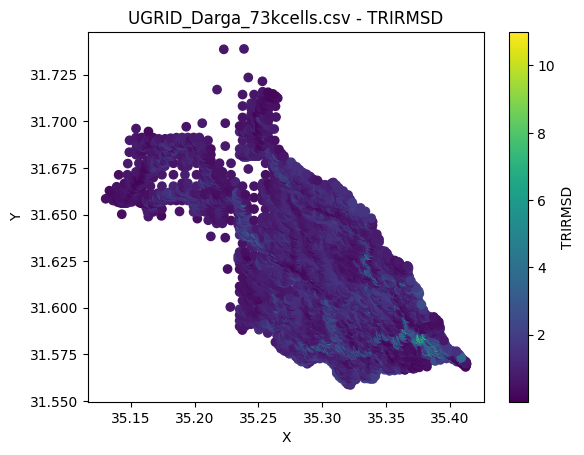

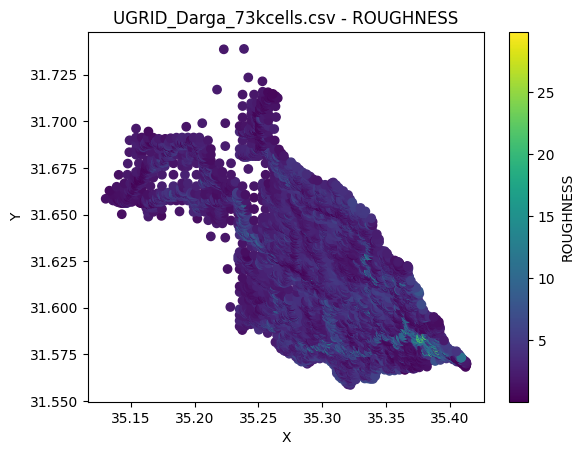

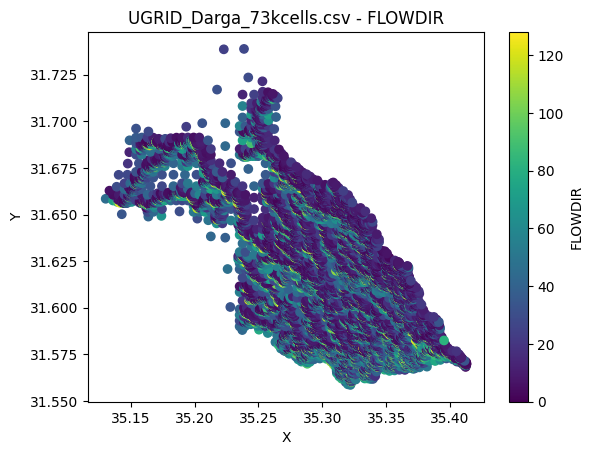


==================== PLOTS FOR UGRID_Darga_16kcells.csv ====================


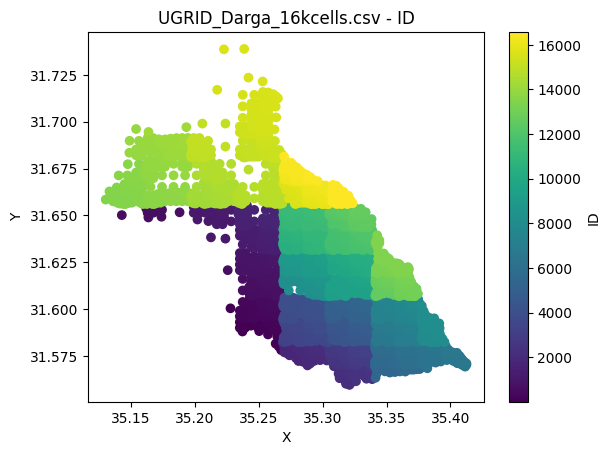

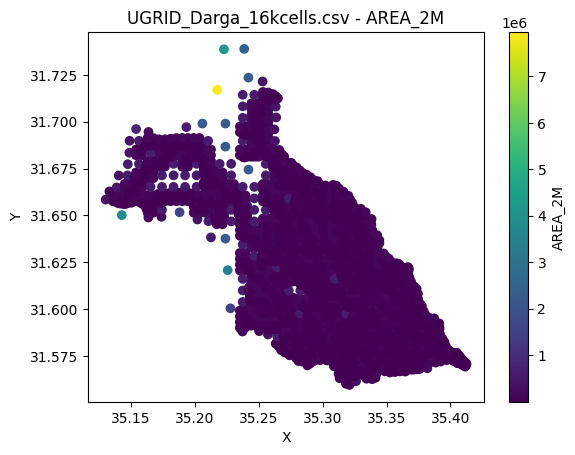

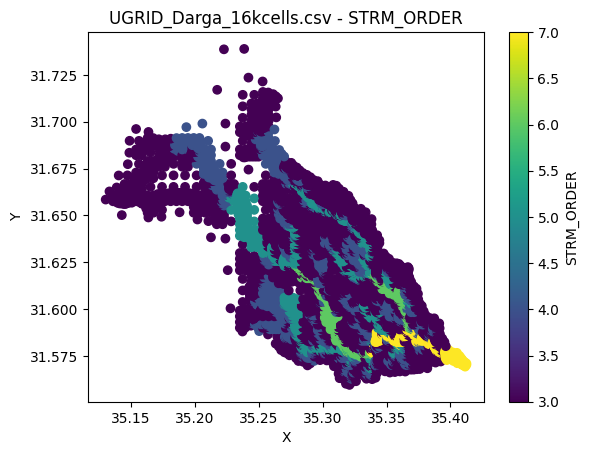

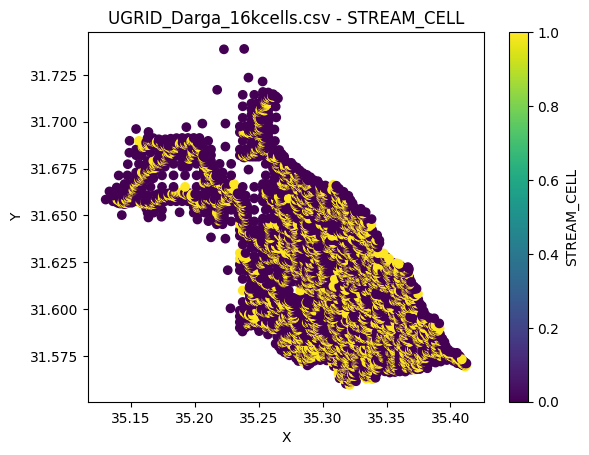

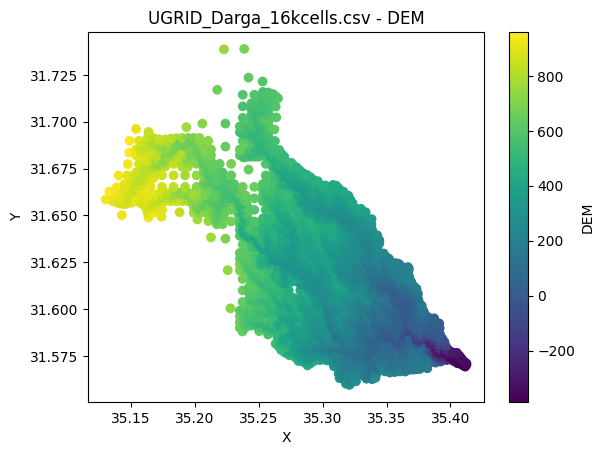

...

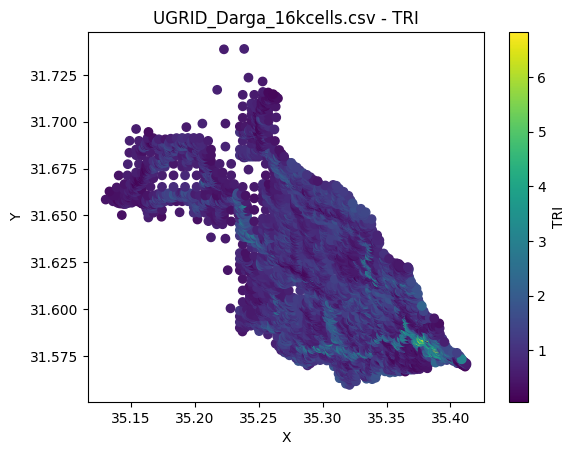

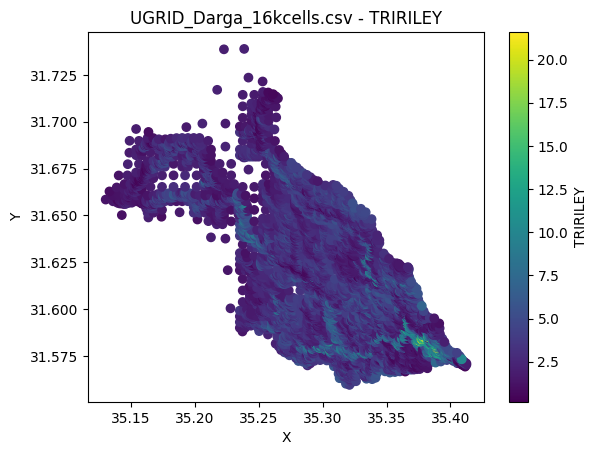

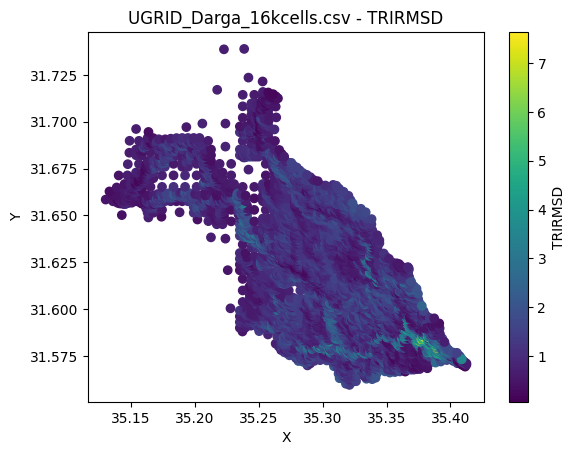

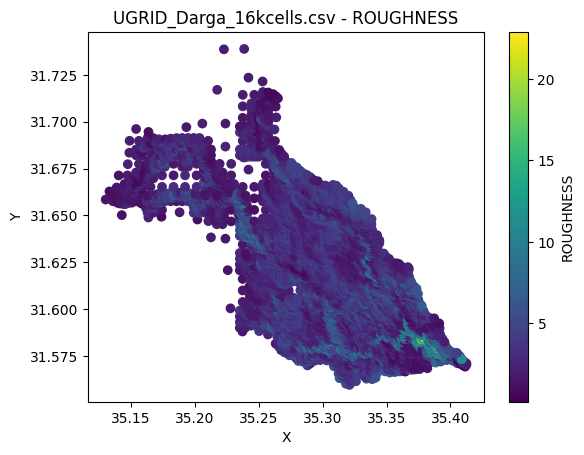

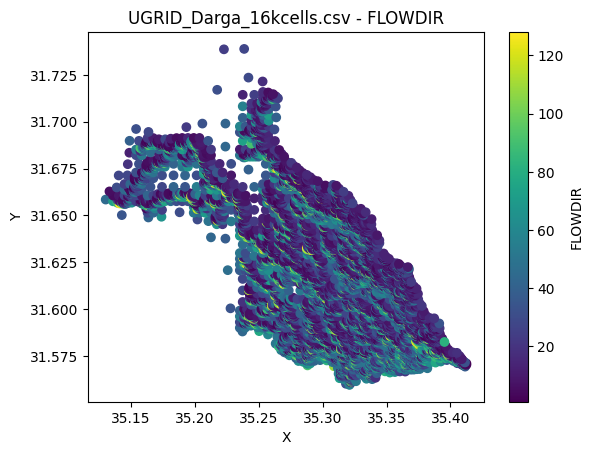


==================== PLOTS FOR UGRID_Darga_6kcells.csv ====================


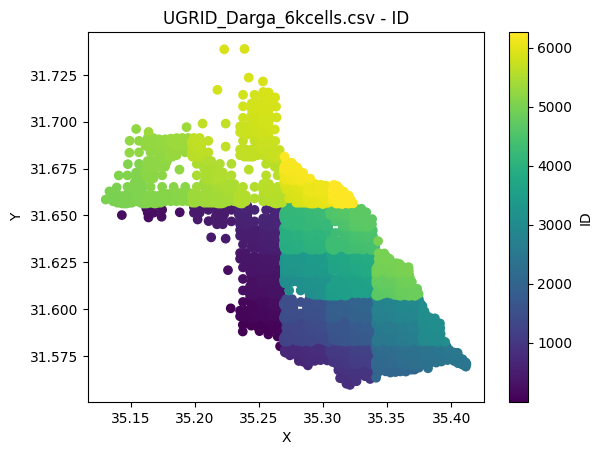

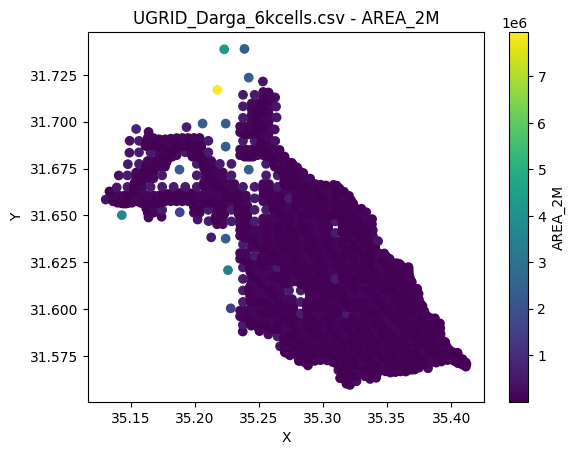

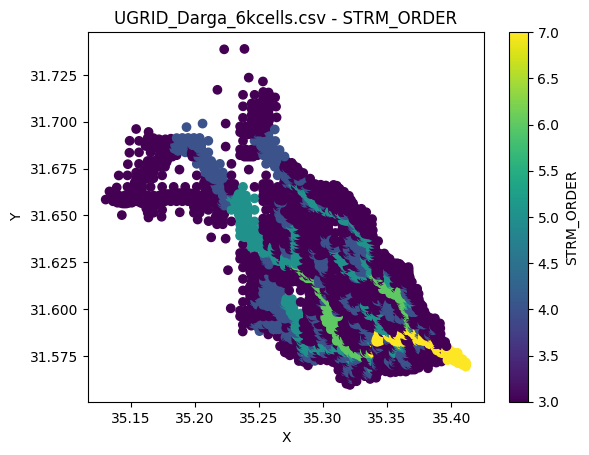

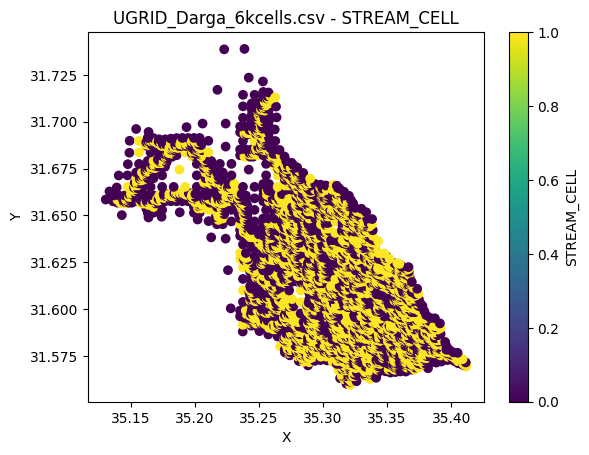

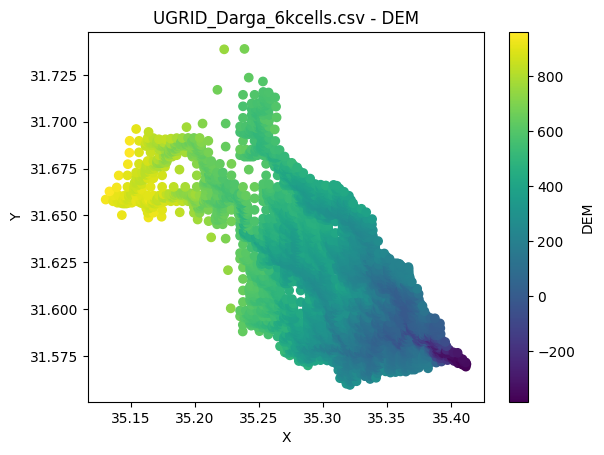

...

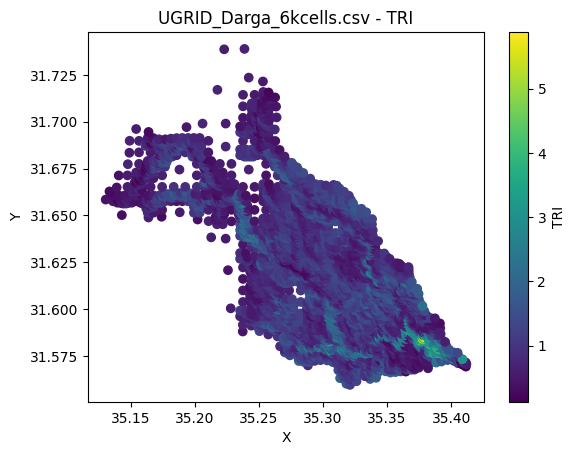

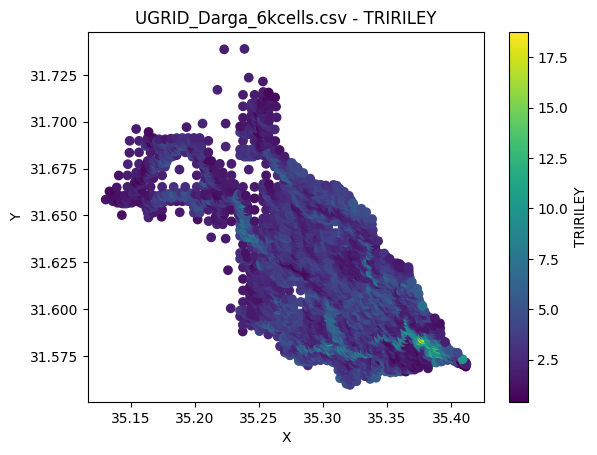

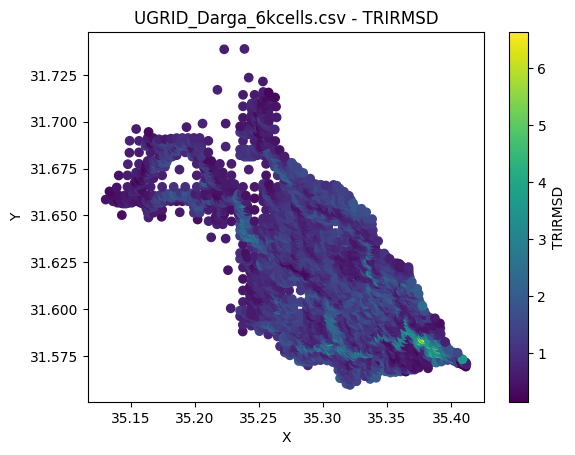

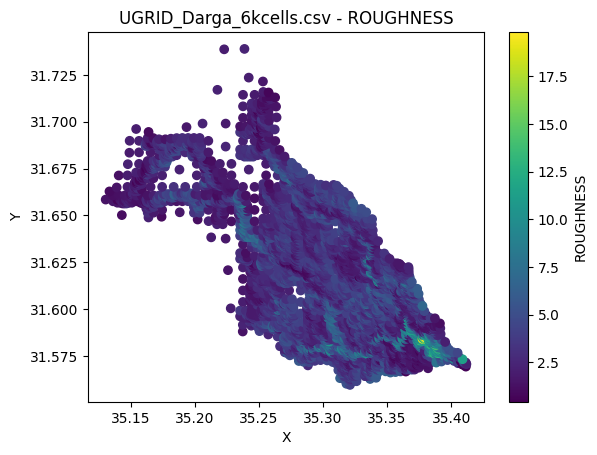

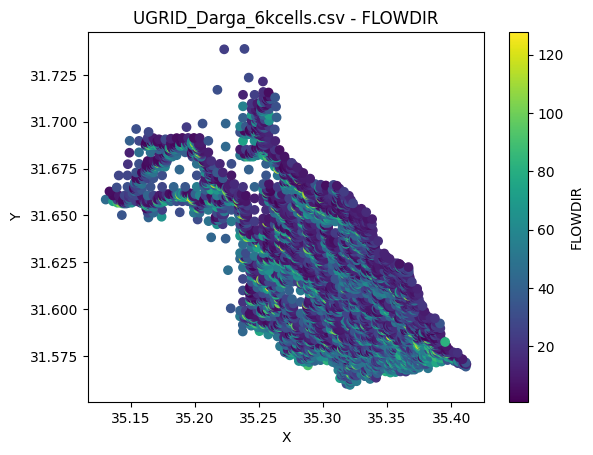

In [26]:
import os
import pandas as pd
import matplotlib.pyplot as plt

folder_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"
csv_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.csv')]

for file_name in csv_files:
    print(f"==================== PLOTS FOR {file_name} ====================")
    file_path = os.path.join(folder_path, file_name)
    df = pd.read_csv(file_path)
    
    # Make sure your file has columns named exactly 'X' and 'Y'
    if not all(col in df.columns for col in ['X','Y']):
        print(f"Skipped {file_name}: missing 'X' or 'Y' columns.")
        print()
        continue
    
    # Drop non-numeric or coordinate columns from the plotting list
    # (We keep X and Y out so we don't try to color by them)
    numeric_columns = [col for col in df.columns 
                       if pd.api.types.is_numeric_dtype(df[col]) 
                       and col not in ['X','Y']]
    
    for col in numeric_columns:
        # Create a new plot for this feature
        plt.figure()
        plt.scatter(df["X"], df["Y"], c=df[col])  # Color by the feature
        plt.xlabel("X")
        plt.ylabel("Y")
        plt.title(f"{file_name} - {col}")
        plt.colorbar(label=col)  # Adds a color scale
        plt.show()
    
    print()  # Blank line for spacing between files


========== FEATURE: AREA_2M ==========


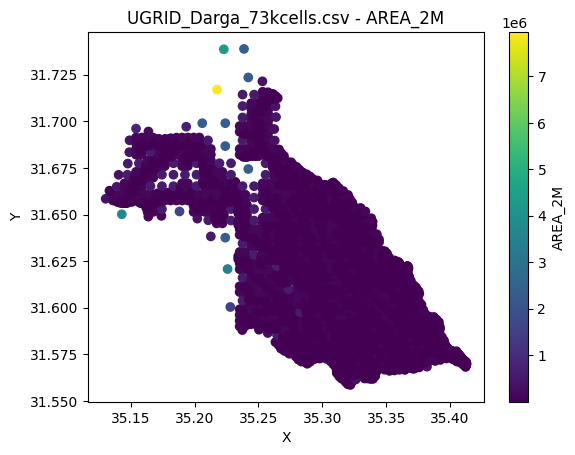

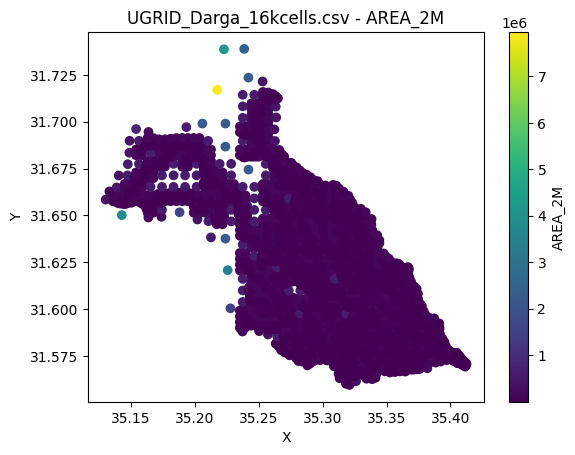

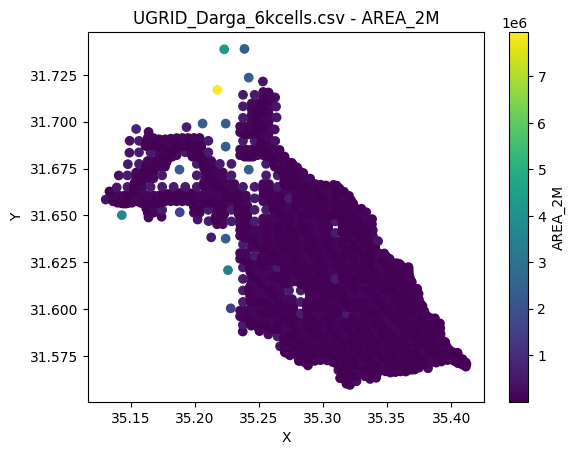


========== FEATURE: ASPECT ==========


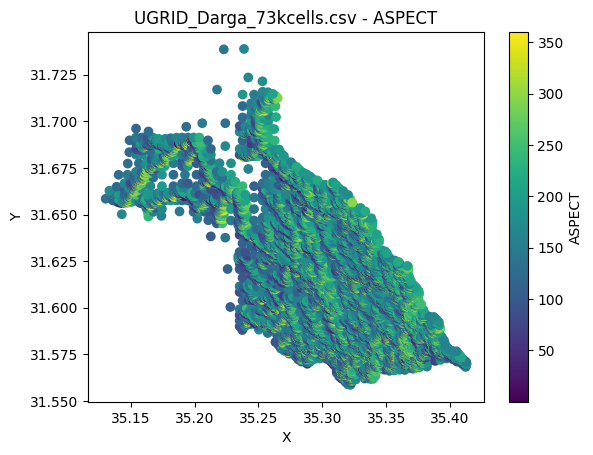

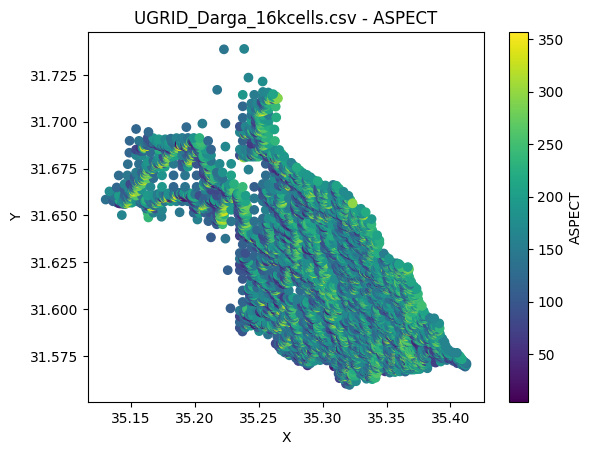

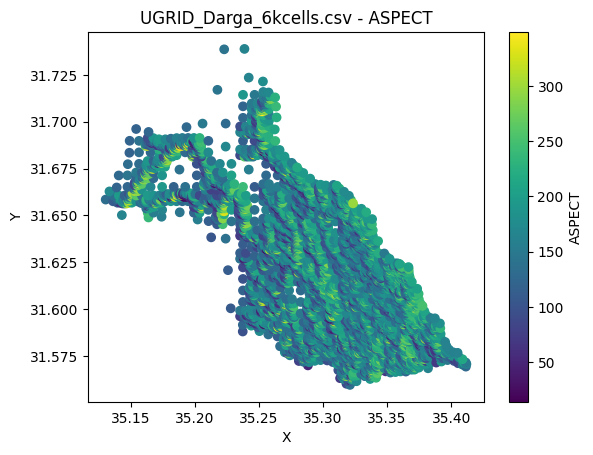


========== FEATURE: DEM ==========


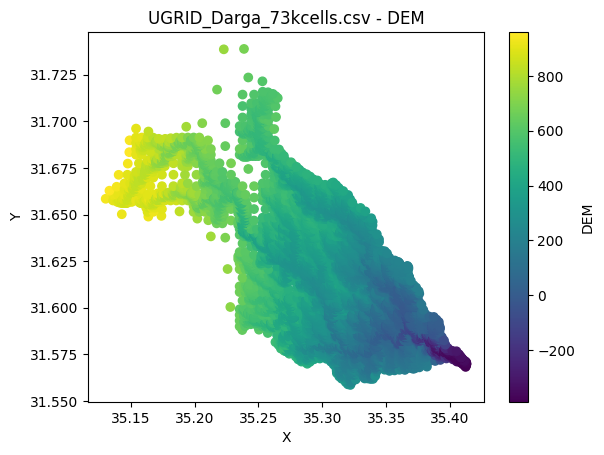

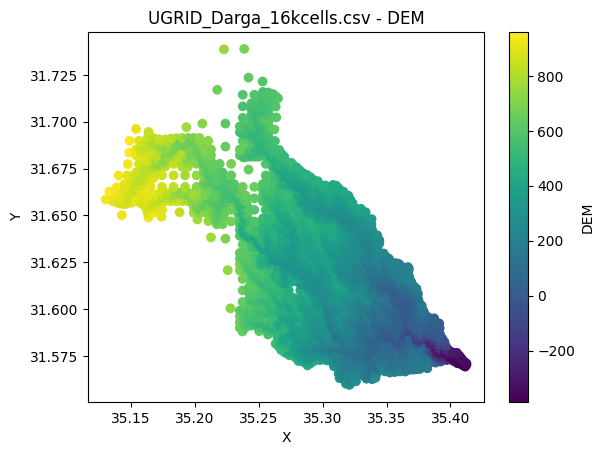

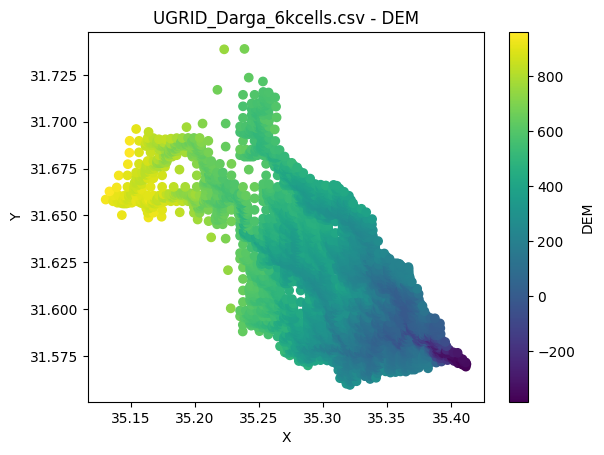


========== FEATURE: FLOWDIR ==========


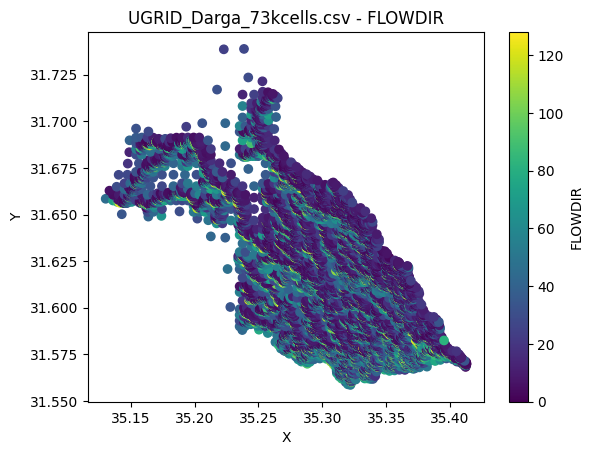

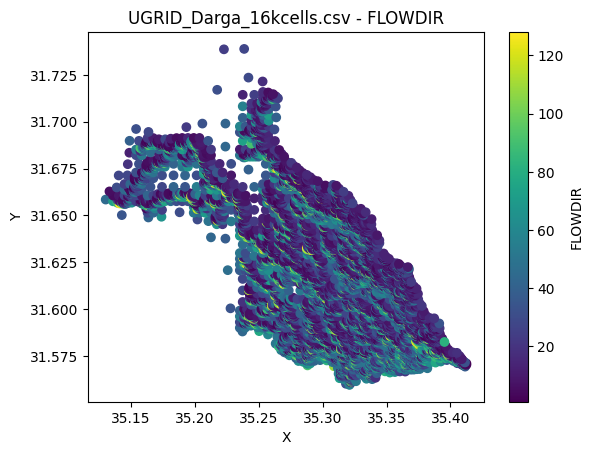

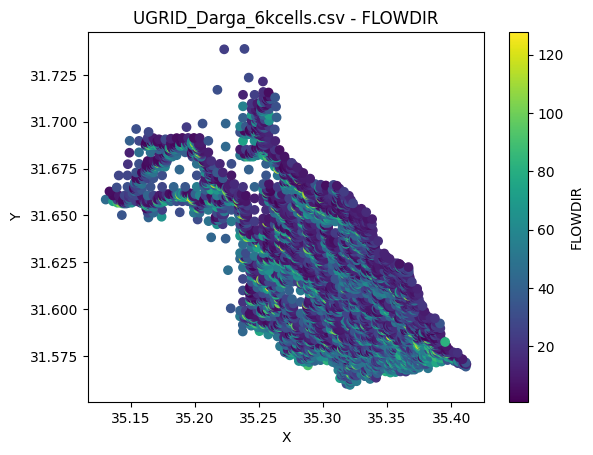


========== FEATURE: ID ==========


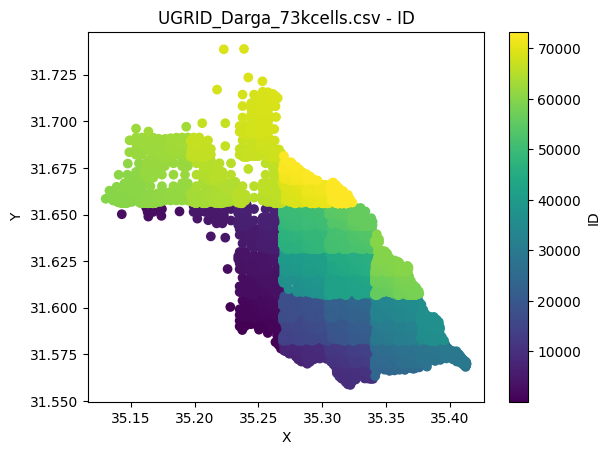

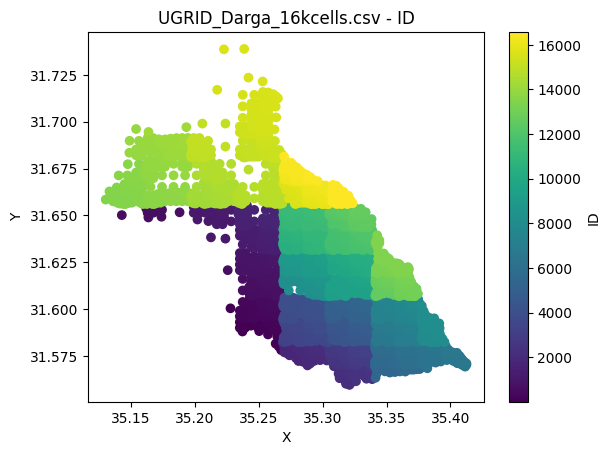

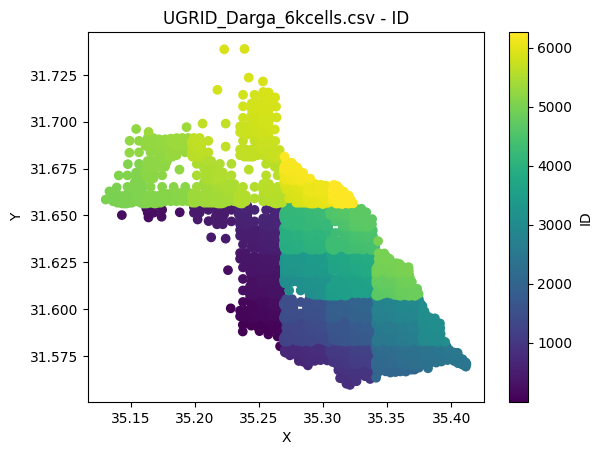


========== FEATURE: ROUGHNESS ==========


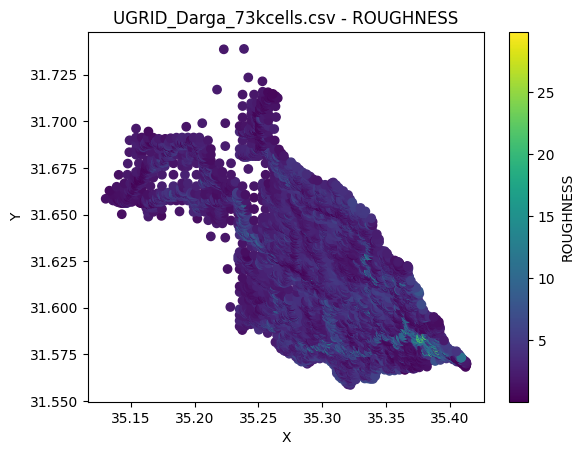

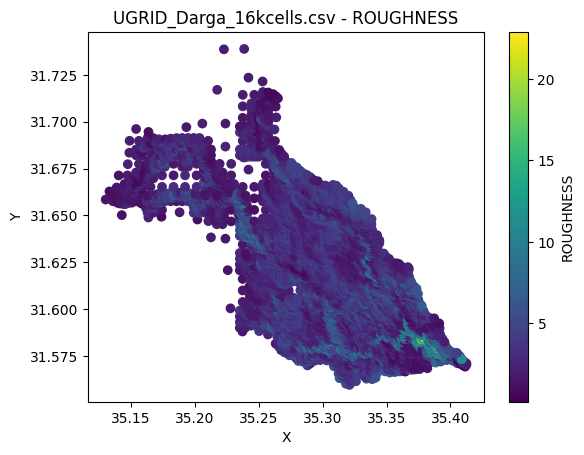

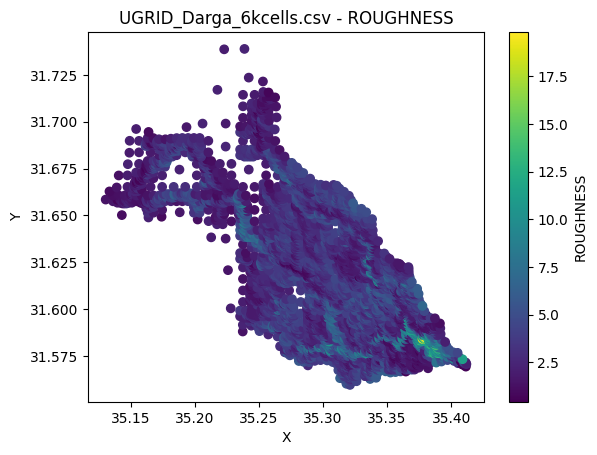


========== FEATURE: SLOPE ==========


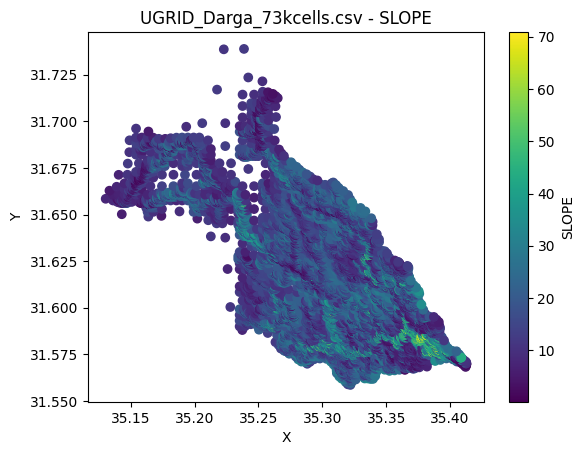

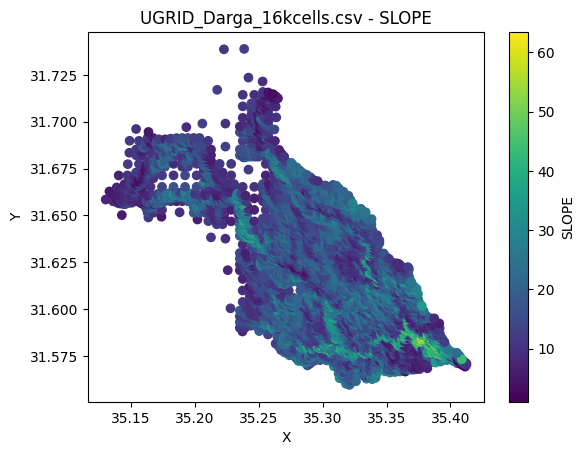

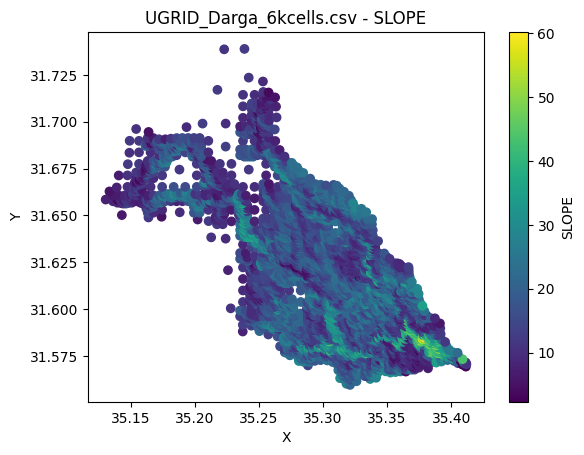


========== FEATURE: STREAM_CELL ==========


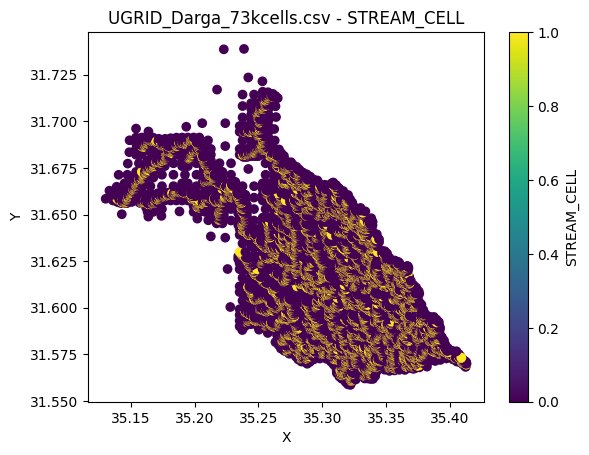

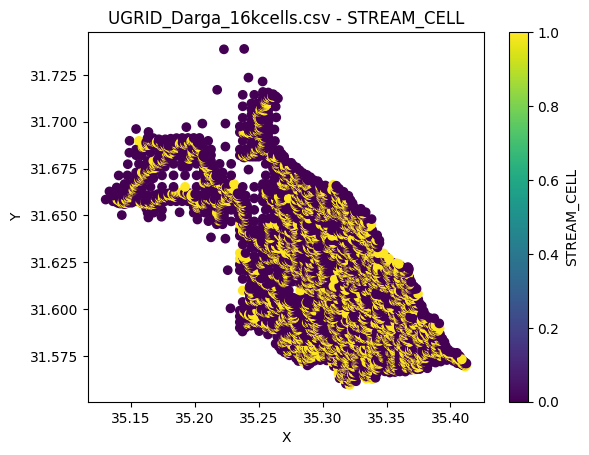

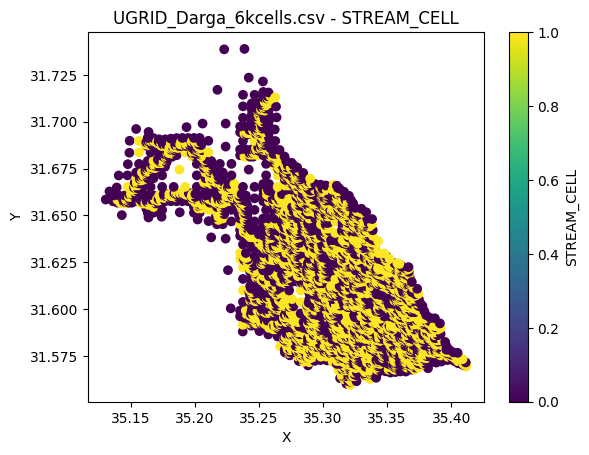


========== FEATURE: STRM_ORDER ==========


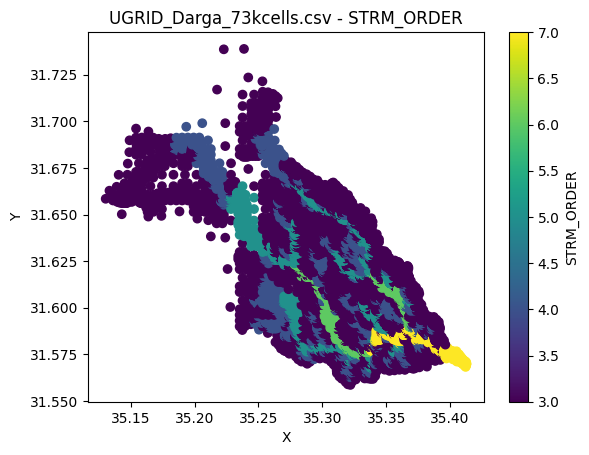

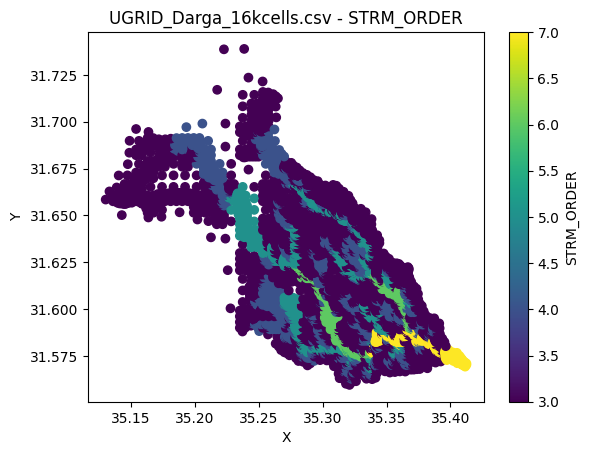

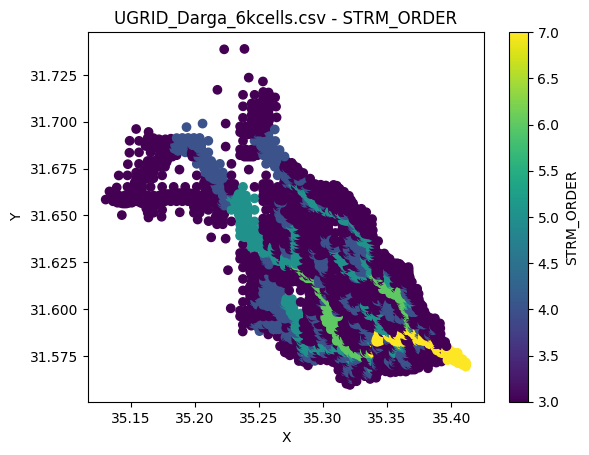


========== FEATURE: TPI ==========


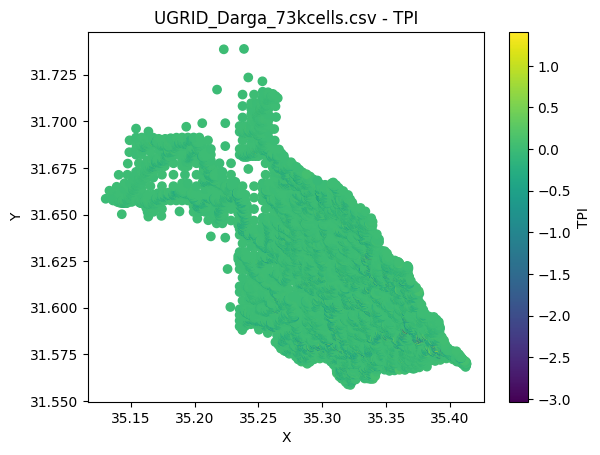

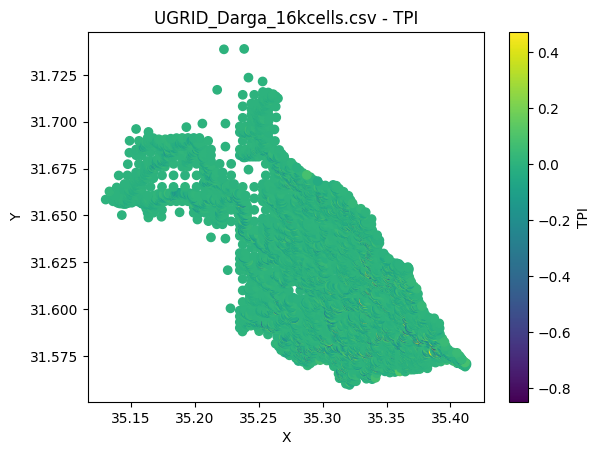

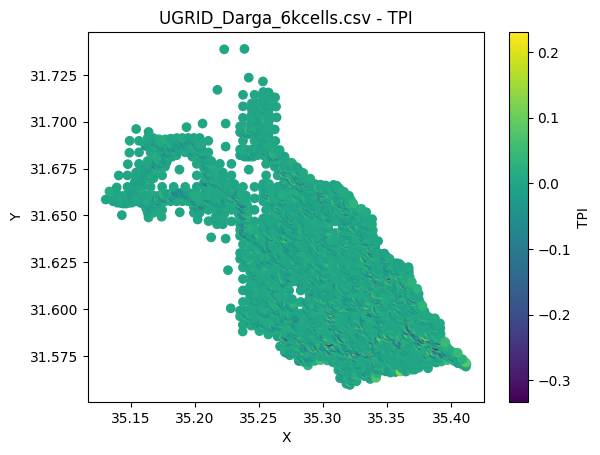


========== FEATURE: TRI ==========


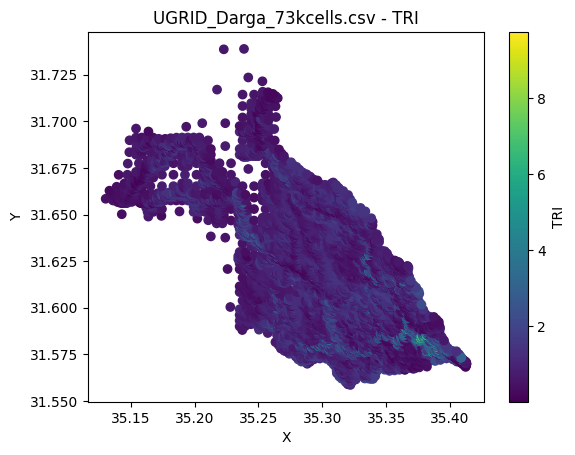

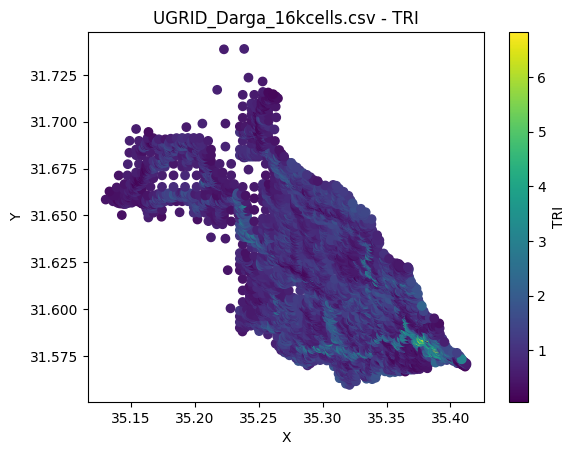

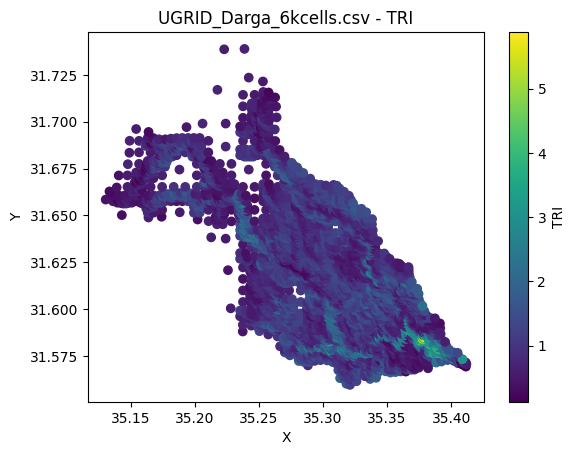


========== FEATURE: TRIRILEY ==========


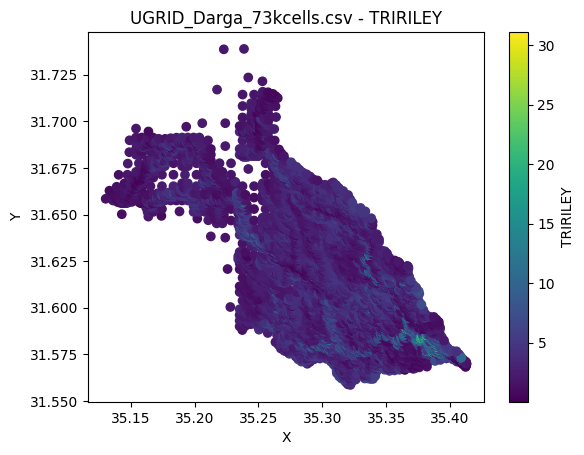

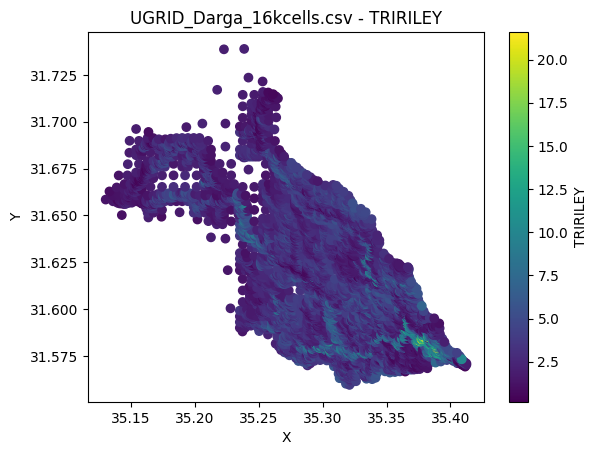

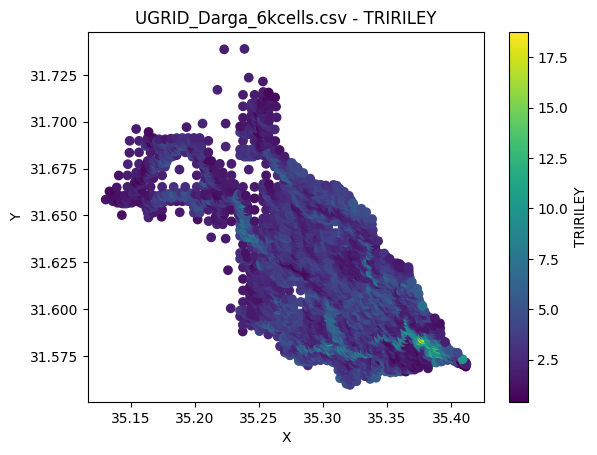


========== FEATURE: TRIRMSD ==========


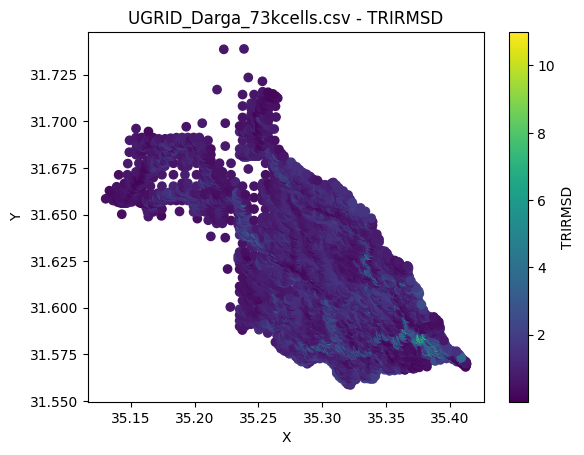

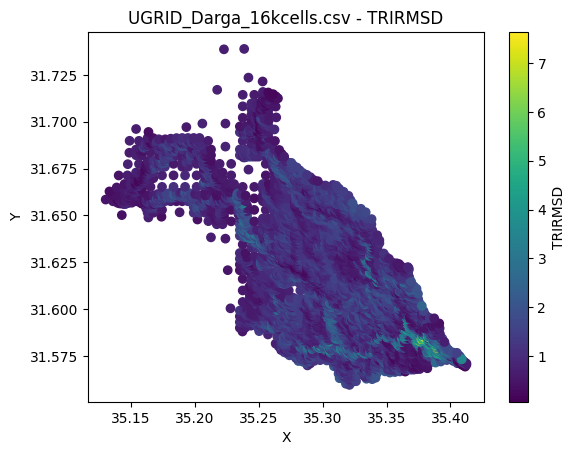

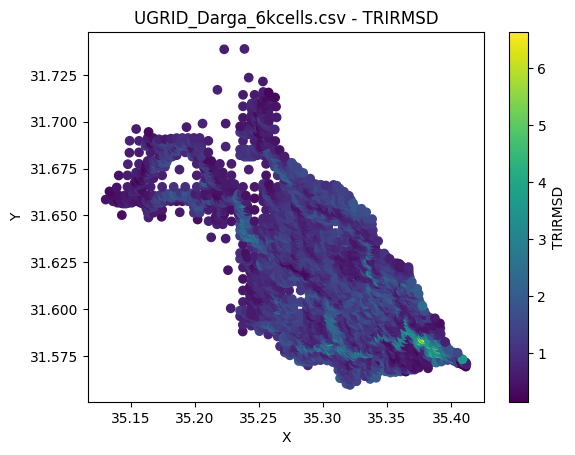

In [27]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Path to your folder
folder_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# List all CSV files 
csv_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.csv')]

# Read each CSV file into a DataFrame, store them in a dictionary
dataframes = {}
for csv_file in csv_files:
    file_path = os.path.join(folder_path, csv_file)
    try:
        df = pd.read_csv(file_path)
        dataframes[csv_file] = df
    except Exception as e:
        print(f"Could not read {csv_file}: {e}")

# Identify numeric features that appear in at least one file
# (We'll exclude 'X' and 'Y' from the "features to color by")
all_columns = set()
for df in dataframes.values():
    all_columns.update(df.columns)

# We only want numeric columns (excluding X & Y)
numeric_features = []
for col in all_columns:
    # We also skip coordinate columns or columns that aren't numeric in *any* file
    if col not in ['X', 'Y']:
        for df in dataframes.values():
            if col in df.columns:
                # Check if it's numeric in that file
                if pd.api.types.is_numeric_dtype(df[col]):
                    numeric_features.append(col)
                    break  # Found at least one file with numeric data in this col
# numeric_features may have duplicates if found across multiple files; let's deduplicate
numeric_features = list(set(numeric_features))
numeric_features.sort()  # Sort them for consistent order

# Now we plot each feature (column) across all CSV files
for feature in numeric_features:
    print(f"========== FEATURE: {feature} ==========")
    for file_name, df in dataframes.items():
        # Check if this file has 'X', 'Y', and the current feature
        if not {'X','Y',feature}.issubset(df.columns):
            continue  # skip if missing any essential column
        
        # Create a distinct figure for each file’s data
        plt.figure()
        plt.scatter(df["X"], df["Y"], c=df[feature])
        plt.xlabel("X")
        plt.ylabel("Y")
        plt.title(f"{file_name} - {feature}")
        plt.colorbar(label=feature)
        plt.show()
    print()  # Blank line after each feature section


In [31]:
import os
import pandas as pd

folder_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# Find transformed files
transformed_files = [
    f for f in os.listdir(folder_path) 
    if f.lower().startswith("transformed_") and f.lower().endswith(".csv")
]

columns_to_drop = ["Unnamed: 0", "X", "Y"]

for file_name in transformed_files:
    file_path = os.path.join(folder_path, file_name)
    print(f"=== Processing {file_name} ===")
    
    df = pd.read_csv(file_path)
    
    # Drop columns if they exist
    drop_existing = [col for col in columns_to_drop if col in df.columns]
    if drop_existing:
        df.drop(columns=drop_existing, inplace=True)
    
    # Overwrite the same file without index
    df.to_csv(file_path, index=False)
    
    # Show the head of the updated file
    print(df.head(), "\n")


In [33]:
import pandas as pd

# Path to the CSV file you want to check
file_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_16kcells.csv"

# 1) Read the CSV into a DataFrame
df = pd.read_csv(file_path)

# 2) Check for NaNs in each column
print("=== NaN Counts by Column ===")
nan_counts = df.isna().sum()
print(nan_counts)

# 3) (Optional) Print rows where NaN appears, if you'd like more detail
if nan_counts.any():  # if there's at least one column with NaNs
    print("\n=== Rows containing NaNs ===")
    print(df[df.isna().any(axis=1)])
else:
    print("\nNo NaN values found in this file.")


=== NaN Counts by Column ===
ID             0
AREA_2M        0
X              0
Y              0
STRM_ORDER     0
STREAM_CELL    0
DEM            0
SLOPE          0
ASPECT         0
TPI            0
TRI            0
TRIRILEY       0
TRIRMSD        0
ROUGHNESS      0
FLOWDIR        0
EQUATION       0
dtype: int64

No NaN values found in this file.


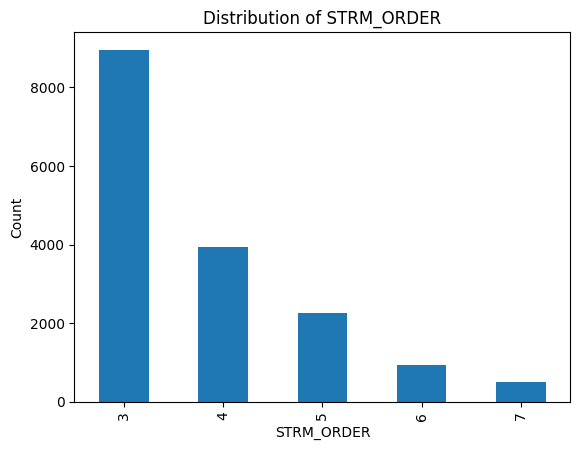

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to the CSV file
file_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_16kcells.csv"

# 1) Read the CSV into a DataFrame
df = pd.read_csv(file_path)

# 2) Calculate the distribution of STRM_ORDER
strm_order_counts = df["STRM_ORDER"].value_counts()

# 3) Plot the distribution
plt.figure()
strm_order_counts.plot(kind="bar")
plt.xlabel("STRM_ORDER")
plt.ylabel("Count")
plt.title("Distribution of STRM_ORDER")
plt.show()


=== STREAM_CELL Distribution ===
STREAM_CELL
1    8955
0    7617
Name: count, dtype: int64


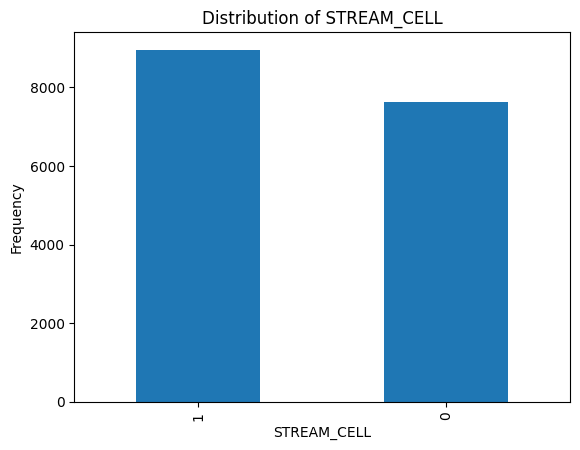

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to your CSV file (16k-cells)
file_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/transformed_UGRID_Darga_16kcells.csv"

# 1) Read the CSV
df = pd.read_csv(file_path)

# 2) Get the frequency counts for STREAM_CELL
counts = df["STREAM_CELL"].value_counts()

print("=== STREAM_CELL Distribution ===")
print(counts)

# 3) Plot as a bar chart
plt.figure()
counts.plot(kind="bar")  # By default, this will plot a bar chart
plt.xlabel("STREAM_CELL")
plt.ylabel("Frequency")
plt.title("Distribution of STREAM_CELL")
plt.show()


=== STREAM_CELL Distribution ===
EQUATION
SCS    7617
DQ     6842
KWE    1293
SWE     820
Name: count, dtype: int64


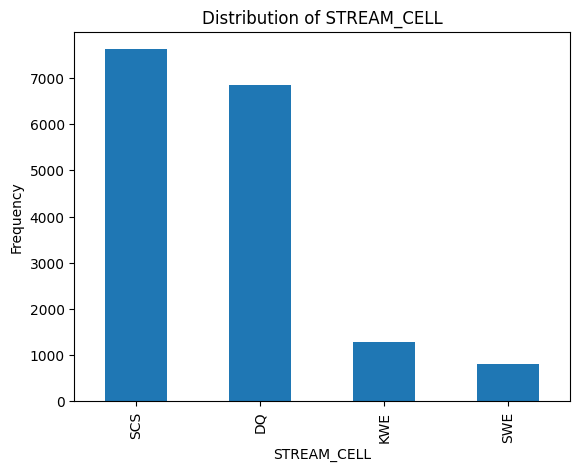

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to your CSV file (16k-cells)
file_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_16kcells.csv"

# 1) Read the CSV
df = pd.read_csv(file_path)

# 2) Get the frequency counts for STREAM_CELL
counts = df["EQUATION"].value_counts()

print("=== STREAM_CELL Distribution ===")
print(counts)

# 3) Plot as a bar chart
plt.figure()
counts.plot(kind="bar")  # By default, this will plot a bar chart
plt.xlabel("STREAM_CELL")
plt.ylabel("Frequency")
plt.title("Distribution of STREAM_CELL")
plt.show()

In [37]:
import pandas as pd
from shapely.geometry import Point
from shapely.ops import unary_union

# 1) Read the 73k CSV
df = pd.read_csv('UGRID_Darga_73kcells.csv')

# 2) Convert each (X, Y) row to a Shapely Point
points = [Point(xy) for xy in zip(df['X'], df['Y'])]

# 3) Compute the convex hull of all points
#    unary_union merges all points into a single geometry; .convex_hull gets the hull
convex_hull_poly = unary_union(points).convex_hull

# 4) Extract the coordinates of the hull’s exterior
#    If the hull is a single polygon, use convex_hull_poly.exterior.coords
#    If it’s multi-part for some reason, you'd need to iterate over each polygon in the geometry
coords = list(convex_hull_poly.exterior.coords)

# 5) Write them out to a text file
with open('mask_boundaries.txt', 'w') as f:
    f.write("Convex Hull Boundary (X, Y) coordinates of Darga Basin:\n")
    for x, y in coords:
        f.write(f"{x}, {y}\n")

print("mask_boundaries.txt created successfully!")


mask_boundaries.txt created successfully!


In [44]:
import geopandas as gpd
import os

# Path to your shapefile (adjust if needed)
shp_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/basins/Basins_Web_V13.shp"

# 1) Read the shapefile into a GeoDataFrame
gdf = gpd.read_file(shp_path)

# 2) Filter for the row(s) where NAME_EN == "Darga"
darga_gdf = gdf[gdf["NAME_EN"] == "Darga"]

# Check how many matching records we got
print(f"Found {len(darga_gdf)} feature(s) with NAME_EN == 'Darga'.")

if len(darga_gdf) == 0:
    print("No features named 'Darga' found in NAME_EN.")
else:
    # 3) Extract the geometry from that row
    #    If there's more than one row, this loops over all of them
    for idx, row in darga_gdf.iterrows():
        darga_geom = row.geometry
        
        # Print WKT of the geometry to screen
        print("\nGeometry for Darga basin (WKT format):")
        print(darga_geom.wkt)
        
        # Optionally, write it to a text file
        out_txt = "Darga_geometry.txt"
        with open(out_txt, "w") as f:
            f.write(darga_geom.wkt)
        
        print(f"\nWrote geometry to {out_txt}")


Found 1 feature(s) with NAME_EN == 'Darga'.

Geometry for Darga basin (WKT format):
POLYGON ((35.33466929535177 31.653671919123838, 35.33560730982953 31.650120112353363, 35.338079661247434 31.64937598001751, 35.34010838789186 31.6488242684253, 35.34020512796434 31.64666925807984, 35.33914765384122 31.64496485754222, 35.34023375608302 31.64343564763709, 35.34125267357206 31.642625837812204, 35.34201217801967 31.641922871043732, 35.34378786511792 31.640511787988657, 35.34535581601813 31.637234215087005, 35.34547956542963 31.634473662429627, 35.34394798581093 31.63200491549452, 35.34550719889819 31.631296859462566, 35.34703150390084 31.63134691213037, 35.348593864615225 31.630876385936517, 35.350418539583984 31.630379794691805, 35.35177189695554 31.628184347229876, 35.35273553042043 31.62643103346545, 35.354527021305046 31.62537316903655, 35.35841437862075 31.62550042850205, 35.36171132471793 31.622879118776382, 35.362507977461235 31.621429345088245, 35.367552925926816 31.622935211291008,

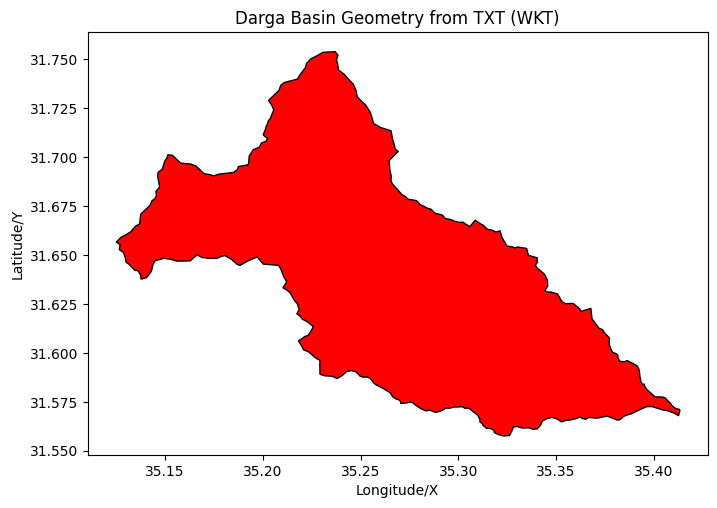

In [45]:
import shapely.wkt
import geopandas as gpd
import matplotlib.pyplot as plt

# 1) Read the WKT geometry from the text file
wkt_file = "Darga_geometry.txt"  # Adjust if needed
with open(wkt_file, 'r') as f:
    wkt_str = f.read().strip()  # load the entire line/string

# 2) Convert the WKT string to a Shapely geometry
geometry = shapely.wkt.loads(wkt_str)

# 3) Create a GeoDataFrame from this single geometry
darga_gdf = gpd.GeoDataFrame([{"geometry": geometry}])  
# Optionally, set a coordinate reference system (CRS) if known, e.g.:
# darga_gdf.crs = "EPSG:4326"  # or whatever your data actually uses

# 4) Plot the geometry
darga_gdf.plot(color="red", edgecolor="black", figsize=(8,6))
plt.title("Darga Basin Geometry from TXT (WKT)")
plt.xlabel("Longitude/X")
plt.ylabel("Latitude/Y")
plt.show()


creating the rain files in the boundaries:

In [52]:
import os
import pandas as pd
import geopandas as gpd
import shapely.wkt

# ----------------------
# 1) READ THE DARGA GEOMETRY (WKT) FROM THE TEXT FILE
# ----------------------
wkt_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/Darga_geometry.txt"
)
with open(wkt_file, "r") as f:
    wkt_str = f.read().strip()

# Parse WKT into a Shapely geometry
darga_poly = shapely.wkt.loads(wkt_str)

# Get the bounding box (minx, miny, maxx, maxy) for a fast pre-filter
minx, miny, maxx, maxy = darga_poly.bounds

# ----------------------
# 2) DEFINE INPUT & OUTPUT FOLDERS
# ----------------------
in_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/rain"
)
out_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga rain"
)
os.makedirs(out_folder, exist_ok=True)

# The years we want to process
years = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# ----------------------
# 3) FUNCTION: FILTER LARGE CSVs IN CHUNKS
# ----------------------
def filter_csv_to_polygon(
    in_csv,
    out_csv,
    polygon,
    bbox,
    chunksize=200_000,  # adjust as needed
    crs="EPSG:4326"     # or your actual coordinate system
):
    """
    Filters the large CSV in `in_csv` to rows whose (longitude, latitude)
    fall within `polygon`.
      - Quick bounding box filter first
      - Then Shapely-based 'within' for exact polygon test
    Appends results to `out_csv`.
    """
    minx, miny, maxx, maxy = bbox
    
    # Overwrite file if it exists, so we write a fresh CSV with headers once
    if os.path.exists(out_csv):
        os.remove(out_csv)

    # Read the CSV in chunks
    with pd.read_csv(in_csv, chunksize=chunksize) as reader:
        for i, chunk in enumerate(reader):
            # 1) Bounding box filter (fast numeric check)
            bb_filtered = chunk[
                (chunk["longitude"] >= minx) & (chunk["longitude"] <= maxx) &
                (chunk["latitude"]  >= miny) & (chunk["latitude"]  <= maxy)
            ]
            if bb_filtered.empty:
                continue

            # 2) Exact polygon test using GeoPandas
            gdf = gpd.GeoDataFrame(
                bb_filtered,
                geometry=gpd.points_from_xy(bb_filtered["longitude"], bb_filtered["latitude"]),
                crs=crs
            )
            inside_poly = gdf[gdf.within(polygon)]
            if inside_poly.empty:
                continue

            # 3) Write to output CSV (drop geometry column)
            inside_poly.drop(columns="geometry").to_csv(
                out_csv,
                mode="a",            # append mode
                index=False,
                header=not os.path.exists(out_csv)  # write header if new file
            )


# ----------------------
# 4) FILTER EACH YEAR
# ----------------------
for yr in years:
    in_csv = os.path.join(in_folder, f"filtered_North_Dead_Sea_RM{yr}_cut.csv")
    out_csv = os.path.join(out_folder, f"darga_rain_{yr}.csv")

    print(f"\nFiltering {in_csv} into {out_csv} ...")
    filter_csv_to_polygon(
        in_csv=in_csv,
        out_csv=out_csv,
        polygon=darga_poly,
        bbox=(minx, miny, maxx, maxy),
        chunksize=200_000   # adjust chunk size as needed for performance
    )

print("\nDone! Check your 'darga rain' folder for the filtered CSVs.")



Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/rain/filtered_North_Dead_Sea_RM2012_cut.csv into /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv ...

Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/rain/filtered_North_Dead_Sea_RM2013_cut.csv into /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv ...

Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/rain/filtered_North_Dead_Sea_RM2014_cut.csv into /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/

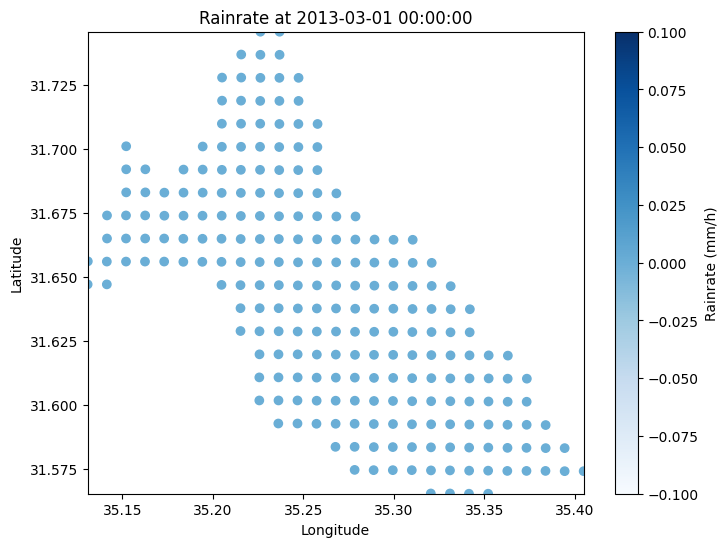

In [55]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# 1) Load the 2013 Darga Rain Data
rain_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga rain/darga_rain_2013.csv"
)
rain_df = pd.read_csv(rain_file)

# 2) Convert 'time' column to datetime
rain_df["time"] = pd.to_datetime(rain_df["time"])

# 3) Filter data for March 1, 2013
selected_date = "2013-03-01"
daily_df = rain_df[rain_df["time"].dt.strftime('%Y-%m-%d') == selected_date]

if daily_df.empty:
    print(f"No data found for {selected_date}.")
else:
    # 4) Grab all unique timestamps for that date, sorted
    timestamps = sorted(daily_df["time"].unique())
    
    # 5) Set up the figure
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Initialize scatter
    sc = ax.scatter([], [], c=[], cmap="Blues",
                    vmin=daily_df["rainrate"].min(),
                    vmax=daily_df["rainrate"].max())
    
    ax.set_xlim(daily_df["longitude"].min(), daily_df["longitude"].max())
    ax.set_ylim(daily_df["latitude"].min(), daily_df["latitude"].max())
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_title(f"Rainrate at {timestamps[0]}")
    
    # Add colorbar
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label("Rainrate (mm/h)")
    
    # 6) Define update function
    def update(frame_index):
        current_time = timestamps[frame_index]
        subset = daily_df[daily_df["time"] == current_time]
        sc.set_offsets(subset[["longitude", "latitude"]].values)
        sc.set_array(subset["rainrate"].values)
        ax.set_title(f"Rainrate at {current_time}")
    
    # 7) Create the animation
    ani = animation.FuncAnimation(
        fig,
        update,
        frames=len(timestamps),
        interval=200,  # ms between frames
        repeat=True
    )
    
    # 8) Display animation
    HTML(ani.to_jshtml())


In [63]:
import pandas as pd

# Path to the CSV
csv_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "discharge/Northern Dead Sea discharge_2012.csv"
)

# Read the CSV into a DataFrame
df = pd.read_csv(csv_path)

# Display the first 5 rows
print(df.head())


   name                 date  rg_qms     lon      lat
0  דרגה  2012-01-01 00:00:00     0.0  35.363  31.6013
1  דרגה  2012-01-01 00:10:00     0.0  35.363  31.6013
2  דרגה  2012-01-01 00:20:00     0.0  35.363  31.6013
3  דרגה  2012-01-01 00:30:00     0.0  35.363  31.6013
4  דרגה  2012-01-01 00:40:00     0.0  35.363  31.6013


In [65]:
import pandas as pd

# Path to the CSV
csv_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "discharge/Northern Dead Sea discharge_2012.csv"
)

# Read the CSV
df = pd.read_csv(csv_path)

# Get unique names in the "name" column
unique_names = df["name"].unique()

print("Unique names in the 'name' column:")
for name in unique_names:
    print(name)


Unique names in the 'name' column:
דרגה
תקוע
ערוגות במעלה כביש90


In [66]:
import os
import pandas as pd

# 1) Define input folder with the discharge CSVs
in_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/discharge"
)

# 2) Define output folder & create it if it doesn't exist
out_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga discharge"
)
os.makedirs(out_folder, exist_ok=True)

# 3) The years to process
years = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# 4) Loop over years, filter for "דרגה", and save
for yr in years:
    in_csv = os.path.join(in_folder, f"Northern Dead Sea discharge_{yr}.csv")
    out_csv = os.path.join(out_folder, f"darga_discharge_{yr}.csv")

    print(f"Filtering {in_csv} for 'דרגה' only...")

    # Read entire CSV
    df = pd.read_csv(in_csv)

    # Filter rows where name == "דרגה"
    df_darga = df[df["name"] == "דרגה"]

    # Write out
    df_darga.to_csv(out_csv, index=False)

print("\nDone! Filtered CSVs for דרגה are in:", out_folder)


Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/discharge/Northern Dead Sea discharge_2012.csv for 'דרגה' only...
Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/discharge/Northern Dead Sea discharge_2013.csv for 'דרגה' only...
Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/discharge/Northern Dead Sea discharge_2014.csv for 'דרגה' only...
Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/discharge/Northern Dead Sea discharge_2015.csv for 'דרגה' only...
Filtering /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/discharge/Northern Dead Sea discharge_2016.csv for 'דרגה' only...
Filtering /media/data-ssd/PINN/DATA

In [67]:
import os
import pandas as pd

# Path to the new folder
darga_discharge_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga discharge"
)

# 1) List all CSV files in that folder
csv_files = [f for f in os.listdir(darga_discharge_folder) if f.endswith(".csv")]
csv_files.sort()  # optional, but let's sort them alphabetically

# 2) Read and display head of each CSV
for csv_file in csv_files:
    csv_path = os.path.join(darga_discharge_folder, csv_file)
    df = pd.read_csv(csv_path)
    print(f"\n--- {csv_file} ---")
    print(df.head())  # show first 5 rows
    print(f"Shape: {df.shape}")
    print(f"Unique names in 'name': {df['name'].unique()}")



--- darga_discharge_2012.csv ---
   name                 date  rg_qms     lon      lat
0  דרגה  2012-01-01 00:00:00     0.0  35.363  31.6013
1  דרגה  2012-01-01 00:10:00     0.0  35.363  31.6013
2  דרגה  2012-01-01 00:20:00     0.0  35.363  31.6013
3  דרגה  2012-01-01 00:30:00     0.0  35.363  31.6013
4  דרגה  2012-01-01 00:40:00     0.0  35.363  31.6013
Shape: (39456, 5)
Unique names in 'name': ['דרגה']

--- darga_discharge_2013.csv ---
   name                 date  rg_qms     lon      lat
0  דרגה  2013-01-01 00:00:00     0.0  35.363  31.6013
1  דרגה  2013-01-01 00:10:00     0.0  35.363  31.6013
2  דרגה  2013-01-01 00:20:00     0.0  35.363  31.6013
3  דרגה  2013-01-01 00:30:00     0.0  35.363  31.6013
4  דרגה  2013-01-01 00:40:00     0.0  35.363  31.6013
Shape: (39312, 5)
Unique names in 'name': ['דרגה']

--- darga_discharge_2014.csv ---
   name                 date  rg_qms     lon      lat
0  דרגה  2014-01-01 00:00:00     0.0  35.363  31.6013
1  דרגה  2014-01-01 00:10:00     0.0  35

In [68]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# ------------------------------------------------
# 1) SETUP PATHS & READ THE TWO CSV FILES
# ------------------------------------------------
rain_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga rain/darga_rain_2012.csv"
)
discharge_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga discharge/darga_discharge_2012.csv"
)

rain_df = pd.read_csv(rain_file)
discharge_df = pd.read_csv(discharge_file)

# ------------------------------------------------
# 2) PARSE DATES & FILTER A SINGLE DAY
# ------------------------------------------------
# Adjust the date string as needed (YYYY-MM-DD)
selected_date = "2012-01-01"

# Convert time columns to datetime
rain_df["time"] = pd.to_datetime(rain_df["time"])           # rain has 'time'
discharge_df["date"] = pd.to_datetime(discharge_df["date"]) # discharge has 'date'

# Filter each for the selected date
daily_rain = rain_df[rain_df["time"].dt.strftime('%Y-%m-%d') == selected_date]
daily_discharge = discharge_df[discharge_df["date"].dt.strftime('%Y-%m-%d') == selected_date]

# ------------------------------------------------
# 3) BUILD A COMMON TIME AXIS (UNION OF TIMESTAMPS)
# ------------------------------------------------
timestamps_rain = set(daily_rain["time"].unique())
timestamps_disc = set(daily_discharge["date"].unique())
all_timestamps = sorted(timestamps_rain.union(timestamps_disc))

print(f"Rain records for {selected_date}: {len(daily_rain)}")
print(f"Discharge records for {selected_date}: {len(daily_discharge)}")
print(f"Number of time frames: {len(all_timestamps)}")

if len(all_timestamps) == 0:
    print(f"No data found for {selected_date}.")
else:
    # ------------------------------------------------
    # 4) PREPARE FIGURE & SCATTERS
    # ------------------------------------------------
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # For RAIN data
    # vmin=0, vmax=... sets a consistent color scale from 0 up to the max rainrate that day
    sc_rain = ax.scatter([], [], c=[], cmap="Blues",
                         vmin=0, vmax=daily_rain["rainrate"].max() if not daily_rain.empty else 1)

    # For DISCHARGE data
    # vmin=0, vmax=... sets a consistent color scale from 0 up to the max discharge that day
    sc_discharge = ax.scatter([], [], c=[], cmap="Reds",
                              vmin=0, vmax=daily_discharge["rg_qms"].max() if not daily_discharge.empty else 1)

    # Set axis limits to encompass both datasets if they exist
    all_lons = pd.concat([daily_rain["longitude"], daily_discharge["lon"]], ignore_index=True)
    all_lats = pd.concat([daily_rain["latitude"], daily_discharge["lat"]], ignore_index=True)

    if len(all_lons) > 0 and len(all_lats) > 0:
        ax.set_xlim(all_lons.min(), all_lons.max())
        ax.set_ylim(all_lats.min(), all_lats.max())
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Two colorbars for clarity
    cbar_rain = plt.colorbar(sc_rain, ax=ax, label="Rainrate (mm/h)")
    cbar_discharge = plt.colorbar(sc_discharge, ax=ax, label="Discharge (m³/s)")

    # We'll update the title each frame
    title_txt = ax.set_title(f"Rain & Discharge on {selected_date}")

    # ------------------------------------------------
    # 5) ANIMATION UPDATE FUNCTION
    # ------------------------------------------------
    def update(frame_idx):
        current_time = all_timestamps[frame_idx]
        
        # RAIN subset for this time
        subset_rain = daily_rain[daily_rain["time"] == current_time]
        sc_rain.set_offsets(subset_rain[["longitude", "latitude"]].values if not subset_rain.empty else [])
        sc_rain.set_array(subset_rain["rainrate"].values if not subset_rain.empty else [])
        
        # DISCHARGE subset for this time
        subset_disc = daily_discharge[daily_discharge["date"] == current_time]
        sc_discharge.set_offsets(subset_disc[["lon", "lat"]].values if not subset_disc.empty else [])
        sc_discharge.set_array(subset_disc["rg_qms"].values if not subset_disc.empty else [])
        
        # Update title with the current timestamp
        title_txt.set_text(f"Rain & Discharge at {current_time}")

    # ------------------------------------------------
    # 6) CREATE THE ANIMATION
    # ------------------------------------------------
    ani = animation.FuncAnimation(
        fig, update,
        frames=len(all_timestamps),
        interval=500,   # milliseconds between frames
        repeat=True
    )

    # Close the static figure so only the animation cell is displayed
    plt.close(fig)

    # ------------------------------------------------
    # 7) DISPLAY THE ANIMATION
    # ------------------------------------------------
    HTML(ani.to_jshtml())


Rain records for 2012-01-01: 33264
Discharge records for 2012-01-01: 144
Number of time frames: 144


I have 231 points of rain in this grid

In [2]:
import os
import glob
import pandas as pd

# --- 1) Define your folders ---
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
rain_folder      = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"
spatial_folder   = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# --- 2) Gather CSV files for discharge (wildcards) ---
discharge_files = glob.glob(os.path.join(discharge_folder, "darga_discharge_*.csv"))

# --- 3) Gather CSV files for rain (wildcards) ---
rain_files = glob.glob(os.path.join(rain_folder, "darga_rain_*.csv"))

# --- 4) Explicitly list the UGRID/spatial files (as you mentioned you have 3) ---
spatial_files = [
    os.path.join(spatial_folder, "UGRID_Darga_6kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_16kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_73kcells.csv")
]

# Optional: If you'd like to check they exist:
# for f in spatial_files:
#    if not os.path.exists(f):
#        print("Warning: file does not exist ->", f)

# Function to quickly show columns + shape + optional preview
def describe_csv_data(file_path):
    df = pd.read_csv(file_path)
    print(f"File: {os.path.basename(file_path)}")
    print(f"  Shape: {df.shape}")
    print("  Columns:", list(df.columns))
    # Uncomment to see a small sample of the data:
    # print(df.head(3))
    print("--------------------------------------------------")

# --- 5) Iterate over each file set and display features ---

# Discharge Data
print("=== Discharge Files ===")
for file_path in discharge_files:
    describe_csv_data(file_path)

# Rain Data
print("\n=== Rain Files ===")
for file_path in rain_files:
    describe_csv_data(file_path)

# Spatial/UGRID Data
print("\n=== Spatial/UGRID Files ===")
for file_path in spatial_files:
    describe_csv_data(file_path)


=== Discharge Files ===
File: darga_discharge_2012.csv
  Shape: (39456, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2016.csv
  Shape: (39456, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2019.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2015.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2014.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2013.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2020.csv
  Shape: (39456, 5)
 

In [3]:
import os
import glob
import pandas as pd

# Folder containing the rain CSVs
rain_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"

# Find the CSV files matching the pattern
rain_files = glob.glob(os.path.join(rain_folder, "darga_rain_*.csv"))

for file_path in rain_files:
    df = pd.read_csv(file_path)
    # Drop the columns 'elevation' and 'slope_calculated'
    df.drop(columns=['elevation', 'slope_calculated'], errors='ignore', inplace=True)
    # Overwrite the original file
    df.to_csv(file_path, index=False)


In [4]:
import os
import glob
import pandas as pd

# --- 1) Define your folders ---
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
rain_folder      = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"
spatial_folder   = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# --- 2) Gather CSV files for discharge (wildcards) ---
discharge_files = glob.glob(os.path.join(discharge_folder, "darga_discharge_*.csv"))

# --- 3) Gather CSV files for rain (wildcards) ---
rain_files = glob.glob(os.path.join(rain_folder, "darga_rain_*.csv"))

# --- 4) Explicitly list the UGRID/spatial files (as you mentioned you have 3) ---
spatial_files = [
    os.path.join(spatial_folder, "UGRID_Darga_6kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_16kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_73kcells.csv")
]

# Optional: If you'd like to check they exist:
# for f in spatial_files:
#    if not os.path.exists(f):
#        print("Warning: file does not exist ->", f)

# Function to quickly show columns + shape + optional preview
def describe_csv_data(file_path):
    df = pd.read_csv(file_path)
    print(f"File: {os.path.basename(file_path)}")
    print(f"  Shape: {df.shape}")
    print("  Columns:", list(df.columns))
    # Uncomment to see a small sample of the data:
    # print(df.head(3))
    print("--------------------------------------------------")

# --- 5) Iterate over each file set and display features ---

# Discharge Data
print("=== Discharge Files ===")
for file_path in discharge_files:
    describe_csv_data(file_path)

# Rain Data
print("\n=== Rain Files ===")
for file_path in rain_files:
    describe_csv_data(file_path)

# Spatial/UGRID Data
print("\n=== Spatial/UGRID Files ===")
for file_path in spatial_files:
    describe_csv_data(file_path)


=== Discharge Files ===
File: darga_discharge_2012.csv
  Shape: (39456, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2016.csv
  Shape: (39456, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2019.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2015.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2014.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2013.csv
  Shape: (39312, 5)
  Columns: ['name', 'date', 'rg_qms', 'lon', 'lat']
--------------------------------------------------
File: darga_discharge_2020.csv
  Shape: (39456, 5)
 

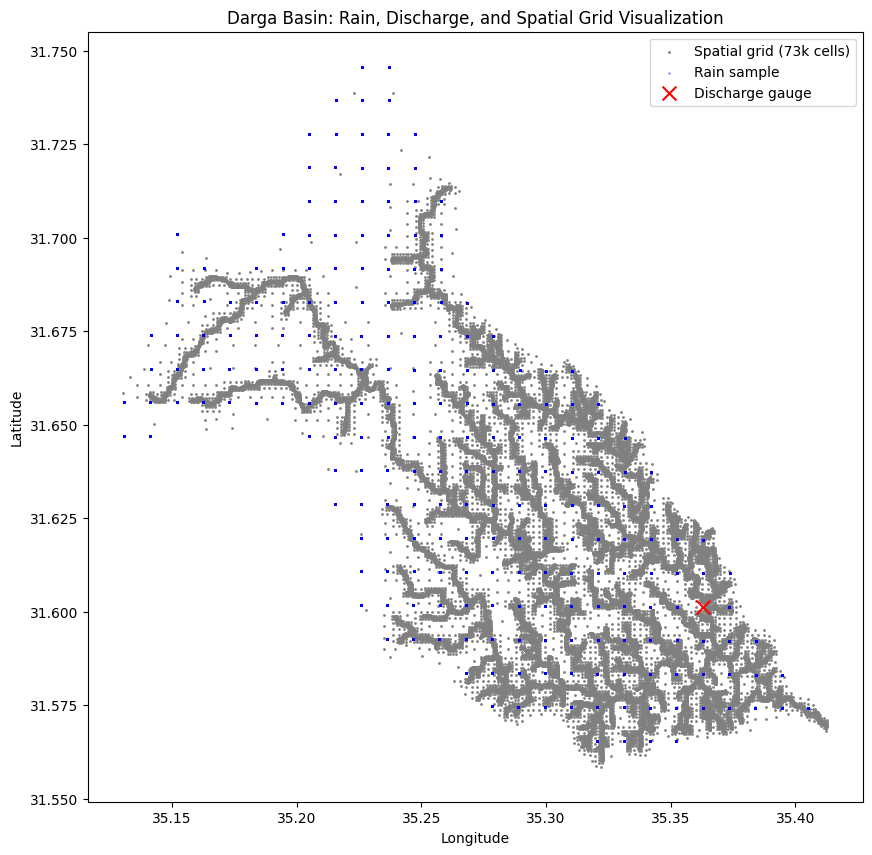

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import random

# 1. Specify paths for one file from each category
rain_file      = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
spatial_file   = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_73kcells.csv"

# 2. Load each file into a DataFrame
df_rain = pd.read_csv(rain_file)
df_discharge = pd.read_csv(discharge_file)
df_spatial = pd.read_csv(spatial_file)

# 3. Because rain files are huge, take a small random sample for plotting
#    (Adjust sample size or method to your needs; 50k is just an example.)
df_rain_sample = df_rain.sample(n=50000, random_state=42)

# 4. Prepare a figure
plt.figure(figsize=(10, 10))

# 4a. Plot the spatial grid (73k points) in gray
#     According to your note, X ~ longitude, Y ~ latitude
plt.scatter(
    df_spatial["X"], 
    df_spatial["Y"], 
    s=1, 
    c="gray", 
    label="Spatial grid (73k cells)"
)

# 4b. Plot the sampled rain points in blue (latitude, longitude)
#     We use alpha for transparency so it’s easier to see overlap
plt.scatter(
    df_rain_sample["longitude"], 
    df_rain_sample["latitude"], 
    s=1, 
    c="blue", 
    alpha=0.3, 
    label="Rain sample"
)

# 4c. Plot the discharge station(s) in red
#     If you only have 1 station in each file, 
#     either plot all rows (they share the same coords) or take the first row.
#     If you have multiple stations, you might need to group by station name.
#     Here, we assume it’s a single station repeated each row.
plt.scatter(
    df_discharge["lon"].iloc[0], 
    df_discharge["lat"].iloc[0], 
    s=100, 
    c="red", 
    marker="x", 
    label="Discharge gauge"
)

# 5. Labeling and legend
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Darga Basin: Rain, Discharge, and Spatial Grid Visualization")
plt.legend()

# 6. Show the plot
plt.show()


In [17]:
import os
import glob
import pandas as pd

# Paths (adjust if needed)
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
rain_folder      = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"
spatial_folder   = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# Collect file paths using glob (discharge & rain)
discharge_files = glob.glob(os.path.join(discharge_folder, "darga_discharge_*.csv"))
rain_files      = glob.glob(os.path.join(rain_folder,      "darga_rain_*.csv"))

# Spatial files are explicitly known
spatial_files = [
    os.path.join(spatial_folder, "UGRID_Darga_6kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_16kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_73kcells.csv")
]

def show_csv_head(file_path, n=5):
    """Reads a CSV and prints the first n rows (head)."""
    df = pd.read_csv(file_path)
    print(f"\nFile: {os.path.basename(file_path)}")
    print(df.head(n))  # Show the first n rows
    print("-" * 80)

# Discharge
print("=== Discharge Files (preview) ===")
for f in discharge_files:
    show_csv_head(f)

# Rain
print("\n=== Rain Files (preview) ===")
for f in rain_files:
    show_csv_head(f)

# Spatial
print("\n=== Spatial/UGRID Files (preview) ===")
for f in spatial_files:
    show_csv_head(f)


=== Discharge Files (preview) ===

File: darga_discharge_2012.csv
   name                 date  rg_qms       lon       lat
0  דרגה  2012-01-01 00:00:00     0.0  35.36552  31.60015
1  דרגה  2012-01-01 00:10:00     0.0  35.36552  31.60015
2  דרגה  2012-01-01 00:20:00     0.0  35.36552  31.60015
3  דרגה  2012-01-01 00:30:00     0.0  35.36552  31.60015
4  דרגה  2012-01-01 00:40:00     0.0  35.36552  31.60015
--------------------------------------------------------------------------------

File: darga_discharge_2016.csv
   name                 date  rg_qms       lon       lat
0  דרגה  2016-01-01 00:00:00     0.0  35.36552  31.60015
1  דרגה  2016-01-01 00:10:00     0.0  35.36552  31.60015
2  דרגה  2016-01-01 00:20:00     0.0  35.36552  31.60015
3  דרגה  2016-01-01 00:30:00     0.0  35.36552  31.60015
4  דרגה  2016-01-01 00:40:00     0.0  35.36552  31.60015
--------------------------------------------------------------------------------

File: darga_discharge_2019.csv
   name                 

In [7]:
import os
import glob
import pandas as pd

# 1. Folders
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
spatial_folder   = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# 2. Discharge files
discharge_files = glob.glob(os.path.join(discharge_folder, "darga_discharge_*.csv"))

# 2a. Overwrite the lon/lat with the updated station coordinates
new_lon = 35.36552
new_lat = 31.60015

for file_path in discharge_files:
    df = pd.read_csv(file_path)

    # Update lon/lat columns for all rows
    df['lon'] = new_lon
    df['lat'] = new_lat

    # Overwrite the same file
    df.to_csv(file_path, index=False)

# 3. Spatial/UGRID files
spatial_files = [
    os.path.join(spatial_folder, "UGRID_Darga_6kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_16kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_73kcells.csv"),
]

# 3a. Rename columns X->longitude, Y->latitude
for file_path in spatial_files:
    df = pd.read_csv(file_path)

    # Rename columns if they exist. 
    # If your columns are guaranteed to be 'X' and 'Y', you can remove the 'if' checks.
    rename_dict = {}
    if 'X' in df.columns:
        rename_dict['X'] = 'longitude'
    if 'Y' in df.columns:
        rename_dict['Y'] = 'latitude'

    df.rename(columns=rename_dict, inplace=True)

    # Overwrite file
    df.to_csv(file_path, index=False)

print("Done. Discharge files now have updated lon/lat, and spatial files have (longitude, latitude) columns.")


Done. Discharge files now have updated lon/lat, and spatial files have (longitude, latitude) columns.


In [16]:
import os
import glob
import pandas as pd

# Paths (adjust if needed)
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
rain_folder      = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"
spatial_folder   = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# Collect file paths using glob (discharge & rain)
discharge_files = glob.glob(os.path.join(discharge_folder, "darga_discharge_*.csv"))
rain_files      = glob.glob(os.path.join(rain_folder,      "darga_rain_*.csv"))

# Spatial files are explicitly known
spatial_files = [
    os.path.join(spatial_folder, "UGRID_Darga_6kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_16kcells.csv"),
    os.path.join(spatial_folder, "UGRID_Darga_73kcells.csv")
]

def show_csv_head(file_path, n=5):
    """Reads a CSV and prints the first n rows (head)."""
    df = pd.read_csv(file_path)
    print(f"\nFile: {os.path.basename(file_path)}")
    print(df.head(n))  # Show the first n rows
    print("-" * 80)

# Discharge
print("=== Discharge Files (preview) ===")
for f in discharge_files:
    show_csv_head(f)

# Rain
print("\n=== Rain Files (preview) ===")
for f in rain_files:
    show_csv_head(f)

# Spatial
print("\n=== Spatial/UGRID Files (preview) ===")
for f in spatial_files:
    show_csv_head(f)


=== Discharge Files (preview) ===

File: darga_discharge_2012.csv
   name                 date  rg_qms       lon       lat
0  דרגה  2012-01-01 00:00:00     0.0  35.36552  31.60015
1  דרגה  2012-01-01 00:10:00     0.0  35.36552  31.60015
2  דרגה  2012-01-01 00:20:00     0.0  35.36552  31.60015
3  דרגה  2012-01-01 00:30:00     0.0  35.36552  31.60015
4  דרגה  2012-01-01 00:40:00     0.0  35.36552  31.60015
--------------------------------------------------------------------------------

File: darga_discharge_2016.csv
   name                 date  rg_qms       lon       lat
0  דרגה  2016-01-01 00:00:00     0.0  35.36552  31.60015
1  דרגה  2016-01-01 00:10:00     0.0  35.36552  31.60015
2  דרגה  2016-01-01 00:20:00     0.0  35.36552  31.60015
3  דרגה  2016-01-01 00:30:00     0.0  35.36552  31.60015
4  דרגה  2016-01-01 00:40:00     0.0  35.36552  31.60015
--------------------------------------------------------------------------------

File: darga_discharge_2019.csv
   name                 

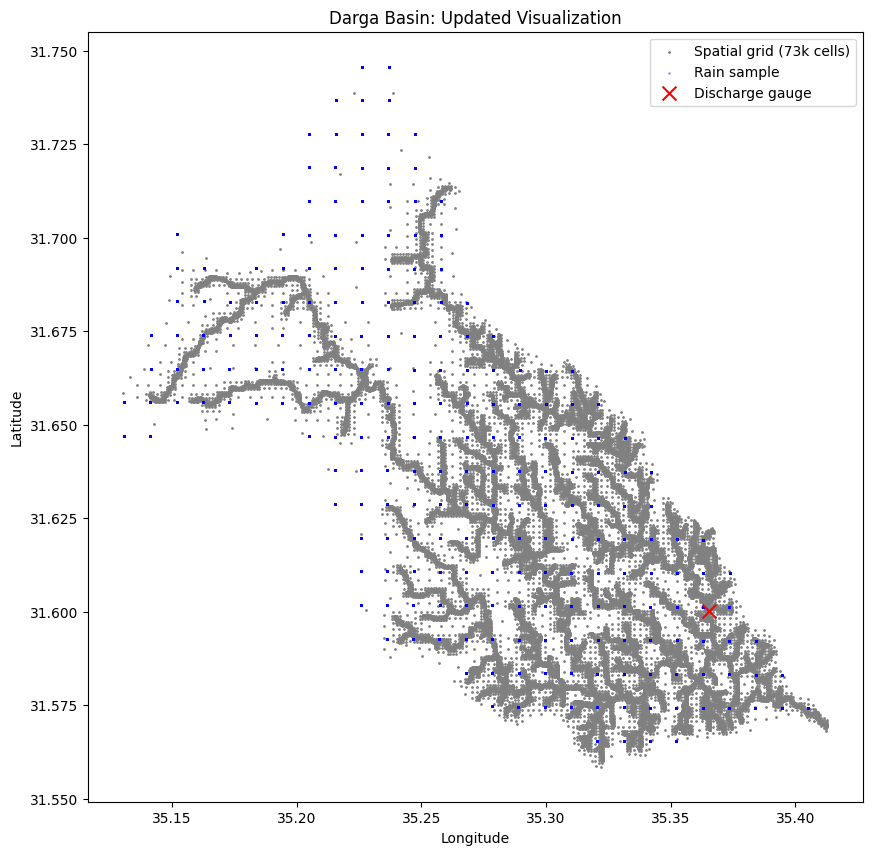

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Specify paths for one file from each category
rain_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
spatial_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_73kcells.csv"

# 2. Load each file into a DataFrame
df_rain = pd.read_csv(rain_file)
df_discharge = pd.read_csv(discharge_file)
df_spatial = pd.read_csv(spatial_file)

# 3. Because rain files are large, take a small random sample for plotting
df_rain_sample = df_rain.sample(n=50000, random_state=42)

# 4. Prepare the figure
plt.figure(figsize=(10, 10))

# 4a. Plot the spatial grid (73k points) in gray
#     Now the spatial file has columns 'longitude' and 'latitude' 
plt.scatter(
    df_spatial["longitude"],
    df_spatial["latitude"],
    s=1,
    c="gray",
    label="Spatial grid (73k cells)"
)

# 4b. Plot the sampled rain points in blue
plt.scatter(
    df_rain_sample["longitude"],
    df_rain_sample["latitude"],
    s=1,
    c="blue",
    alpha=0.3,
    label="Rain sample"
)

# 4c. Plot the discharge station (in red with an 'x' marker)
#     Now each row in df_discharge has the updated coords (lon, lat) = (35.36552, 31.60015)
plt.scatter(
    df_discharge["lon"].iloc[0],
    df_discharge["lat"].iloc[0],
    s=100,
    c="red",
    marker="x",
    label="Discharge gauge"
)

# 5. Labeling and legend
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Darga Basin: Updated Visualization")
plt.legend()

# 6. Show the plot
plt.show()


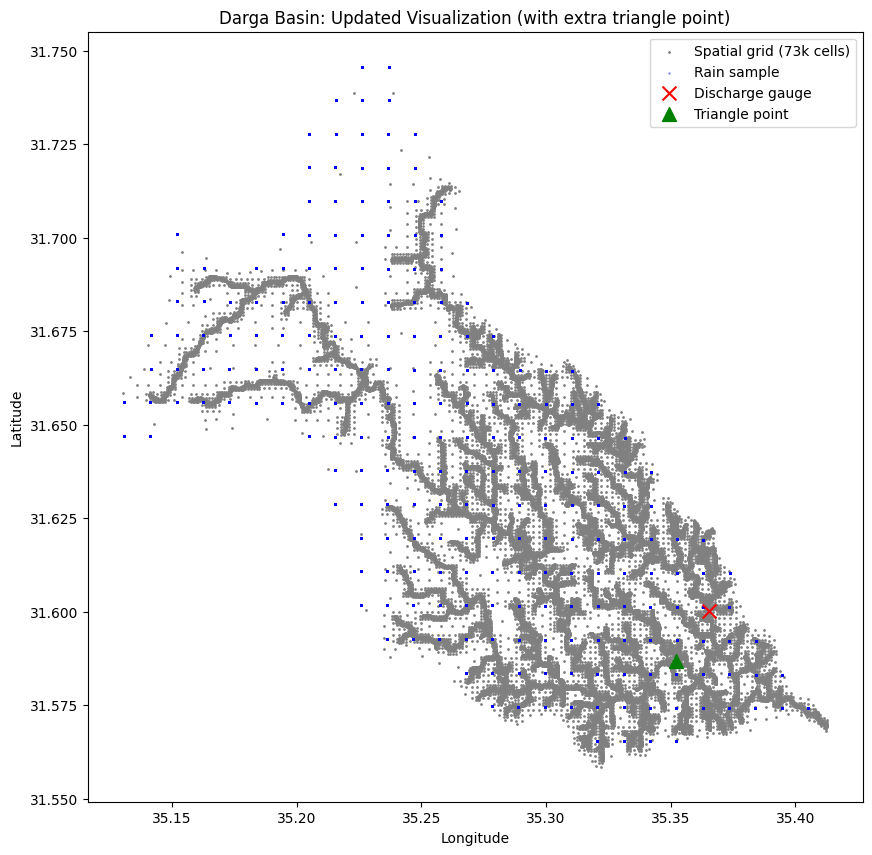

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Specify paths for one file from each category
rain_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
spatial_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_73kcells.csv"

# 2. Load each file into a DataFrame
df_rain = pd.read_csv(rain_file)
df_discharge = pd.read_csv(discharge_file)
df_spatial = pd.read_csv(spatial_file)

# 3. Because rain files are large, take a small random sample for plotting
df_rain_sample = df_rain.sample(n=50000, random_state=42)

# 4. Prepare the figure
plt.figure(figsize=(10, 10))

# 4a. Plot the spatial grid (73k points) in gray
plt.scatter(
    df_spatial["longitude"],
    df_spatial["latitude"],
    s=1,
    c="gray",
    label="Spatial grid (73k cells)"
)

# 4b. Plot the sampled rain points in blue
plt.scatter(
    df_rain_sample["longitude"],
    df_rain_sample["latitude"],
    s=1,
    c="blue",
    alpha=0.3,
    label="Rain sample"
)

# 4c. Plot the discharge station (in red with an 'x' marker)
plt.scatter(
    df_discharge["lon"].iloc[0],
    df_discharge["lat"].iloc[0],
    s=100,
    c="red",
    marker="x",
    label="Discharge gauge"
)

# 4d. Add the new point (triangle marker)
extra_lon = 35.35232
extra_lat = 31.58677
plt.scatter(
    extra_lon,
    extra_lat,
    s=100,
    c="green",
    marker="^",
    label="Triangle point"
)

# 5. Labeling and legend
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Darga Basin: Updated Visualization (with extra triangle point)")
plt.legend()

# 6. Show the plot
plt.show()


In [13]:
import os
import glob
import pandas as pd

# Folder with discharge CSVs
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"

# All CSV files
discharge_files = glob.glob(os.path.join(discharge_folder, "darga_discharge_*.csv"))

# To store all names from all files
all_names = set()

# Loop through each file, read just the 'name' column, and add unique names to the set
for file_path in discharge_files:
    df = pd.read_csv(file_path, usecols=['name'])
    all_names.update(df['name'].unique())

print("Unique station names across all discharge files:")
for name in all_names:
    print("-", name)


Unique station names across all discharge files:
- דרגה


In [15]:
import os
import pandas as pd

def calculate_manning_n(slope, roughness, d50mm):
    """
    Custom formula to estimate Manning's n from:
      - SLOPE       (unitless or degrees, must be consistent with your calibration),
      - ROUGHNESS   (dimensionless index from your data),
      - D50MM       (median grain diameter, in millimeters).
    
    Formula (example):
        n = 0.02
          + 0.0001 * SLOPE
          + 0.005  * ROUGHNESS
          + 0.034  * ( (D50MM / 1000) ** (1/6) )
    
    :param slope: float
    :param roughness: float
    :param d50mm: float, D50 in millimeters
    :return: float, calculated Manning's n
    """
    # Convert millimeters to meters for the Strickler portion
    d50_m = d50mm / 1000.0
    
    # Example combined formula
    # You can adjust these constants based on calibration or references
    manning_n = (
        0.02 +
        0.0001 * slope +
        0.005  * roughness +
        0.034  * (d50_m ** (1/6))
    )
    
    return manning_n

def add_manning_n_to_ugrid_files():
    """
    Reads each UGRID Darga CSV (6k, 16k, 73k cells), calculates a new 'manning_n' column
    from 'SLOPE', 'ROUGHNESS', and 'D50MM' columns using a custom formula, 
    and overwrites the original files with the updated data.
    
    NOTE: This script overwrites the existing files. 
          Make backups if you need to preserve the originals.
    """
    # Folder containing the UGRID files
    spatial_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

    # The 3 CSV files we want to modify
    ugrid_files = [
        "UGRID_Darga_6kcells.csv",
        "UGRID_Darga_16kcells.csv",
        "UGRID_Darga_73kcells.csv"
    ]

    for filename in ugrid_files:
        file_path = os.path.join(spatial_folder, filename)
        print(f"\nProcessing {filename}...")
        
        df = pd.read_csv(file_path)
        
        # Check that the required columns exist
        required_cols = ["SLOPE", "ROUGHNESS", "D50MM"]
        missing = [col for col in required_cols if col not in df.columns]
        if missing:
            print(f"  SKIPPING - Missing columns: {missing}")
            continue
        
        # Calculate manning_n for each row
        df["manning_n"] = df.apply(
            lambda row: calculate_manning_n(
                slope=row["SLOPE"],
                roughness=row["ROUGHNESS"],
                d50mm=row["D50MM"]
            ),
            axis=1
        )
        
        # Overwrite the CSV with the new column
        df.to_csv(file_path, index=False)
        print(f"  --> 'manning_n' column added/updated. Saved to {filename}.")

# --------------------------------------------------------------------
# Run the function if this script is executed directly (in .py file).
# In a Jupyter notebook, just call add_manning_n_to_ugrid_files().
if __name__ == "__main__":
    add_manning_n_to_ugrid_files()



Processing UGRID_Darga_6kcells.csv...
  --> 'manning_n' column added/updated. Saved to UGRID_Darga_6kcells.csv.

Processing UGRID_Darga_16kcells.csv...
  --> 'manning_n' column added/updated. Saved to UGRID_Darga_16kcells.csv.

Processing UGRID_Darga_73kcells.csv...
  --> 'manning_n' column added/updated. Saved to UGRID_Darga_73kcells.csv.


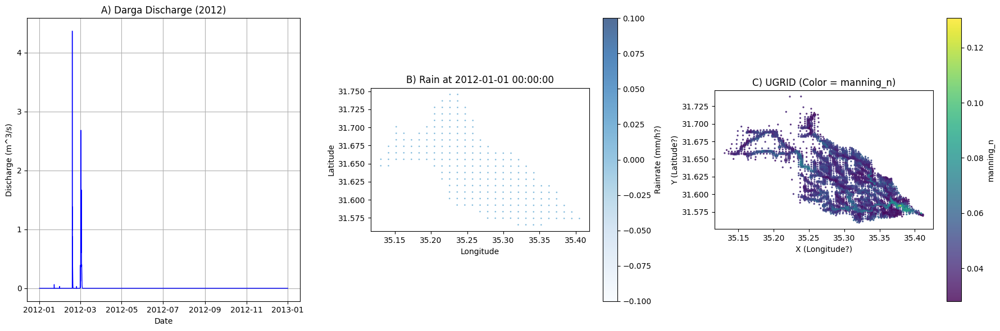

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_darga_data():
    """
    Example script to visualize:
      A) Discharge time series (10-min resolution, one year).
      B) Rain distribution for a single timestamp (scatter).
      C) Spatial data colored by manning_n.
    """

    # ----------------------------
    # 1) DISCHARGE TIME SERIES
    # ----------------------------
    # Pick one year of discharge data
    discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"

    df_discharge = pd.read_csv(discharge_file)
    # Convert 'date' to datetime
    df_discharge["date"] = pd.to_datetime(df_discharge["date"])

    # ----------------------------
    # 2) RAIN FOR ONE TIMESTAMP
    # ----------------------------
    # We'll also pick the 2012 file for consistency
    rain_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"

    df_rain = pd.read_csv(rain_file)
    
    # Choose a single timestamp to visualize (string must match your data format)
    single_timestamp = "2012-01-01 00:00:00"
    df_rain_single = df_rain[df_rain["time"] == single_timestamp].copy()

    # Because the rain file can be huge, let's see how many points we have:
    # If it's still large, we can sample
    if len(df_rain_single) > 100000:  # e.g. limit to 100k
        df_rain_single = df_rain_single.sample(n=100000, random_state=42)

    # ----------------------------
    # 3) SPATIAL UGRID (COLORED BY MANNING_N)
    # ----------------------------
    # Let's pick the 6k file for easier plotting
    ugrid_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells.csv"

    df_spatial = pd.read_csv(ugrid_file)

    # Note: columns might be 'X'/'Y' or 'longitude'/'latitude'
    # Based on your earlier steps, you still have X and Y. 
    # If you renamed them, adjust accordingly.
    # We'll assume they're still named "X" and "Y" here:
    x_col = "X"
    y_col = "Y"
    
    # Check if manning_n column exists
    color_col = "manning_n" if "manning_n" in df_spatial.columns else "SLOPE"

    # ----------------------------
    # PLOTTING
    # ----------------------------
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

    # --- A) Discharge time series ---
    ax = axes[0]
    ax.plot(df_discharge["date"], df_discharge["rg_qms"], color="blue", linewidth=1)
    ax.set_title("A) Darga Discharge (2012)")
    ax.set_xlabel("Date")
    ax.set_ylabel("Discharge (m^3/s)")
    ax.grid(True)

    # --- B) Rain map for one timestamp ---
    ax = axes[1]
    scatter_rain = ax.scatter(
        df_rain_single["longitude"],
        df_rain_single["latitude"],
        c=df_rain_single["rainrate"],
        s=1,
        cmap="Blues",
        alpha=0.7
    )
    ax.set_title(f"B) Rain at {single_timestamp}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    cbar = plt.colorbar(scatter_rain, ax=ax)
    cbar.set_label("Rainrate (mm/h?)")  # Adjust units if needed
    ax.set_aspect("equal", "box")

    # --- C) Spatial UGRID colored by manning_n (or slope) ---
    ax = axes[2]
    scatter_spatial = ax.scatter(
        df_spatial[x_col],
        df_spatial[y_col],
        c=df_spatial[color_col],
        s=2,
        cmap="viridis",
        alpha=0.8
    )
    ax.set_title(f"C) UGRID (Color = {color_col})")
    ax.set_xlabel("X (Longitude?)")
    ax.set_ylabel("Y (Latitude?)")
    cbar = plt.colorbar(scatter_spatial, ax=ax)
    cbar.set_label(color_col)
    ax.set_aspect("equal", "box")

    plt.tight_layout()
    plt.show()

# Run the function (in a Jupyter Notebook, just call plot_darga_data() in a cell)
if __name__ == "__main__":
    plot_darga_data()


In [20]:
import os
import logging
import pandas as pd
import numpy as np

# For ordinary kriging
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
# Folder with the original 3 UGRID CSVs
SPATIAL_FOLDER = "/path/to/spatial_ugrid"  # e.g. .../dem slope UGRID
UGRID_FILES = [
    "UGRID_Darga_6kcells.csv",
    "UGRID_Darga_16kcells.csv",
    "UGRID_Darga_73kcells.csv"
]

# Output subfolder to store the "latlon" versions of UGRID
# (so we don't overwrite the originals)
LATLON_UGRID_FOLDER = "/path/to/spatial_ugrid_latlon"

# Folder with the 8 original rain CSVs (one per year)
RAIN_FOLDER = "/path/to/darga_rain_files"
RAIN_YEARS = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# Output subfolders for final kriged+merged results (one per resolution)
KRIGED_OUTPUT_BASE = "/path/to/kriged_merged_results"
# e.g.  .../kriged_merged_results/6k_rain_kriged_merged
#       .../kriged_merged_results/16k_rain_kriged_merged
#       .../kriged_merged_results/73k_rain_kriged_merged

# ------------------------------------------------------------------------------
# SETUP LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# PART A: Create new UGRID CSVs with columns renamed X->latitude, Y->longitude
# ------------------------------------------------------------------------------
def rename_xy_to_latlon():
    """
    Reads the 3 UGRID CSVs and creates new copies where columns:
       X -> latitude
       Y -> longitude
    Saves the new CSVs in LATLON_UGRID_FOLDER with suffix '_latlon.csv'.
    """
    os.makedirs(LATLON_UGRID_FOLDER, exist_ok=True)
    
    for fname in UGRID_FILES:
        original_path = os.path.join(SPATIAL_FOLDER, fname)
        latlon_path   = os.path.join(LATLON_UGRID_FOLDER, fname.replace(".csv", "_latlon.csv"))
        
        logging.info(f"Reading original UGRID: {original_path}")
        df = pd.read_csv(original_path)
        
        rename_dict = {}
        if "X" in df.columns:
            rename_dict["X"] = "latitude"
        if "Y" in df.columns:
            rename_dict["Y"] = "longitude"
        
        df.rename(columns=rename_dict, inplace=True)
        
        logging.info(f"Saving renamed lat/lon UGRID to: {latlon_path}")
        df.to_csv(latlon_path, index=False)

# ------------------------------------------------------------------------------
# PART B: Ordinary Kriging + Merge in one stage
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Demonstration function:
      - Takes 'rain_subset' = DataFrame with columns [latitude, longitude, rainrate]
      - Takes arrays 'grid_lat', 'grid_lon' for the UGRID points
      - Performs ordinary kriging to get rain estimates at each point in 'grid_lat', 'grid_lon'.
      - Returns a numpy array of kriged values (same length as grid_lat).
    
    NOTE: This is a minimal example with a default variogram model. 
          For real data, you should calibrate or specify e.g. 'spherical', 'exponential', etc.
    """
    # We assume these are in numeric projected coordinates or lat/lon (be cautious with lat/lon).
    # Convert to numpy arrays
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    # Build the kriging object
    # We'll pick a basic variogram model for demonstration:
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="linear",  # or 'spherical', 'exponential', ...
        verbose=False,
        enable_plotting=False
    )
    
    # Now execute interpolation on the UGRID lat/lon
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

def krige_rain_one_year(ugrid_file_latlon, rain_file, output_csv):
    """
    Single-stage approach:
      - 1) Read UGRID with lat/lon & static columns
      - 2) Read year of rain data
      - 3) For each timestamp, subset rain & krige to the UGRID points
      - 4) Merge result with the static columns (like DEM, SLOPE, etc.)
      - 5) Save single CSV with [ID, latitude, longitude, ... time, rainrate]
    """
    logging.info(f">>> Kriging {rain_file} onto grid {ugrid_file_latlon} ...")
    
    # 1) Load UGRID
    df_ugrid = pd.read_csv(ugrid_file_latlon)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("  UGRID missing 'latitude' or 'longitude' columns. Aborting.")
        return
    
    # We'll create an output DataFrame to store results
    # We'll only store ID, time, and the kriged rain in the merging process
    # Then do a final merge with static columns.
    
    # 2) Load the rain data
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("  Rain data missing 'time' column. Aborting.")
        return
    
    # 2a) Get unique timestamps
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    
    # For demonstration, let's limit to fewer time steps (e.g., 3) to keep the code example short.
    # Remove or adjust for full processing.
    # unique_times = unique_times[:3]  # comment out to do all times
    
    logging.info(f"  Found {len(unique_times)} unique timestamps in {os.path.basename(rain_file)}.")
    
    # We'll gather results in a list of DataFrames
    results_list = []
    
    # Convert UGRID lat/lon to numpy for repeated use
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    
    for i, tstamp in enumerate(unique_times):
        # Subset the rain data for this timestamp
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            # Can't krige with fewer than say 3 points
            # We'll skip or set to 0
            logging.warning(f"    Timestamp={tstamp}, not enough points for kriging. Setting 0.")
            kriged_vals = np.zeros_like(grid_lat)
        else:
            # Run kriging
            kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
        
        # Construct a small DataFrame: [ID, time, rainrate_kriged]
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        
        results_list.append(df_kriged)
        
        if (i+1) % 50 == 0:
            logging.info(f"    Processed {i+1} / {len(unique_times)} timestamps.")
    
    # Concatenate all time steps
    df_kriged_all = pd.concat(results_list, ignore_index=True)
    
    # 4) Merge with static columns from UGRID
    # The final columns might be: [ID, latitude, longitude, DEM, SLOPE, ... time, rainrate]
    # We'll do a left merge on 'ID'.
    # We'll drop duplicates in ugrid columns except ID if any
    static_cols = [c for c in df_ugrid.columns if c not in ["ID", "latitude", "longitude"]]
    
    # Merge
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID", "latitude", "longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    # 5) Save final
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  Saved kriged & merged data: {output_csv}")

# ------------------------------------------------------------------------------
# PART C: MASTER FUNCTION
# ------------------------------------------------------------------------------
def main():
    # 1) Create the new latlon UGRID files
    rename_xy_to_latlon()
    
    # 2) For each latlon UGRID file, create an output folder, then krige each year’s data
    for fname in UGRID_FILES:
        # The new latlon version
        latlon_name = fname.replace(".csv", "_latlon.csv")
        latlon_ugrid_path = os.path.join(LATLON_UGRID_FOLDER, latlon_name)
        
        # Figure out the grid resolution from the name for the output folder
        # e.g. "6kcells" => "6k_rain_kriged_merged"
        if "6kcells" in fname:
            out_subdir = "6k_rain_kriged_merged"
        elif "16kcells" in fname:
            out_subdir = "16k_rain_kriged_merged"
        elif "73kcells" in fname:
            out_subdir = "73k_rain_kriged_merged"
        else:
            out_subdir = "unknown_resolution"
        
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        os.makedirs(out_dir, exist_ok=True)
        
        logging.info(f"=== Processing {fname} -> {latlon_name} => Output: {out_dir}")
        
        for year in RAIN_YEARS:
            rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
            output_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
            
            if not os.path.exists(rain_file):
                logging.warning(f"Rain file not found: {rain_file}. Skipping.")
                continue
            
            krige_rain_one_year(
                ugrid_file_latlon=latlon_ugrid_path,
                rain_file=rain_file,
                output_csv=output_csv
            )

# ------------------------------------------------------------------------------
# PART D: BASIC TEST
# ------------------------------------------------------------------------------
def test_kriging_results():
    """
    A minimal test that checks:
      - At least one output CSV was created.
      - The output CSV has the columns we expect, e.g.:
         ['ID', 'time', 'rainrate', 'latitude', 'longitude', 'DEM', ...]
    """
    # Let's just pick one known output path and check if it exists and has columns.
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2012_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error("[TEST] Expected output file not found. Test FAILED.")
        return
    
    df_test = pd.read_csv(test_file, nrows=100)  # read partial
    expected_cols = {"ID", "time", "rainrate", "latitude", "longitude"}
    missing = expected_cols - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Columns missing: {missing}. Test FAILED.")
    else:
        logging.info("[TEST] Output file has expected columns. Test PASSED.")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()


PermissionError: [Errno 13] Permission denied: '/path'

In [21]:
import os
import logging
import pandas as pd
import numpy as np

# If you haven't installed PyKrige, do:
#   pip install pykrige
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
# 1) Original folder containing the UGRID CSVs
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# 2) Folder to store new copies of UGRID with 'X->latitude' and 'Y->longitude'
LATLON_UGRID_FOLDER = os.path.join(SPATIAL_FOLDER, "spatial_ugrid_latlon")

# 3) Folder with your 8 rain CSVs
RAIN_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"

# 4) Final output base folder for the kriged + merged results
KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results")

# The 3 UGRID CSV names (in SPATIAL_FOLDER)
UGRID_FILES = [
    "UGRID_Darga_6kcells.csv",
    "UGRID_Darga_16kcells.csv",
    "UGRID_Darga_73kcells.csv"
]

# The years of rain data we have
RAIN_YEARS = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# ------------------------------------------------------------------------------
# SETUP LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# FUNCTION A: Rename X->latitude, Y->longitude and save new files
# ------------------------------------------------------------------------------
def rename_xy_to_latlon():
    """
    Reads each UGRID CSV from SPATIAL_FOLDER and creates new copies in LATLON_UGRID_FOLDER
    where columns X->latitude, Y->longitude. Doesn't overwrite the originals.
    """
    os.makedirs(LATLON_UGRID_FOLDER, exist_ok=True)
    
    for fname in UGRID_FILES:
        original_path = os.path.join(SPATIAL_FOLDER, fname)
        if not os.path.exists(original_path):
            logging.warning(f"[rename_xy_to_latlon] File not found: {original_path}. Skipping.")
            continue
        
        # Build new filename, e.g. "UGRID_Darga_6kcells_latlon.csv"
        latlon_name = fname.replace(".csv", "_latlon.csv")
        latlon_path = os.path.join(LATLON_UGRID_FOLDER, latlon_name)
        
        logging.info(f"Reading original UGRID: {original_path}")
        df = pd.read_csv(original_path)
        
        rename_dict = {}
        if "X" in df.columns:
            rename_dict["X"] = "latitude"
        if "Y" in df.columns:
            rename_dict["Y"] = "longitude"
        
        df.rename(columns=rename_dict, inplace=True)
        
        logging.info(f"Saving renamed UGRID to: {latlon_path}")
        df.to_csv(latlon_path, index=False)

# ------------------------------------------------------------------------------
# FUNCTION B1: Ordinary Kriging for a single timestep
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Example function:
      - 'rain_subset' has [latitude, longitude, rainrate]
      - 'grid_lat' and 'grid_lon' are arrays for the UGRID points
      - Return array of kriged values at each UGRID point.

    NOTE:
    - Kriging in lat/lon degrees is not ideal for real geostatistics,
      but we'll do it for demonstration. 
    - Adjust variogram_model for your data (e.g. 'spherical','exponential').
    """
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="linear",
        verbose=False,
        enable_plotting=False
    )
    
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
# FUNCTION B2: Krige entire year + merge with static columns
# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_file_latlon, rain_file, output_csv):
    """
    1) Load UGRID (with new lat/lon + static columns).
    2) Load the year's rain data [time, latitude, longitude, rainrate].
    3) For each timestamp, subset & krige => 'rainrate' at each UGRID cell.
    4) Merge with static columns => final DataFrame.
    5) Save as 'output_csv'.
    """
    logging.info(f"=== Kriging {os.path.basename(rain_file)} onto {os.path.basename(ugrid_file_latlon)} => {output_csv}")
    
    # 1) Load UGRID
    df_ugrid = pd.read_csv(ugrid_file_latlon)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] UGRID missing 'latitude' or 'longitude'. Aborting.")
        return
    
    # 2) Load rain data
    if not os.path.exists(rain_file):
        logging.error(f"[krige_rain_one_year] Rain file not found: {rain_file}")
        return
    
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] Rain data missing 'time' column. Aborting.")
        return
    
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    logging.info(f"  Found {len(unique_times)} timestamps in {os.path.basename(rain_file)}.")
    
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    results_list = []
    
    # 3) For each timestamp, perform kriging
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            logging.warning(f"  Time={tstamp}: Not enough points to krige. Setting to 0.")
            kriged_vals = np.zeros_like(grid_lat)
        else:
            kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
        
        # Build partial DataFrame: ID, time, rainrate
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results_list.append(df_kriged)
        
        if (i+1) % 50 == 0:
            logging.info(f"  Processed {i+1}/{len(unique_times)} timestamps.")
    
    # Combine all times
    df_kriged_all = pd.concat(results_list, ignore_index=True)
    
    # 4) Merge with static columns
    static_cols = [c for c in df_ugrid.columns if c not in ("ID","latitude","longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID","latitude","longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    # 5) Save final CSV
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] {output_csv}")

# ------------------------------------------------------------------------------
# MAIN
# ------------------------------------------------------------------------------
def main():
    # A) Rename X->latitude, Y->longitude in new UGRID files
    rename_xy_to_latlon()
    
    # B) For each latlon UGRID file, krige each year's rain & merge
    for fname in UGRID_FILES:
        # The new latlon version
        latlon_name = fname.replace(".csv", "_latlon.csv")
        latlon_ugrid_path = os.path.join(LATLON_UGRID_FOLDER, latlon_name)
        
        # Decide which subfolder (6k, 16k, 73k, etc.)
        if "6kcells" in fname:
            out_subdir = "6k_rain_kriged_merged"
        elif "16kcells" in fname:
            out_subdir = "16k_rain_kriged_merged"
        elif "73kcells" in fname:
            out_subdir = "73k_rain_kriged_merged"
        else:
            out_subdir = "unknown_resolution"
        
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        os.makedirs(out_dir, exist_ok=True)
        
        logging.info(f"--- Processing UGRID: {fname} => {latlon_name} => Output: {out_dir}")
        
        for year in RAIN_YEARS:
            rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
            output_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
            
            krige_rain_one_year(
                ugrid_file_latlon=latlon_ugrid_path,
                rain_file=rain_file,
                output_csv=output_csv
            )

# ------------------------------------------------------------------------------
# OPTIONAL TEST
# ------------------------------------------------------------------------------
def test_kriging_results():
    """
    Minimal check: verify we have at least one final CSV with the expected columns.
    """
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2012_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error(f"[TEST] File not found: {test_file}. Test FAILED.")
        return
    
    df_test = pd.read_csv(test_file, nrows=50)
    required_cols = {"ID","time","rainrate","latitude","longitude"}
    missing = required_cols - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Missing {missing} in {test_file}. FAILED.")
    else:
        logging.info("[TEST] Found expected columns. PASSED!")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()


2025-03-23 14:50:51,046 [INFO] Reading original UGRID: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells.csv
2025-03-23 14:50:51,060 [INFO] Saving renamed UGRID to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/spatial_ugrid_latlon/UGRID_Darga_6kcells_latlon.csv
2025-03-23 14:50:51,120 [INFO] Reading original UGRID: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_16kcells.csv
2025-03-23 14:50:51,140 [INFO] Saving renamed UGRID to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/spatial_ugrid_latlon/UGRID_Darga_16kcells_latlon.csv
2025-03-23 14:50:51,266 [INFO] Reading original UGRID: /media/data-ssd/PINN/DATA/model data 

ValueError: Each lower bound must be strictly less than each upper bound.

In [22]:
import os
import pandas as pd

# Folder where your original UGRID files are stored
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# Names of the original files
UGRID_FILES = [
    "UGRID_Darga_6kcells.csv",
    "UGRID_Darga_16kcells.csv",
    "UGRID_Darga_73kcells.csv"
]

def rename_ugrid_in_place():
    """
    1. For each file in UGRID_FILES, rename columns X->latitude, Y->longitude.
    2. Overwrite the original file content.
    3. Rename the file itself to *_latlon.csv.
    """
    for fname in UGRID_FILES:
        old_path = os.path.join(SPATIAL_FOLDER, fname)
        if not os.path.exists(old_path):
            print(f"WARNING: File not found => {old_path}")
            continue
        
        # Read file
        df = pd.read_csv(old_path)
        
        # Build rename dictionary
        rename_dict = {}
        if "X" in df.columns:
            rename_dict["X"] = "latitude"
        if "Y" in df.columns:
            rename_dict["Y"] = "longitude"
        
        # Rename columns
        df.rename(columns=rename_dict, inplace=True)
        
        # Overwrite the original file content
        df.to_csv(old_path, index=False)
        
        # Build the new file name (e.g. UGRID_Darga_6kcells_latlon.csv)
        new_fname = fname.replace(".csv", "_latlon.csv")
        new_path = os.path.join(SPATIAL_FOLDER, new_fname)
        
        # Rename the file itself
        os.rename(old_path, new_path)
        print(f"Renamed file and columns: {fname} => {new_fname}")

# Run
if __name__ == "__main__":
    rename_ugrid_in_place()


Renamed file and columns: UGRID_Darga_6kcells.csv => UGRID_Darga_6kcells_latlon.csv
Renamed file and columns: UGRID_Darga_16kcells.csv => UGRID_Darga_16kcells_latlon.csv
Renamed file and columns: UGRID_Darga_73kcells.csv => UGRID_Darga_73kcells_latlon.csv


In [23]:
import os
import logging
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
# Main folder with the 3 UGRID files:
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# The 3 original CSV names (will be renamed in place)
UGRID_FILES = [
    "UGRID_Darga_6kcells.csv",
    "UGRID_Darga_16kcells.csv",
    "UGRID_Darga_73kcells.csv"
]

# Where the 8 rain CSV files live (one per year)
RAIN_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"

# Output folder for final kriged+merged results
KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results")

# Years of rain data
RAIN_YEARS = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# ------------------------------------------------------------------------------
# LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# STEP A: RENAME UGRID FILES IN PLACE
# ------------------------------------------------------------------------------
def rename_ugrid_in_place():
    """
    1. For each file in UGRID_FILES, rename columns X->latitude, Y->longitude.
    2. Overwrite the file content.
    3. Rename the file to '*_latlon.csv'.
    
    WARNING: This modifies files in SPATIAL_FOLDER and changes their names!
    """
    for fname in UGRID_FILES:
        old_path = os.path.join(SPATIAL_FOLDER, fname)
        if not os.path.exists(old_path):
            logging.warning(f"[rename_ugrid_in_place] File not found => {old_path}")
            continue
        
        df = pd.read_csv(old_path)
        
        # Rename columns if they exist
        rename_dict = {}
        if "X" in df.columns:
            rename_dict["X"] = "latitude"
        if "Y" in df.columns:
            rename_dict["Y"] = "longitude"
        
        df.rename(columns=rename_dict, inplace=True)
        
        # Overwrite the CSV content
        df.to_csv(old_path, index=False)
        
        # Rename the file name (e.g. from UGRID_Darga_6kcells.csv -> UGRID_Darga_6kcells_latlon.csv)
        new_fname = fname.replace(".csv", "_latlon.csv")
        new_path = os.path.join(SPATIAL_FOLDER, new_fname)
        
        os.rename(old_path, new_path)
        logging.info(f"Renamed: {fname} => {new_fname}, columns X->latitude, Y->longitude")

# ------------------------------------------------------------------------------
# STEP B1: Ordinary Kriging for One Timestep
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Perform kriging in lat/lon degrees using a 'spherical' variogram model.
    :param rain_subset: DataFrame with [latitude, longitude, rainrate]
    :param grid_lat: UGRID 'latitude' array
    :param grid_lon: UGRID 'longitude' array
    :return: np.array of kriged values across the grid
    """
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="spherical",
        verbose=False,
        enable_plotting=False
    )
    
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
# STEP B2: Krige an Entire Year + Merge
# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_path, rain_file, output_csv):
    """
    - Load the 'latlon' UGRID (with static attributes).
    - Load year of rain data [time, latitude, longitude, rainrate].
    - For each timestamp, if <3 points => 0; if std=0 => fill mean; else krige.
    - Merge with UGRID static columns => final df => CSV in output_csv.
    """
    logging.info(f"=== Kriging {os.path.basename(rain_file)} onto {os.path.basename(ugrid_path)} => {output_csv}")
    
    df_ugrid = pd.read_csv(ugrid_path)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] UGRID missing 'latitude' or 'longitude'. Aborting.")
        return
    
    if not os.path.exists(rain_file):
        logging.error(f"[krige_rain_one_year] Rain file not found: {rain_file}")
        return
    
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] Rain data missing 'time' column. Aborting.")
        return
    
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    logging.info(f"  Found {len(unique_times)} timestamps in {os.path.basename(rain_file)}.")
    
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    
    results_list = []
    
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            # Not enough points => 0
            kriged_vals = np.zeros_like(grid_lat)
        else:
            # Check variation
            val_std = subset["rainrate"].std()
            if val_std < 1e-8:
                # All same or nearly => fill with mean
                mean_val = subset["rainrate"].mean()
                kriged_vals = np.full_like(grid_lat, mean_val)
            else:
                # Attempt kriging
                try:
                    kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
                except Exception as e:
                    logging.error(f"  Time={tstamp} kriging error => {e}, fallback=mean.")
                    mean_val = subset["rainrate"].mean()
                    kriged_vals = np.full_like(grid_lat, mean_val)
        
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results_list.append(df_kriged)
        
        if (i+1) % 50 == 0:
            logging.info(f"  Processed {i+1}/{len(unique_times)} timesteps.")
    
    df_kriged_all = pd.concat(results_list, ignore_index=True)
    
    # Merge with static columns
    static_cols = [c for c in df_ugrid.columns if c not in ("ID","latitude","longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID","latitude","longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] Saved: {output_csv}")

# ------------------------------------------------------------------------------
# MAIN
# ------------------------------------------------------------------------------
def main():
    # 1) Rename UGRID in place (X->latitude, Y->longitude, rename files).
    rename_ugrid_in_place()
    
    # 2) After renaming, each file is now e.g. "UGRID_Darga_6kcells_latlon.csv"
    # Let's figure out the new names so we can do the kriging step.
    # We'll store them in a list so we can loop easily.
    new_ugrid_files = [
        f.replace(".csv", "_latlon.csv")
        for f in UGRID_FILES
    ]
    
    for fname in new_ugrid_files:
        # Full path to the new latlon file
        latlon_ugrid_path = os.path.join(SPATIAL_FOLDER, fname)
        
        # Decide subfolder based on whether it's 6k, 16k, or 73k
        if "6kcells_latlon" in fname:
            out_subdir = "6k_rain_kriged_merged"
        elif "16kcells_latlon" in fname:
            out_subdir = "16k_rain_kriged_merged"
        elif "73kcells_latlon" in fname:
            out_subdir = "73k_rain_kriged_merged"
        else:
            out_subdir = "unknown_resolution"
        
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        os.makedirs(out_dir, exist_ok=True)
        
        logging.info(f"--- Kriging for UGRID: {fname} => Output folder: {out_dir}")
        
        for year in RAIN_YEARS:
            rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
            out_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
            
            krige_rain_one_year(
                ugrid_path=latlon_ugrid_path,
                rain_file=rain_file,
                output_csv=out_csv
            )

# ------------------------------------------------------------------------------
# OPTIONAL TEST
# ------------------------------------------------------------------------------
def test_kriging_results():
    """
    Minimal check for one final CSV, e.g. the 6k 2012 data,
    to see if it has the expected columns.
    """
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2012_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error(f"[TEST] Not found => {test_file}.")
        return
    
    df_test = pd.read_csv(test_file, nrows=20)
    required = {"ID","time","rainrate","latitude","longitude"}
    missing = required - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Missing columns => {missing}")
    else:
        logging.info("[TEST] Found expected columns => PASSED!")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()


2025-03-23 15:00:10,464 [WARNING] [rename_ugrid_in_place] File not found => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells.csv
2025-03-23 15:00:10,465 [WARNING] [rename_ugrid_in_place] File not found => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_16kcells.csv
2025-03-23 15:00:10,465 [WARNING] [rename_ugrid_in_place] File not found => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_73kcells.csv
2025-03-23 15:00:10,466 [INFO] --- Kriging for UGRID: UGRID_Darga_6kcells_latlon.csv => Output folder: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged
2025-03-23 15:00:10

KeyboardInterrupt: 

In [24]:
import os
import logging
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

UGRID_FILES = [
    "UGRID_Darga_6kcells_latlon.csv", 
    "UGRID_Darga_16kcells_latlon.csv", 
    "UGRID_Darga_73kcells_latlon.csv"
]

RAIN_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"

KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results_test")

RAIN_YEARS = [2012]  # Just pick one year for a quick test

# Set this to True to limit timestamps/data
TEST_MODE = True

# ------------------------------------------------------------------------------
# LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    OK = OrdinaryKriging(
        rain_subset["latitude"].values,
        rain_subset["longitude"].values,
        rain_subset["rainrate"].values,
        variogram_model="spherical",
        verbose=False,
        enable_plotting=False
    )
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_path, rain_file, output_csv):
    logging.info(f"=== TEST Kriging {os.path.basename(rain_file)} => {output_csv}")
    
    # 1) Load UGRID
    df_ugrid = pd.read_csv(ugrid_path)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] UGRID missing 'latitude' or 'longitude'. Aborting.")
        return
    
    # 2) Load rain
    if not os.path.exists(rain_file):
        logging.error(f"[krige_rain_one_year] Missing => {rain_file}")
        return
    
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] 'time' column missing. Aborting.")
        return
    
    # Pick a small subset of timestamps
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    
    if TEST_MODE:
        unique_times = unique_times[:2]  # only the first 2 timestamps
    
    logging.info(f"  Found {len(unique_times)} timestamps (TEST MODE).")
    
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    
    results = []
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        # Also pick only the first 10 points for speed
        if TEST_MODE:
            subset = subset.head(10)
        
        if len(subset) < 3:
            # Not enough data => 0
            kriged_vals = np.zeros_like(grid_lat)
        else:
            std_val = subset["rainrate"].std()
            if std_val < 1e-8:
                mean_val = subset["rainrate"].mean()
                kriged_vals = np.full_like(grid_lat, mean_val)
            else:
                try:
                    kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
                except Exception as e:
                    logging.error(f"Kriging error => {e}. Fallback=mean.")
                    mean_val = subset["rainrate"].mean()
                    kriged_vals = np.full_like(grid_lat, mean_val)
        
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results.append(df_kriged)
        
        logging.info(f"  - Time={tstamp}, subset size={len(subset)} => done")
    
    df_kriged_all = pd.concat(results, ignore_index=True)
    
    # Merge with static columns
    static_cols = [c for c in df_ugrid.columns if c not in ("ID","latitude","longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID","latitude","longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] Saved => {output_csv}")

# ------------------------------------------------------------------------------
def main():
    # We assume you've already renamed your files to *_latlon.csv.
    # We'll just pick one or two to test:
    
    # Create an output folder
    os.makedirs(KRIGED_OUTPUT_BASE, exist_ok=True)
    
    for fname in UGRID_FILES:
        # e.g. "UGRID_Darga_6kcells_latlon.csv"
        latlon_ugrid_path = os.path.join(SPATIAL_FOLDER, fname)
        
        # Decide subfolder
        if "6kcells_latlon" in fname:
            out_subdir = "6k_test"
        elif "16kcells_latlon" in fname:
            out_subdir = "16k_test"
        elif "73kcells_latlon" in fname:
            out_subdir = "73k_test"
        else:
            out_subdir = "unknown_test"
        
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        os.makedirs(out_dir, exist_ok=True)
        
        logging.info(f"Test kriging for {fname} => {out_dir}")
        
        for year in RAIN_YEARS:
            rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
            output_csv = os.path.join(out_dir, f"darga_rain_{year}_TEST_merged.csv")
            
            krige_rain_one_year(
                ugrid_path=latlon_ugrid_path,
                rain_file=rain_file,
                output_csv=output_csv
            )

# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()


2025-03-23 15:04:20,348 [INFO] Test kriging for UGRID_Darga_6kcells_latlon.csv => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results_test/6k_test
2025-03-23 15:04:20,348 [INFO] === TEST Kriging darga_rain_2012.csv => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results_test/6k_test/darga_rain_2012_TEST_merged.csv
2025-03-23 15:04:22,372 [INFO]   Found 2 timestamps (TEST MODE).
2025-03-23 15:04:22,712 [INFO]   - Time=2012-01-01 00:00:00, subset size=10 => done
2025-03-23 15:04:23,054 [INFO]   - Time=2012-01-01 00:10:00, subset size=10 => done
2025-03-23 15:04:23,167 [INFO]   [DONE] Saved => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results_test/6k_test/darga_rain_2012_TEST_merged.c

FileNotFoundError: [Errno 2] No such file or directory: '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results_test/16k_test/darga_rain_2012_TEST_merged.csv'

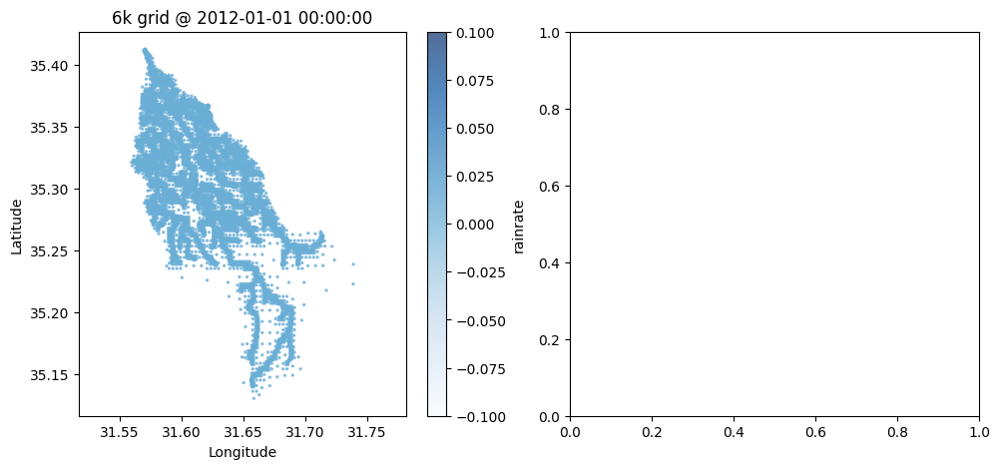

In [25]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Adjust these to your actual output subfolders
base_test_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results_test"

# The three new test folders
sixk_test_file = os.path.join(base_test_folder, "6k_test", "darga_rain_2012_TEST_merged.csv")
sixteenk_test_file = os.path.join(base_test_folder, "16k_test", "darga_rain_2012_TEST_merged.csv")
seventythreek_test_file = os.path.join(base_test_folder, "73k_test", "darga_rain_2012_TEST_merged.csv")

# Choose which timestamp you want to visualize from the two you tested
timestamp_to_plot = "2012-01-01 00:00:00"  # or "2012-01-01 00:10:00"

def plot_kriged_rain(csv_path, label):
    """Read a test CSV, filter to one timestamp, scatter-plot by rainrate."""
    df = pd.read_csv(csv_path)
    # Filter to the chosen time
    df_sub = df[df["time"] == timestamp_to_plot]
    
    if df_sub.empty:
        print(f"No data found for {timestamp_to_plot} in {csv_path}")
        return
    
    plt.scatter(
        df_sub["longitude"],
        df_sub["latitude"],
        c=df_sub["rainrate"],
        s=2,
        cmap="Blues",
        alpha=0.7,
        label=label
    )
    
    plt.title(f"{label} @ {timestamp_to_plot}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    cbar = plt.colorbar()
    cbar.set_label("rainrate")
    plt.axis("equal")

def main():
    plt.figure(figsize=(18, 5))
    
    # 1) 6k
    plt.subplot(1, 3, 1)
    plot_kriged_rain(sixk_test_file, "6k grid")
    
    # 2) 16k
    plt.subplot(1, 3, 2)
    plot_kriged_rain(sixteenk_test_file, "16k grid")
    
    # 3) 73k
    plt.subplot(1, 3, 3)
    plot_kriged_rain(seventythreek_test_file, "73k grid")
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()


In [ ]:
ok. write the full script again. If you have something that you can do to improve the run time its good - if not never mind. (like I asked before - for 3 spatial res etc...)

In [29]:
import os
import logging
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIGURATION / PATHS
# ------------------------------------------------------------------------------
# 1) Folder with the already-renamed UGRID files (*_latlon.csv)
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# 2) The 3 UGRID files, which should already have columns [latitude, longitude, ...]
UGRID_FILES = [
    "UGRID_Darga_6kcells_latlon.csv",
    "UGRID_Darga_16kcells_latlon.csv",
    "UGRID_Darga_73kcells_latlon.csv"
]

# 3) Folder with 8 rain CSV files (2012..2016, 2018..2020)
RAIN_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"

# 4) Years of rain data
RAIN_YEARS = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# 5) Output base folder for kriged + merged
KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results")

# 6) Whether to skip pure-zero timestamps (common in arid regions)
SKIP_ZERO_TIMES = True

# ------------------------------------------------------------------------------
# LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# ORDINARY KRIGING FOR ONE TIMESTEP
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Krige using 'spherical' variogram in lat/lon degrees.
    :param rain_subset: DataFrame with [latitude, longitude, rainrate]
    :param grid_lat: array for UGRID lat
    :param grid_lon: array for UGRID lon
    :return: 1D array of kriged values
    """
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="spherical",
        verbose=False,
        enable_plotting=False
    )
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
# KRIGE AN ENTIRE YEAR + MERGE
# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_file, rain_file, output_csv):
    """
    1) Load the latlon UGRID (static columns).
    2) Load one year's rain data [time, latitude, longitude, rainrate].
    3) For each timestamp:
       - If <3 points => fill domain with 0
       - If stdev < ~0 => fill domain with mean
       - Else do kriging
    4) Merge with UGRID static columns => final df => CSV
    """
    logging.info(f"=== Kriging {os.path.basename(rain_file)} => {os.path.basename(ugrid_file)} => {output_csv}")
    
    # Load UGRID
    df_ugrid = pd.read_csv(os.path.join(SPATIAL_FOLDER, ugrid_file))
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] Missing 'latitude' or 'longitude' in UGRID. Aborting.")
        return
    
    # Load rain
    full_rain_path = os.path.join(RAIN_FOLDER, rain_file)
    if not os.path.exists(full_rain_path):
        logging.error(f"[krige_rain_one_year] Rain file not found => {full_rain_path}")
        return
    df_rain = pd.read_csv(full_rain_path)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] 'time' column missing in rain data. Aborting.")
        return
    
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    logging.info(f"  Found {len(unique_times)} timestamps in {rain_file}.")
    
    # Optional skip zero
    if SKIP_ZERO_TIMES:
        times_to_skip = []
        for t in unique_times:
            sub = df_rain[df_rain["time"] == t]
            # If there's no nonzero value => skip
            if not (sub["rainrate"] > 0).any():
                times_to_skip.append(t)
        if times_to_skip:
            logging.info(f"  Skipping {len(times_to_skip)} all-zero timestamps.")
            unique_times = [t for t in unique_times if t not in times_to_skip]
    
    logging.info(f"  Processing {len(unique_times)} timestamps after skip.")
    
    # Prepare arrays for kriging
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    results = []
    
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            kriged_vals = np.zeros_like(grid_lat)
        else:
            val_std = subset["rainrate"].std()
            if val_std < 1e-8:
                mean_val = subset["rainrate"].mean()
                kriged_vals = np.full_like(grid_lat, mean_val)
            else:
                try:
                    kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
                except Exception as e:
                    logging.error(f"  Time={tstamp} Kriging error => {e}, fallback=mean.")
                    mean_val = subset["rainrate"].mean()
                    kriged_vals = np.full_like(grid_lat, mean_val)
        
        df_out = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results.append(df_out)
        
        if (i+1) % 100 == 0:
            logging.info(f"    Processed {i+1}/{len(unique_times)} timesteps.")
    
    df_kriged_all = pd.concat(results, ignore_index=True)
    
    # Merge with static columns
    static_cols = [c for c in df_ugrid.columns if c not in ("ID","latitude","longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID","latitude","longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    os.makedirs(os.path.dirname(output_csv), exist_ok=True)
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] Saved => {output_csv}")

# ------------------------------------------------------------------------------
# MAIN
# ------------------------------------------------------------------------------
def main():
    # For each latlon UGRID, figure out the output subfolder
    for ugrid_file in UGRID_FILES:
        if "16kcells_latlon" in ugrid_file:
            out_subdir = "16k_rain_kriged_merged"
        elif "6kcells_latlon" in ugrid_file:
            out_subdir = "6k_rain_kriged_merged"
        elif "73kcells_latlon" in ugrid_file:
            out_subdir = "73k_rain_kriged_merged"
        else:
            out_subdir = "unknown_resolution"
        
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        logging.info(f"--- Processing UGRID: {ugrid_file} => {out_dir}")
        
        # For each year
        for y in RAIN_YEARS:
            rain_file = f"darga_rain_{y}.csv"
            out_csv = os.path.join(out_dir, f"darga_rain_{y}_kriged_merged.csv")
            
            krige_rain_one_year(
                ugrid_file=ugrid_file,
                rain_file=rain_file,
                output_csv=out_csv
            )

# ------------------------------------------------------------------------------
# TEST
# ------------------------------------------------------------------------------
def test_kriging_results():
    """
    Check if at least one final CSV has the expected columns
    (e.g., 6k, 2012).
    """
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2012_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error(f"[TEST] Missing => {test_file}. Test FAILED.")
        return
    
    df_test = pd.read_csv(test_file, nrows=50)
    required = {"ID","time","rainrate","latitude","longitude"}
    missing = required - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Missing columns => {missing}. FAILED.")
    else:
        logging.info("[TEST] Found expected columns => PASSED!")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()


2025-03-23 15:32:16,621 [INFO] --- Processing UGRID: UGRID_Darga_6kcells_latlon.csv => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged
2025-03-23 15:32:16,622 [INFO] === Kriging darga_rain_2012.csv => UGRID_Darga_6kcells_latlon.csv => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv
2025-03-23 15:32:18,626 [INFO]   Found 39456 timestamps in darga_rain_2012.csv.


KeyboardInterrupt: 

In [30]:
import os
import json
import pprint

# Path to your JSON file
json_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/Northern Dead Sea_events_library.json"

def show_json_structure(json_path, n=5):
    """
    Reads the given JSON, prints the first n records
    (or top-level keys if it's an object) so we see the structure.
    """
    if not os.path.exists(json_path):
        print(f"File not found: {json_path}")
        return
    
    with open(json_path, "r", encoding="utf-8") as f:
        data = json.load(f)
    
    # If data is a list, show first n items
    if isinstance(data, list):
        print(f"JSON is a list with {len(data)} items. Showing first {n}:\n")
        for i, item in enumerate(data[:n]):
            print(f"--- Item {i} ---")
            pprint.pprint(item)
            print()
    elif isinstance(data, dict):
        # If data is a dict, we might want to show up to n keys
        keys = list(data.keys())
        print(f"JSON is an object with {len(keys)} keys. Showing first {n}:\n")
        for k in keys[:n]:
            print(f"Key: {k}")
            pprint.pprint(data[k])
            print()
    else:
        # Some other structure
        print("JSON is not a list or dict. Here's a direct pprint:\n")
        pprint.pprint(data)

# Run the function:
show_json_structure(json_file, n=5)


JSON is a list with 97 items. Showing first 5:

--- Item 0 ---
{'count_ev_area': 2,
 'data': [{'count_ev': 3,
           'days_n': 1,
           'ed': '2010-12-31',
           'name': 'תקוע',
           'ov': False,
           'p': 86400,
           'peak_mx_date': '2010-12-30',
           'peaks_n': 0,
           'rg_qms': 0,
           'shd_id': 48130,
           'st': '2010-12-30',
           'vol_mqm': 0}],
 'days_n': 1,
 'ed': '2010-12-31',
 'h_year': 2011,
 'n_active_st': 1,
 'peaks_n': 0,
 'period': 0,
 'pmax_mmd': 30,
 'psum_mcm': 12.91,
 'rg_qms': 0,
 'st': '2010-12-30',
 'threshold': 0,
 'vol_mqm': 0}

--- Item 1 ---
{'count_ev_area': 3,
 'data': [{'count_ev': 4,
           'days_n': 1,
           'ed': '2011-01-08',
           'name': 'תקוע',
           'ov': False,
           'p': 86400,
           'peak_mx_date': '2011-01-07',
           'peaks_n': 0,
           'rg_qms': 0,
           'shd_id': 48130,
           'st': '2011-01-07',
           'vol_mqm': 0}],
 'days_n': 1,

In [31]:
import os
import json

# Path to your JSON file
json_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/Northern Dead Sea_events_library.json"

def filter_darga_storms(json_file):
    """
    Reads the JSON 'storms' library, finds storms involving station 'דרגה', 
    and extracts the top-level event dates (st, ed).
    Returns a list of dicts, one per storm, with keys 'st', 'ed'.
    """
    if not os.path.exists(json_file):
        print(f"File not found: {json_file}")
        return []
    
    with open(json_file, "r", encoding="utf-8") as f:
        data = json.load(f)
    
    # data is presumably a list of storm-event dictionaries
    darga_storms = []
    
    for event in data:
        # Each top-level "event" is a dict, e.g.:
        # {
        #   "st": "2011-01-28",
        #   "ed": "2011-02-04",
        #   "days_n": 7,
        #   ...
        #   "data": [ ... list of stations sub-events ... ]
        # }
        # We'll check if one of the sub-events in "data" has "name" == "דרגה"
        
        for station_sub in event.get("data", []):
            if station_sub.get("name") == "דרגה":
                # Found station "דרגה" in this event
                darga_storms.append({
                    "st": event["st"],
                    "ed": event["ed"],
                    # You can add other fields if you need them, e.g.:
                    # "days_n": event["days_n"],
                    # "rg_qms": event["rg_qms"],
                })
                # We break because we only need to record this event once
                break
    
    return darga_storms

def main():
    # Get the storms that involve 'דרגה'
    storms = filter_darga_storms(json_path)
    print(f"Found {len(storms)} storms that include station דרגה.")
    
    # Print or process them
    for i, st_event in enumerate(storms[:10], start=1):
        print(f"{i}) Start={st_event['st']}, End={st_event['ed']}")

if __name__ == "__main__":
    main()


Found 81 storms that include station דרגה.
1) Start=2011-01-28, End=2011-02-04
2) Start=2011-02-03, End=2011-02-04
3) Start=2011-02-16, End=2011-02-21
4) Start=2011-03-22, End=2011-03-25
5) Start=2011-04-28, End=2011-04-30
6) Start=2011-11-14, End=2011-11-21
7) Start=2011-12-24, End=2011-12-26
8) Start=2012-01-22, End=2012-01-24
9) Start=2012-01-26, End=2012-02-01
10) Start=2012-02-28, End=2012-03-03


In [32]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# ------------------------------------------------------------------------------
# 1) CONFIG / PATHS
# ------------------------------------------------------------------------------
json_storms_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files "
    "according to spatial PINN Hebrew/dem slope UGRID/Northern Dead Sea_events_library.json"
)

rain_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files "
    "according to spatial PINN Hebrew/dem slope UGRID/darga rain"
)

# Years of interest (8 total)
rain_years = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# Output folder for new year-based cropped data
output_base = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files "
    "according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library"
)
os.makedirs(output_base, exist_ok=True)

# We'll store plots in a subfolder:
plots_folder = os.path.join(output_base, "plots_hydrographs")
os.makedirs(plots_folder, exist_ok=True)

# Possible date/time string formats in the JSON
possible_formats = ["%Y-%m-%d %H:%M:%S", "%Y-%m-%d"]

LEAD_TIME_HOURS = 6  # The lead time we add before each event start

# ------------------------------------------------------------------------------
# 2) PARSE JSON STORMS (FILTER FOR "דרגה" & ADD 6H LEAD TIME)
# ------------------------------------------------------------------------------
def parse_darga_storms(json_file):
    """
    Loads the storm events JSON, filters for those containing 'דרגה',
    parses st/ed to datetime, then shifts st by 6 hours earlier.
    Returns a list of dicts: [{'st_dt':..., 'ed_dt':...}, ...]
    """
    with open(json_file, "r", encoding="utf-8") as f:
        data = json.load(f)  # list of event dictionaries

    def parse_date(d_str):
        for fmt in possible_formats:
            try:
                return datetime.strptime(d_str, fmt)
            except ValueError:
                pass
        return None

    storms_darga = []
    for ev in data:
        # check if 'דרגה' is in the sub-events
        subs = ev.get("data", [])
        found_darga = any(sub.get("name") == "דרגה" for sub in subs)
        if not found_darga:
            continue

        st_raw = ev["st"]
        ed_raw = ev["ed"]
        st_dt = parse_date(st_raw)
        ed_dt = parse_date(ed_raw)
        if st_dt and ed_dt:
            # SHIFT the start by 6 hours
            st_dt_lead = st_dt - timedelta(hours=LEAD_TIME_HOURS)
            # Store
            storms_darga.append({
                "st_dt": st_dt_lead,
                "ed_dt": ed_dt
            })
    return storms_darga

# ------------------------------------------------------------------------------
# 3) LOAD A SINGLE YEAR OF RAIN
# ------------------------------------------------------------------------------
def load_rain_year(year):
    """
    Reads darga_rain_{year}.csv => DataFrame with [time, latitude, longitude, rainrate].
    time => parsed as datetime.
    """
    fname = f"darga_rain_{year}.csv"
    full_path = os.path.join(rain_folder, fname)
    if not os.path.exists(full_path):
        # Return empty if not found
        print(f"[WARN] Missing file {full_path}")
        return pd.DataFrame(columns=["time", "latitude", "longitude", "rainrate"])

    df = pd.read_csv(full_path)
    df["time"] = pd.to_datetime(df["time"])
    return df

# ------------------------------------------------------------------------------
# 4) UNION OF STORM INTERVALS PER YEAR
# ------------------------------------------------------------------------------
def get_year_intervals(storms, year):
    """
    storms: list of {'st_dt':..., 'ed_dt':...} for דרגה
    year: e.g. 2012

    We filter storms that overlap this year at all, 
    then unify any that overlap or are back-to-back.
    Returns a list of (st_dt, ed_dt) sorted & merged for that year.
    """
    year_start = datetime(year, 1, 1)
    year_end = datetime(year, 12, 31, 23, 59, 59)

    intervals = []
    for s in storms:
        st = s["st_dt"]
        ed = s["ed_dt"]
        # Check overlap
        if ed < year_start or st > year_end:
            continue
        # Clip to year boundary
        st_clipped = max(st, year_start)
        ed_clipped = min(ed, year_end)
        if ed_clipped > st_clipped:
            intervals.append((st_clipped, ed_clipped))

    # Sort intervals by start time
    intervals.sort(key=lambda x: x[0])

    # Merge overlapping intervals
    merged = []
    for interval in intervals:
        if not merged:
            merged.append(interval)
        else:
            prev_st, prev_ed = merged[-1]
            cur_st, cur_ed = interval
            if cur_st <= prev_ed:
                # Overlaps => merge
                new_ed = max(prev_ed, cur_ed)
                merged[-1] = (prev_st, new_ed)
            else:
                merged.append(interval)
    return merged

# ------------------------------------------------------------------------------
# 5) CROP A YEAR'S RAIN TO THOSE INTERVALS
# ------------------------------------------------------------------------------
def crop_year_data(df_year, intervals):
    """
    df_year => the entire year's data
    intervals => list of (st_dt, ed_dt)
    We'll produce the union of all these intervals in a single DataFrame subset.
    No duplicates from the intervals themselves, as we do a single boolean mask.
    """
    if df_year.empty or not intervals:
        return pd.DataFrame(columns=df_year.columns)

    mask = pd.Series([False]*len(df_year), index=df_year.index)
    for (st_dt, ed_dt) in intervals:
        mask |= (df_year["time"] >= st_dt) & (df_year["time"] <= ed_dt)
    return df_year[mask].copy()

# ------------------------------------------------------------------------------
# 6) VISUALIZATION + DUPLICATE CHECK + TEST
# ------------------------------------------------------------------------------
def visualize_and_test(df_cropped, year, out_csv, out_folder):
    """
    - Check for duplicates in [time, latitude, longitude]
    - Remove duplicates if any
    - Minimal test on columns
    - Summation by time => simple "hydrograph" plot
    - Save the figure
    """
    # Check duplicates
    dup_mask = df_cropped.duplicated(subset=["time", "latitude", "longitude"])
    n_duplicates = dup_mask.sum()
    if n_duplicates > 0:
        print(f"[WARN] Found {n_duplicates} duplicate rows (time+lat+lon) for year {year}. Removing them.")
        df_cropped = df_cropped.drop_duplicates(subset=["time", "latitude", "longitude"])

    # Test columns
    required_cols = {"time", "latitude", "longitude", "rainrate"}
    missing = required_cols - set(df_cropped.columns)
    if missing:
        print(f"[TEST] Missing columns => {missing} in year {year} (File={out_csv})")
    else:
        print(f"[TEST] Columns OK => {out_csv}")

    # If still empty, skip plot
    if df_cropped.empty:
        print(f"[INFO] Year {year} data is empty. No plot.")
        return df_cropped  # returning final df

    # Summation by time
    df_sum = df_cropped.groupby("time")["rainrate"].sum().reset_index()
    df_sum = df_sum.sort_values("time")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(df_sum["time"], df_sum["rainrate"], label=f"Sum of Rain (year={year})")
    plt.title(f"Year {year} - Summed Rain (6h lead storms)")
    plt.xlabel("Time")
    plt.ylabel("Sum of Rainrate")
    plt.legend()
    plt.tight_layout()

    # Save figure
    plot_path = os.path.join(out_folder, f"{year}_hydrograph.png")
    plt.savefig(plot_path)
    plt.close()
    print(f"[INFO] Saved plot => {plot_path}")

    return df_cropped

# ------------------------------------------------------------------------------
# MAIN
# ------------------------------------------------------------------------------
def main():
    # 1) Parse storms for 'דרגה' (+6h lead)
    storms = parse_darga_storms(json_storms_path)
    print(f"Found {len(storms)} storms that include 'דרגה' (with 6h lead).")

    # 2) For each year, build intervals => crop => save => test+plot
    for year in rain_years:
        print(f"=== Processing year {year} ===")
        df_year = load_rain_year(year)
        print(f"  Original shape: {df_year.shape}")

        # intervals for this year
        intervals = get_year_intervals(storms, year)
        print(f"  Found {len(intervals)} intervals in {year} after merge/overlap check.")

        # Crop
        df_crop = crop_year_data(df_year, intervals)
        print(f"  Cropped shape: {df_crop.shape}")

        # Output CSV
        out_csv = os.path.join(output_base, f"darga_rain_{year}_cropped_lead6h.csv")

        # Visualization & duplicate-check & test
        df_final = visualize_and_test(df_crop, year, out_csv, plots_folder)

        # Save final CSV (note: we do it after dropping duplicates in visualize_and_test)
        df_final.to_csv(out_csv, index=False)
        print(f"  [DONE] Saved => {out_csv}")

if __name__ == "__main__":
    main()


Found 81 storms that include 'דרגה' (with 6h lead).
=== Processing year 2012 ===
  Original shape: (9114336, 4)
  Found 7 intervals in 2012 after merge/overlap check.
  Cropped shape: (791637, 4)
[TEST] Columns OK => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2012_cropped_lead6h.csv
[INFO] Saved plot => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/plots_hydrographs/2012_hydrograph.png
  [DONE] Saved => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2012_cropped_lead6h.csv
=== Processing year 2013 ===
  Original shape: (9081072, 4)
  Found 6 intervals in 2013 after merge/overlap check.
  Cropped shape: (816354, 4)


In [34]:
import os
import glob
import pandas as pd

def check_rain_pixels_new_folder():
    """
    Scans all 'darga_rain_*.csv' files in the new folder:
    '/media/data-ssd/.../rain darga based event library'
    For each file, checks that each time step has exactly 231 unique (latitude, longitude) rows.
    Prints a summary for each file.
    """

    # Folder with the newly created or cropped 'darga_rain_*.csv' files
    new_rain_folder = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
        "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
        "rain darga based event library"
    )

    # The expected number of pixels per time step
    expected_count = 231  

    # If your files are named like 'darga_rain_2012_cropped_lead6h.csv',
    # you might use the pattern below. If not, adjust accordingly.
    pattern = os.path.join(new_rain_folder, "darga_rain_*.csv")

    csv_files = glob.glob(pattern)
    if not csv_files:
        print(f"No files found matching {pattern}")
        return

    for csv_file in csv_files:
        print(f"Checking file: {csv_file}")
        # Load only time/lat/lon to reduce memory usage
        df = pd.read_csv(csv_file, usecols=["time", "latitude", "longitude"])

        # Group by time and count unique lat-lon combos
        def count_unique_latlon(subdf):
            return subdf.drop_duplicates(subset=["latitude", "longitude"]).shape[0]
        
        group_counts = df.groupby("time").apply(count_unique_latlon)

        # Check for mismatches
        mismatch = group_counts[group_counts != expected_count]

        if mismatch.empty:
            print(f"  => All timesteps have exactly {expected_count} pixels.\n")
        else:
            print(f"  => Found {len(mismatch)} timesteps that do NOT have {expected_count} pixels.")
            print("     Example mismatches (time -> count):")
            print(mismatch.head(5).to_string())
            print("     ...")

if __name__ == "__main__":
    check_rain_pixels_new_folder()


Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2014_cropped_lead6h.csv


/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


  => All timesteps have exactly 231 pixels.

Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2015_cropped_lead6h.csv


/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


  => All timesteps have exactly 231 pixels.

Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2019_cropped_lead6h.csv


/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


  => All timesteps have exactly 231 pixels.

Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2018_cropped_lead6h.csv


/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


  => All timesteps have exactly 231 pixels.

Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2016_cropped_lead6h.csv


/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


  => All timesteps have exactly 231 pixels.

Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2013_cropped_lead6h.csv


/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


  => All timesteps have exactly 231 pixels.

Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2012_cropped_lead6h.csv


/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


  => All timesteps have exactly 231 pixels.

Checking file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2020_cropped_lead6h.csv
  => All timesteps have exactly 231 pixels.



/tmp/ipykernel_4897/355602062.py:41: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_counts = df.groupby("time").apply(count_unique_latlon)


In [35]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt

def plot_avg_rain_hyetograph():
    """
    For each 'darga_rain_*.csv' file in the 'rain darga based event library' folder,
    group by 'time', average 'rainrate', and plot that as a time-series line chart.
    Saves each plot as PNG in a 'plots_avg_rain' subfolder.
    """

    # 1) Folder where the cropped/lead-time files live:
    rain_folder = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
        "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
        "rain darga based event library"
    )

    # 2) Output subfolder for plots
    out_plots_folder = os.path.join(rain_folder, "plots_avg_rain")
    os.makedirs(out_plots_folder, exist_ok=True)

    # 3) Find all CSVs matching 'darga_rain_*.csv' (adjust if your filenames differ)
    pattern = os.path.join(rain_folder, "darga_rain_*.csv")
    csv_files = glob.glob(pattern)

    if not csv_files:
        print(f"No files found matching: {pattern}")
        return

    for csv_file in csv_files:
        # e.g. 'darga_rain_2012_cropped_lead6h.csv'
        base_name = os.path.basename(csv_file)
        print(f"Processing file: {base_name}")

        # 4) Load columns time + rainrate only (since we just want avg. by time)
        df = pd.read_csv(csv_file, usecols=["time", "rainrate"])
        # If columns differ (e.g. "rainrate" might be "RainRate"), adjust accordingly

        if df.empty:
            print(f"  [INFO] File is empty, skipping plot.")
            continue

        # 5) Group by time => average rainrate
        # Convert 'time' to datetime if not already
        df["time"] = pd.to_datetime(df["time"], errors="coerce")
        df_avg = df.groupby("time", as_index=False)["rainrate"].mean()

        # 6) Sort by time
        df_avg.sort_values("time", inplace=True)

        if df_avg.empty:
            print(f"  [INFO] After grouping, no data. Skipping plot.")
            continue

        # 7) Plot
        plt.figure(figsize=(10, 5))
        plt.plot(df_avg["time"], df_avg["rainrate"], label="Avg Rain (mm/h ?)")
        plt.title(f"Hyetograph (Average Rain) - {base_name}")
        plt.xlabel("Time")
        plt.ylabel("Rainrate (avg)")
        plt.legend()
        plt.tight_layout()

        # 8) Save figure
        plot_name = base_name.replace(".csv", "_avgHyetograph.png")
        plot_path = os.path.join(out_plots_folder, plot_name)
        plt.savefig(plot_path)
        plt.close()

        print(f"  [SAVED] {plot_path}")

if __name__ == "__main__":
    plot_avg_rain_hyetograph()


Processing file: darga_rain_2014_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/plots_avg_rain/darga_rain_2014_cropped_lead6h_avgHyetograph.png
Processing file: darga_rain_2015_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/plots_avg_rain/darga_rain_2015_cropped_lead6h_avgHyetograph.png
Processing file: darga_rain_2019_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/plots_avg_rain/darga_rain_2019_cropped_lead6h_avgHyetograph.png
Processing file: darga_rain_2018_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after proccessing/full POC mode

In [36]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt

def plot_avg_rain_scatter():
    """
    For each 'darga_rain_*.csv' file in the 'rain darga based event library' folder,
    group by 'time', average 'rainrate', and plot that as a scatter plot.
    Saves each plot as PNG in a 'plots_avg_rain_scatter' subfolder.
    """

    # 1) Folder where the cropped/lead-time files live:
    rain_folder = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
        "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
        "rain darga based event library"
    )

    # 2) Output subfolder for plots
    out_plots_folder = os.path.join(rain_folder, "plots_avg_rain_scatter")
    os.makedirs(out_plots_folder, exist_ok=True)

    # 3) Find all CSVs matching 'darga_rain_*.csv' (adjust if your filenames differ)
    pattern = os.path.join(rain_folder, "darga_rain_*.csv")
    csv_files = glob.glob(pattern)

    if not csv_files:
        print(f"No files found matching: {pattern}")
        return

    for csv_file in csv_files:
        # e.g. 'darga_rain_2012_cropped_lead6h.csv'
        base_name = os.path.basename(csv_file)
        print(f"Processing file: {base_name}")

        # 4) Load columns time + rainrate only (since we just want avg. by time)
        df = pd.read_csv(csv_file, usecols=["time", "rainrate"])
        # If columns differ (e.g. "rainrate" might be "RainRate"), adjust accordingly

        if df.empty:
            print(f"  [INFO] File is empty, skipping plot.")
            continue

        # 5) Group by time => average rainrate
        # Convert 'time' to datetime if not already
        df["time"] = pd.to_datetime(df["time"], errors="coerce")

        # 6) Sort by time
        df.sort_values("time", inplace=True)

        if df.empty:
            print(f"  [INFO] After grouping, no data. Skipping plot.")
            continue

        # 7) Plot
        plt.figure(figsize=(10, 5))
        plt.scatter(df["time"], df["rainrate"], label="Rain Rate", marker='o', s=10, alpha=0.7)
        plt.title(f"Scatter Plot of Rain Rate vs. Time - {base_name}")
        plt.xlabel("Time")
        plt.ylabel("Rain Rate")
        plt.legend()
        plt.tight_layout()

        # 8) Save figure
        plot_name = base_name.replace(".csv", "_scatterPlot.png")
        plot_path = os.path.join(out_plots_folder, plot_name)
        plt.savefig(plot_path)
        plt.close()

        print(f"  [SAVED] {plot_path}")

if __name__ == "__main__":
    plot_avg_rain_scatter()


Processing file: darga_rain_2014_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/plots_avg_rain_scatter/darga_rain_2014_cropped_lead6h_scatterPlot.png
Processing file: darga_rain_2015_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/plots_avg_rain_scatter/darga_rain_2015_cropped_lead6h_scatterPlot.png
Processing file: darga_rain_2019_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/plots_avg_rain_scatter/darga_rain_2019_cropped_lead6h_scatterPlot.png
Processing file: darga_rain_2018_cropped_lead6h.csv
  [SAVED] /media/data-ssd/PINN/DATA/model data after procces

In [37]:
import os
import glob

def delete_files_from_months(directory):
    """
    Delete files from specific months (5 to 9) within a directory.
    
    Args:
    - directory (str): Directory path containing the files to filter and delete.
    """
    # Ensure the directory exists
    if not os.path.exists(directory):
        print(f"Directory '{directory}' does not exist.")
        return
    
    # Find all files in the directory
    pattern = os.path.join(directory, "*.csv")
    files = glob.glob(pattern)
    
    if not files:
        print(f"No CSV files found in '{directory}'.")
        return
    
    # Define months to delete (May to September)
    months_to_delete = ["05", "06", "07", "08", "09"]
    
    # Iterate through files
    for file in files:
        # Extract the file name
        file_name = os.path.basename(file)
        
        # Check if the file's month part matches any in months_to_delete
        for month in months_to_delete:
            if f"_{month}_" in file_name:
                try:
                    os.remove(file)
                    print(f"Deleted: {file_name}")
                except Exception as e:
                    print(f"Error deleting {file_name}: {e}")

if __name__ == "__main__":
    # Directory path
    directory_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library"
    
    # Delete files from specified months
    delete_files_from_months(directory_path)


In [40]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt

# Directory containing the rain data files
directory = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library'

# Find all CSV files in the directory
files = glob.glob(os.path.join(directory, '*.csv'))

# Function to plot scatter for a single file
def plot_rain_scatter(file):
    try:
        df = pd.read_csv(file)
        if 'time' not in df.columns or 'rainfall' not in df.columns:
            print(f"Skipping file {file}: Missing 'time' or 'rainfall' columns.")
            return
        
        time = pd.to_datetime(df['time'])
        rain = df['rainfall']

        plt.figure(figsize=(10, 6))
        plt.scatter(time, rain, marker='o', s=10)
        plt.title(f"Rainfall Scatter Plot: {os.path.basename(file)}")
        plt.xlabel("Time")
        plt.ylabel("Rainfall")
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error processing file {file}: {str(e)}")

# Plot scatter for each file
for file in files:
    plot_rain_scatter(file)


Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2014_cropped_lead6h.csv: Missing 'time' or 'rainfall' columns.
Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2015_cropped_lead6h.csv: Missing 'time' or 'rainfall' columns.
Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2019_cropped_lead6h.csv: Missing 'time' or 'rainfall' columns.
Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2018_cropped_lead6h.csv: Missing 'time' or 'rainfall' c

In [43]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt

# Directory containing the rain data files
directory = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library'

# Find all CSV files in the directory
files = glob.glob(os.path.join(directory, '*.csv'))

# Function to plot time series for rainfall data
def plot_rainfall_timeseries(file):
    try:
        df = pd.read_csv(file)
        if 'time' not in df.columns or 'rainfall' not in df.columns:
            print(f"Skipping file {file}: Missing 'time' or 'rainfall' columns.")
            return
        
        # Convert time to datetime format
        df['time'] = pd.to_datetime(df['time'])
        
        # Filter out months 4, 5, 6, 7, 8, 9
        df_filtered = df[~df['time'].dt.month.isin([4, 5, 6, 7, 8, 9])]
        
        # Group by year and plot time series for each year
        grouped = df_filtered.groupby(df_filtered['time'].dt.year)
        for year, group in grouped:
            plt.figure(figsize=(12, 6))
            plt.plot(group['time'], group['rainfall'], marker='o', linestyle='-', label=f'Year {year}')
            plt.title(f"Rainfall Time Series for Year {year}")
            plt.xlabel("Time")
            plt.ylabel("Rainfall")
            plt.xticks(rotation=45)
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    
    except Exception as e:
        print(f"Error processing file {file}: {str(e)}")

# Plot time series for each file
for file in files:
    plot_rainfall_timeseries(file)


Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2014_cropped_lead6h.csv: Missing 'time' or 'rainfall' columns.
Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2015_cropped_lead6h.csv: Missing 'time' or 'rainfall' columns.
Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2019_cropped_lead6h.csv: Missing 'time' or 'rainfall' columns.
Skipping file /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2018_cropped_lead6h.csv: Missing 'time' or 'rainfall' c

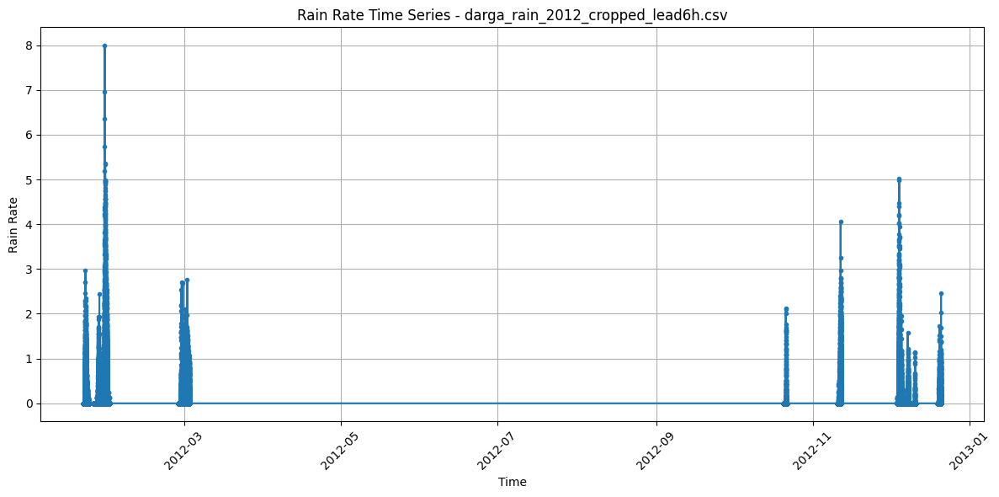

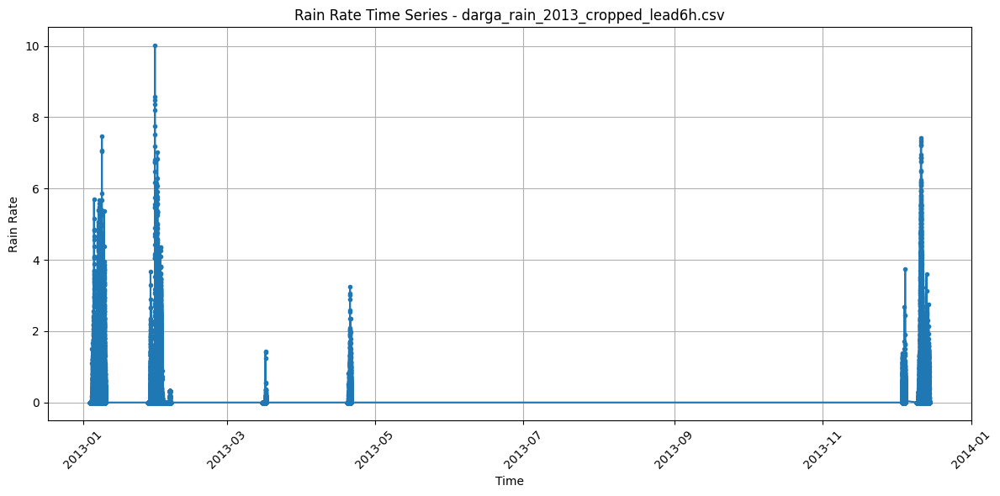

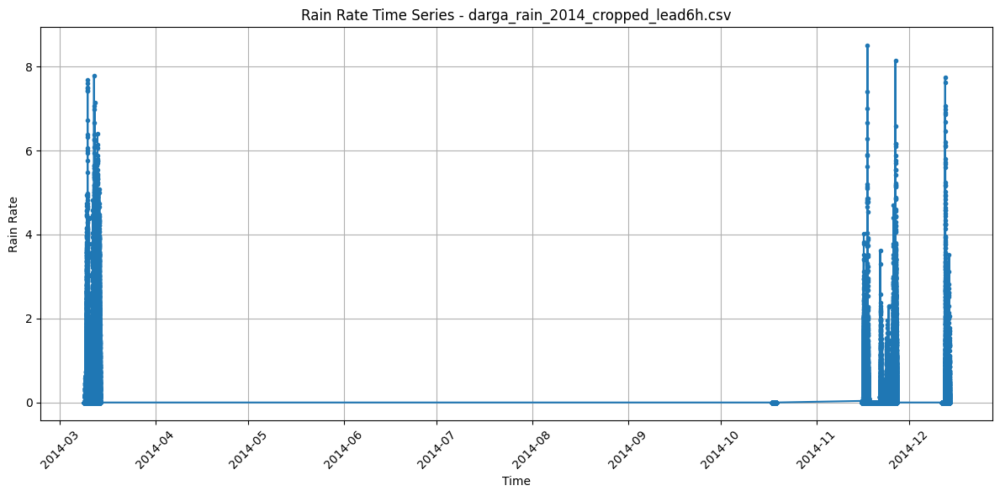

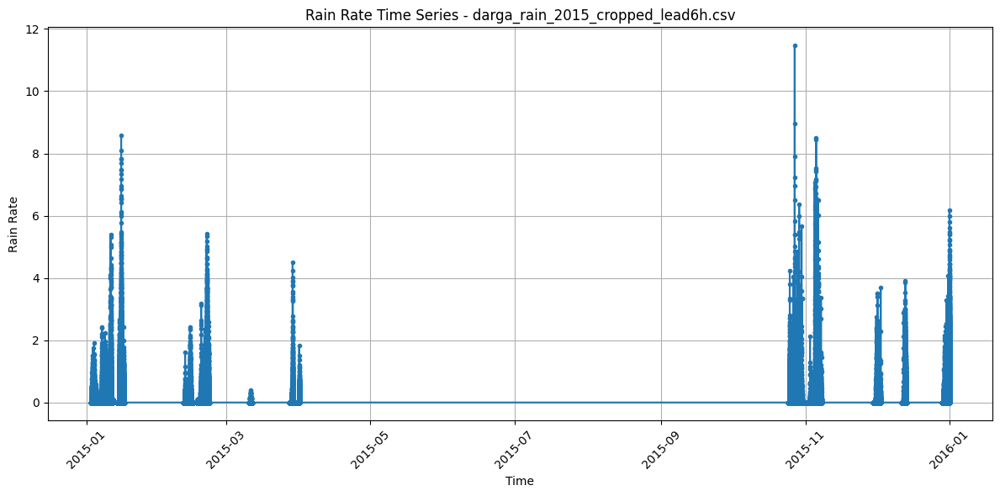

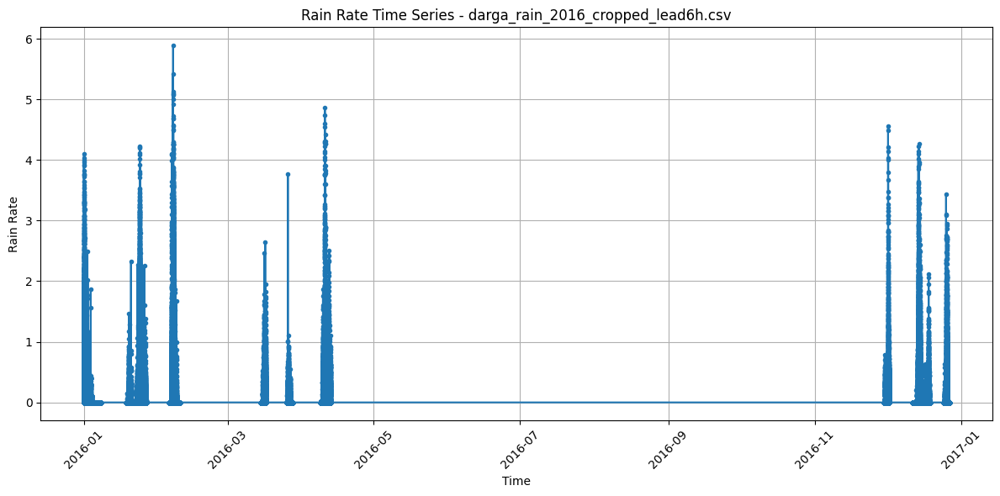

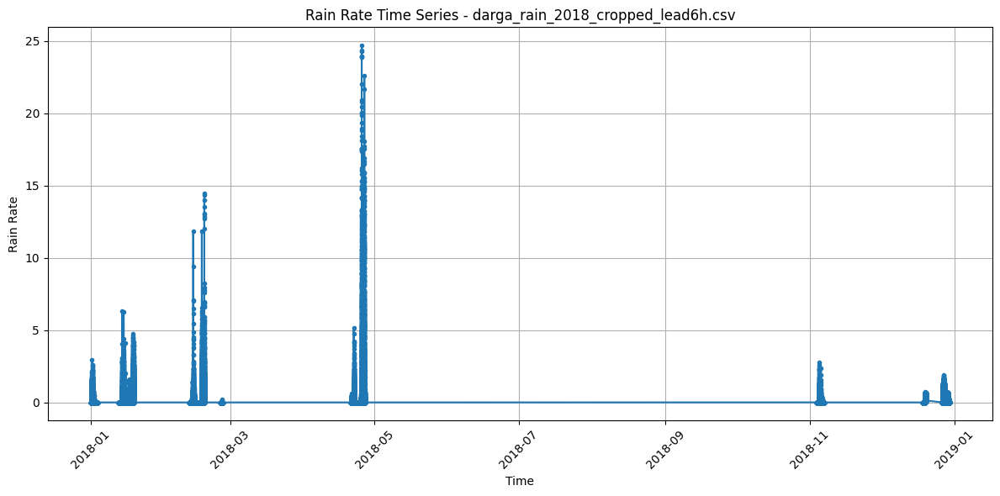

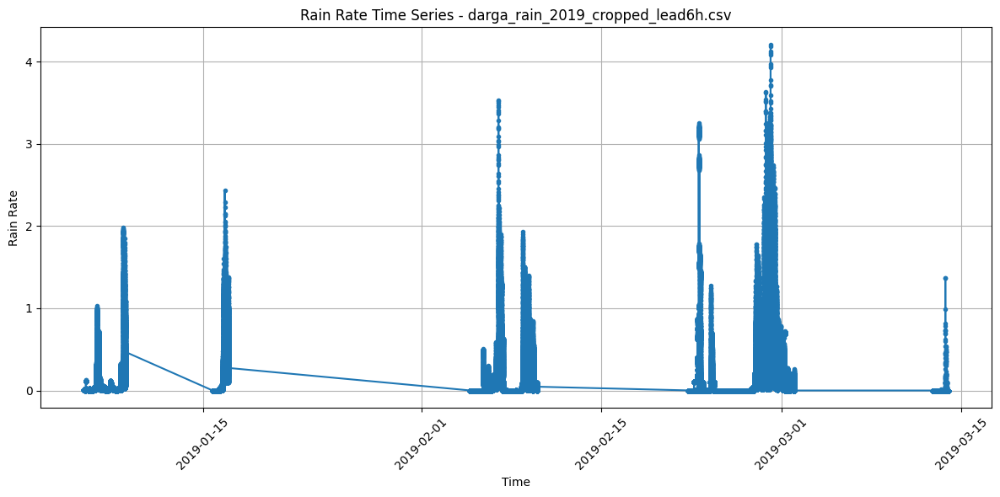

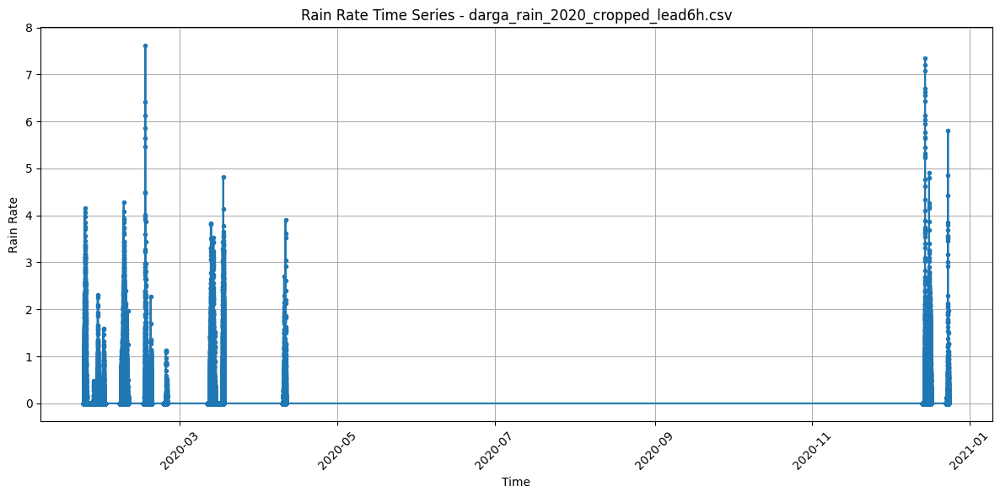

In [45]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the directory where the files are located
directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library"

# List of years to visualize
years = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# Function to load and plot rain rate data for a given file
def plot_rain_data(file):
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df = df[~df['time'].dt.month.isin([5, 6, 7, 8, 9])]  # Exclude months 5, 6, 7, 8, 9
    plt.figure(figsize=(12, 6))
    plt.plot(df['time'], df['rainrate'], marker='o', linestyle='-', markersize=3)
    plt.title(f"Rain Rate Time Series - {os.path.basename(file)}")
    plt.xlabel("Time")
    plt.ylabel("Rain Rate")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Iterate over each year and plot the rain rate data
for year in years:
    filename = f"darga_rain_{year}_cropped_lead6h.csv"
    file_path = os.path.join(directory, filename)
    plot_rain_data(file_path)


In [46]:
import os
import pandas as pd

# Define the directory where the files are located
directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library"

# Function to report start and end times for each file
def report_start_end_times(file):
    df = pd.read_csv(file)
    start_time = pd.to_datetime(df['time'].min())
    end_time = pd.to_datetime(df['time'].max())
    filename = os.path.basename(file)
    print(f"File: {filename}, Start: {start_time}, End: {end_time}")

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        file_path = os.path.join(directory, filename)
        report_start_end_times(file_path)


File: darga_rain_2014_cropped_lead6h.csv, Start: 2014-03-08 18:00:00, End: 2014-12-14 00:00:00
File: darga_rain_2015_cropped_lead6h.csv, Start: 2015-01-02 18:00:00, End: 2015-12-31 23:50:00
File: darga_rain_2019_cropped_lead6h.csv, Start: 2019-01-05 18:00:00, End: 2019-03-14 00:00:00
File: darga_rain_2018_cropped_lead6h.csv, Start: 2018-01-01 00:00:00, End: 2018-12-30 00:00:00
File: darga_rain_2016_cropped_lead6h.csv, Start: 2016-01-01 00:00:00, End: 2016-12-27 00:00:00
File: darga_rain_2013_cropped_lead6h.csv, Start: 2013-01-03 18:00:00, End: 2013-12-15 00:00:00
File: darga_rain_2012_cropped_lead6h.csv, Start: 2012-01-21 18:00:00, End: 2012-12-21 00:00:00
File: darga_rain_2020_cropped_lead6h.csv, Start: 2020-01-23 18:00:00, End: 2020-12-24 00:00:00


In [49]:
import pandas as pd

# File path
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2012_cropped_lead6h.csv"

# Read the file
df = pd.read_csv(file_path)

# Display the head of the DataFrame
print(df.head())

                  time  latitude  longitude  rainrate
0  2012-01-21 18:00:00   31.7457    35.2263       0.0
1  2012-01-21 18:00:00   31.7457    35.2369       0.0
2  2012-01-21 18:00:00   31.7368    35.2157       0.0
3  2012-01-21 18:00:00   31.7367    35.2263       0.0
4  2012-01-21 18:00:00   31.7367    35.2369       0.0


In [50]:
import pandas as pd

# File path
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2012_cropped_lead6h.csv"

# Read the CSV file
df = pd.read_csv(file_path)

# Convert 'time' column to datetime format
df['time'] = pd.to_datetime(df['time'])

# Extract month from 'time' and create a new column 'month'
df['month'] = df['time'].dt.month

# Get unique months present in the data
unique_months = df['month'].unique()

# Display the unique months
print("Months present in the data:")
print(unique_months)


Months present in the data:
[ 1  2  3 10 11 12]


In [51]:
import pandas as pd
import os

# Directory containing the files
directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/"

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        file_path = os.path.join(directory, filename)
        
        # Read the CSV file
        df = pd.read_csv(file_path)
        
        # Convert 'time' column to datetime format
        df['time'] = pd.to_datetime(df['time'])
        
        # Extract month from 'time' and create a new column 'month'
        df['month'] = df['time'].dt.month
        
        # Get unique months present in the data
        unique_months = df['month'].unique()
        
        # Display the filename and unique months
        print(f"File: {filename}")
        print("Months present in the data:")
        print(unique_months)
        print("=" * 50)  # Separator for clarity


File: darga_rain_2014_cropped_lead6h.csv
Months present in the data:
[ 3 10 11 12]
File: darga_rain_2015_cropped_lead6h.csv
Months present in the data:
[ 1  2  3  4 10 11 12]
File: darga_rain_2019_cropped_lead6h.csv
Months present in the data:
[1 2 3]
File: darga_rain_2018_cropped_lead6h.csv
Months present in the data:
[ 1  2  4 11 12]
File: darga_rain_2016_cropped_lead6h.csv
Months present in the data:
[ 1  2  3  4 11 12]
File: darga_rain_2013_cropped_lead6h.csv
Months present in the data:
[ 1  2  3  4 12]
File: darga_rain_2012_cropped_lead6h.csv
Months present in the data:
[ 1  2  3 10 11 12]
File: darga_rain_2020_cropped_lead6h.csv
Months present in the data:
[ 1  2  3  4 12]


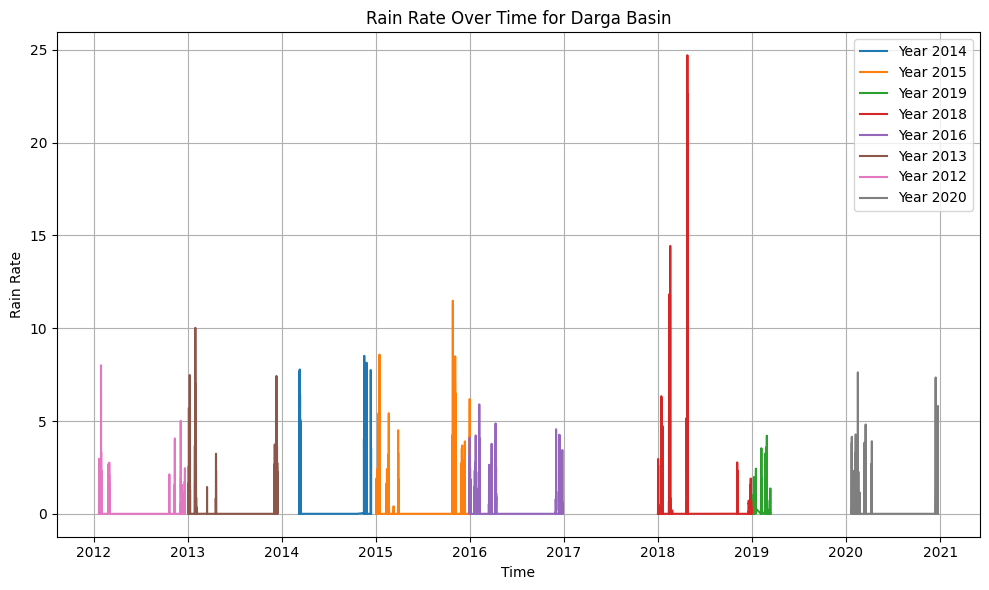

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory containing the files
directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/"

# Initialize a figure
plt.figure(figsize=(10, 6))

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        file_path = os.path.join(directory, filename)
        
        # Read the CSV file
        df = pd.read_csv(file_path)
        
        # Convert 'time' column to datetime format
        df['time'] = pd.to_datetime(df['time'])
        
        # Extract year from 'time'
        df['year'] = df['time'].dt.year
        
        # Plot rain rate over time
        plt.plot(df['time'], df['rainrate'], label=f"Year {df['year'].iloc[0]}")

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Rain Rate')
plt.title('Rain Rate Over Time for Darga Basin')
plt.legend()
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()


In [53]:
import pandas as pd
import json
from datetime import datetime, timedelta
import os

# Function to check lead time
def check_lead_time(events, rain_data):
    for event in events:
        event_start = datetime.strptime(event['st'], '%Y-%m-%d')
        event_end = datetime.strptime(event['ed'], '%Y-%m-%d') + timedelta(days=event['days_n'])
        event_lead_time = event_start - timedelta(hours=6)

        # Filter rain data within the event period
        event_rain_data = rain_data[(rain_data['time'] >= event_lead_time) & (rain_data['time'] <= event_end)]

        if event_rain_data.empty:
            print(f"No rain data found for event {event['st']} - {event['ed']} with 6-hour lead time.")
        else:
            print(f"Rain data found for event {event['st']} - {event['ed']} with 6-hour lead time.")

# Directory and file paths
json_file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/Northern Dead Sea_events_library.json"
csv_directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/"

# Load JSON data
with open(json_file_path, 'r') as f:
    events_data = json.load(f)

# Iterate over each CSV file in the directory
for filename in os.listdir(csv_directory):
    if filename.endswith(".csv"):
        file_path = os.path.join(csv_directory, filename)

        # Read the CSV file
        df = pd.read_csv(file_path)

        # Convert 'time' column to datetime format
        df['time'] = pd.to_datetime(df['time'])

        # Check lead time for events in this CSV file
        print(f"Checking events for file: {filename}")
        check_lead_time(events_data, df)
        print("=" * 50)  # Separator for clarity


Checking events for file: darga_rain_2014_cropped_lead6h.csv
No rain data found for event 2010-12-30 - 2010-12-31 with 6-hour lead time.
No rain data found for event 2011-01-07 - 2011-01-08 with 6-hour lead time.
No rain data found for event 2011-01-14 - 2011-01-15 with 6-hour lead time.
No rain data found for event 2011-01-28 - 2011-02-04 with 6-hour lead time.
No rain data found for event 2011-02-03 - 2011-02-04 with 6-hour lead time.
No rain data found for event 2011-02-07 - 2011-02-08 with 6-hour lead time.
No rain data found for event 2011-02-10 - 2011-02-11 with 6-hour lead time.
No rain data found for event 2011-02-16 - 2011-02-21 with 6-hour lead time.
No rain data found for event 2011-03-22 - 2011-03-25 with 6-hour lead time.
No rain data found for event 2011-04-28 - 2011-04-30 with 6-hour lead time.
No rain data found for event 2011-11-03 - 2011-11-05 with 6-hour lead time.
No rain data found for event 2011-11-14 - 2011-11-21 with 6-hour lead time.
No rain data found for even

In [58]:
import pandas as pd
import os

# Directory where the files are located
directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/"

# List of file names
file_names = [
    "UGRID_Darga_6kcells_latlon.csv",
    "UGRID_Darga_16kcells_latlon.csv",
    "UGRID_Darga_73kcells_latlon.csv"
]

# Function to load and display the head of each file
def load_and_display_head(file_names, directory):
    for file_name in file_names:
        file_path = os.path.join(directory, file_name)
        print(f"File: {file_name}")
        try:
            df = pd.read_csv(file_path)
            print(df.head())  # Displaying the first few rows
            print("=" * 50)  # Separator for clarity
        except FileNotFoundError:
            print(f"File '{file_name}' not found.")
        except Exception as e:
            print(f"Error loading file '{file_name}': {str(e)}")

# Call the function
load_and_display_head(file_names, directory)


File: UGRID_Darga_6kcells_latlon.csv
   ID  AREA_2M   latitude  longitude  STRM_ORDER  STREAM_CELL         DEM  \
0   1   260847  35.266465  31.580134           3            1  509.220426   
1   2  1510689  35.227964  31.600390           3            0  722.415574   
2   3    39704  35.237338  31.588026           3            0  636.302826   
3   4     6199  35.250409  31.588228           4            0  607.918402   
4   5   565912  35.237395  31.591590           3            1  620.572343   

       SLOPE      ASPECT       TPI       TRI  TRIRILEY   TRIRMSD  ROUGHNESS  \
0  15.650532  132.073175  0.000826  0.881682  2.838051  1.003403   2.955264   
1  10.963549  108.124702  0.000169  0.605801  1.941979  0.686593   2.021049   
2   7.839208   97.363758  0.007185  0.428774  1.363745  0.482157   1.377550   
3  21.184869  174.946609  0.012958  1.219254  3.882729  1.372752   3.909200   
4  12.773313  124.620981 -0.002496  0.708091  2.258469  0.798489   2.321930   

     FLOWDIR EQUATION  D5

In [63]:
import pandas as pd

# File paths for rain and discharge data
rain_file_path = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2012_cropped_lead6h.csv'
discharge_file_path = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv'

# Read the head of rain file
rain_data = pd.read_csv(rain_file_path)
print("Head of Rain File:")
print(rain_data.head())

# Read the head of discharge file
discharge_data = pd.read_csv(discharge_file_path)
print("\nHead of Discharge Data:")
print(discharge_data.head())


Head of Rain File:
                  time  latitude  longitude  rainrate
0  2012-01-21 18:00:00   31.7457    35.2263       0.0
1  2012-01-21 18:00:00   31.7457    35.2369       0.0
2  2012-01-21 18:00:00   31.7368    35.2157       0.0
3  2012-01-21 18:00:00   31.7367    35.2263       0.0
4  2012-01-21 18:00:00   31.7367    35.2369       0.0

Head of Discharge Data:
   name                 date  rg_qms       lon       lat
0  דרגה  2012-01-01 00:00:00     0.0  35.36552  31.60015
1  דרגה  2012-01-01 00:10:00     0.0  35.36552  31.60015
2  דרגה  2012-01-01 00:20:00     0.0  35.36552  31.60015
3  דרגה  2012-01-01 00:30:00     0.0  35.36552  31.60015
4  דרגה  2012-01-01 00:40:00     0.0  35.36552  31.60015


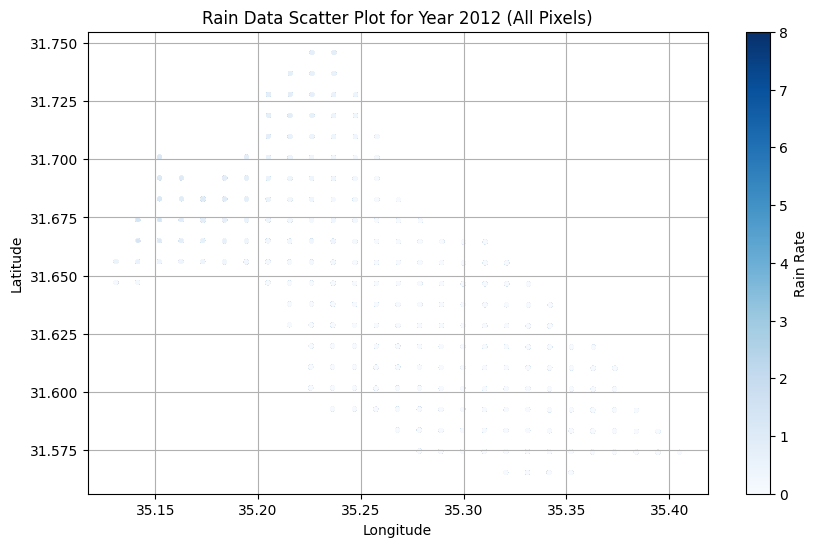

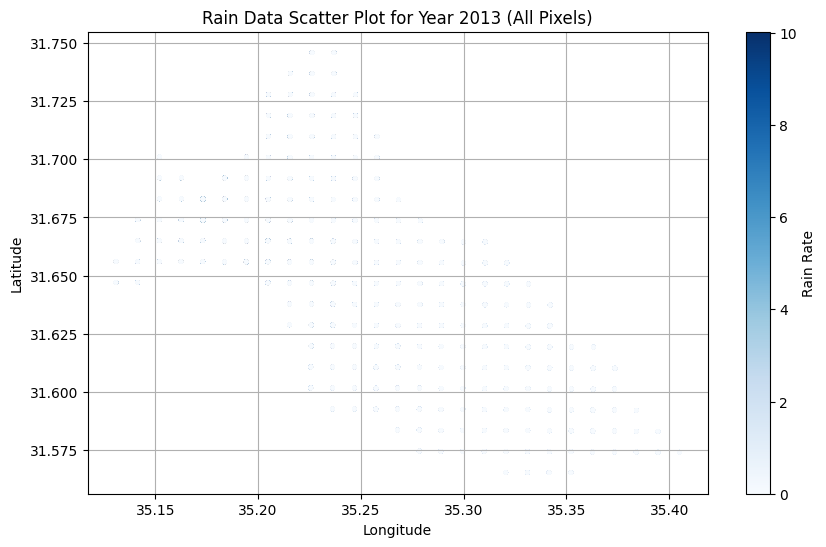

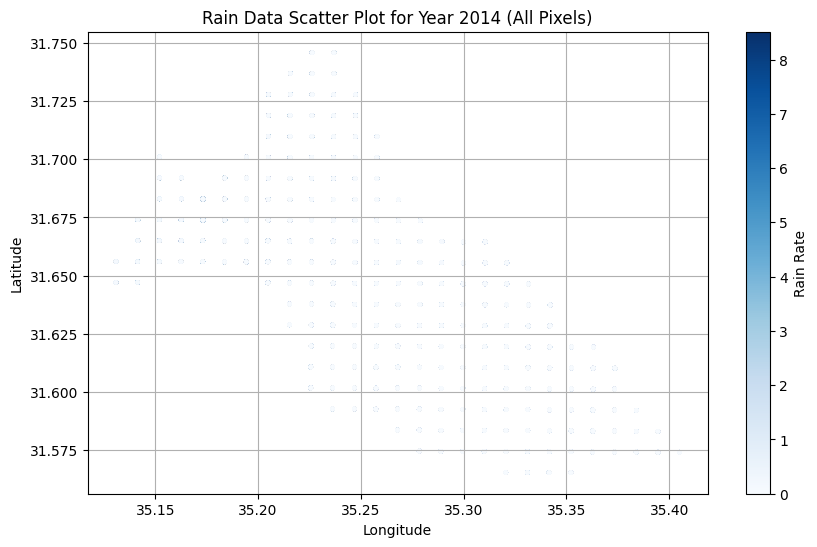

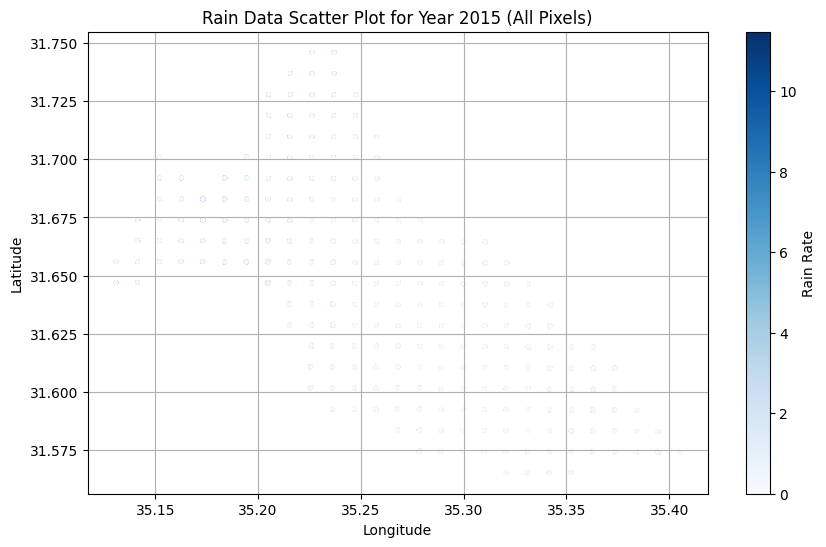

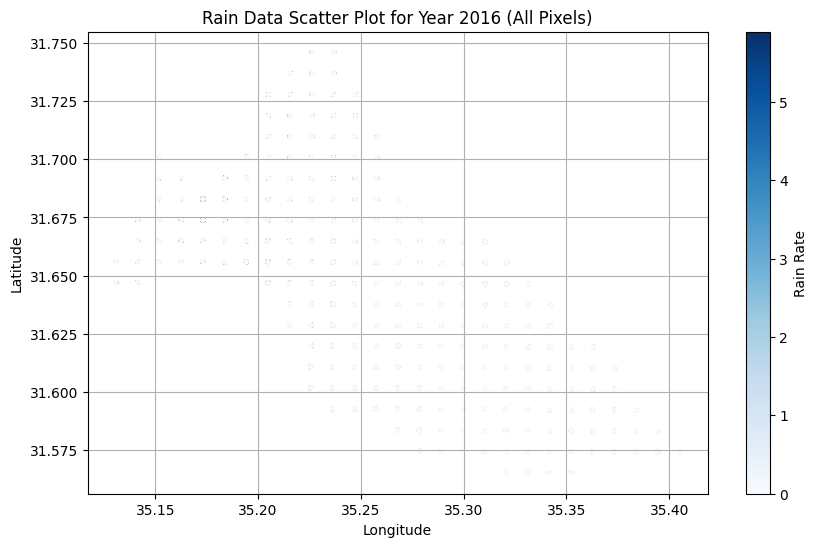

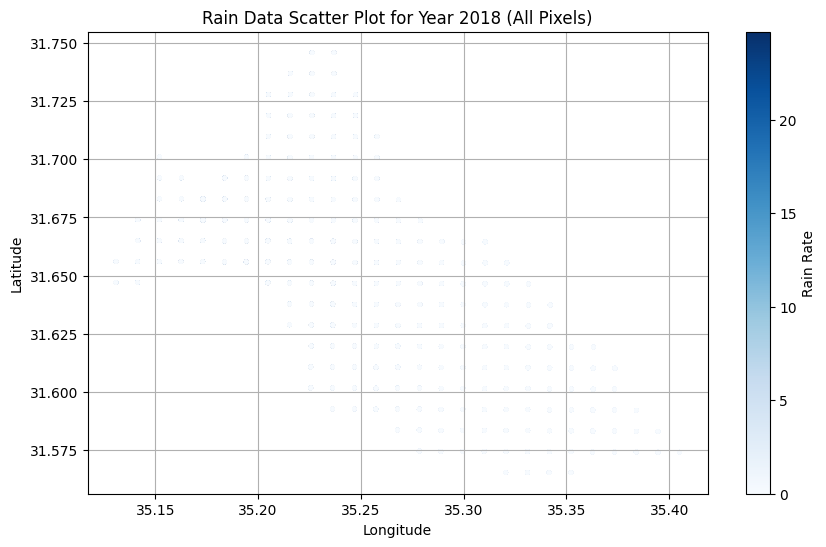

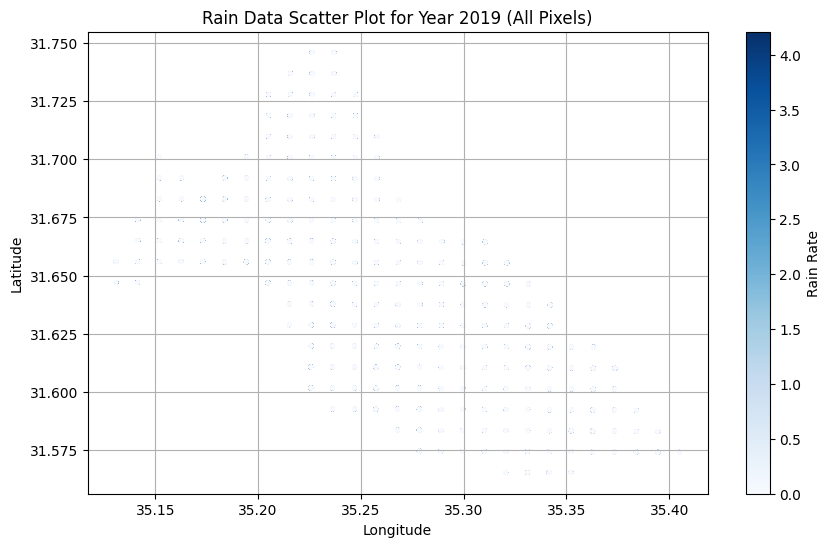

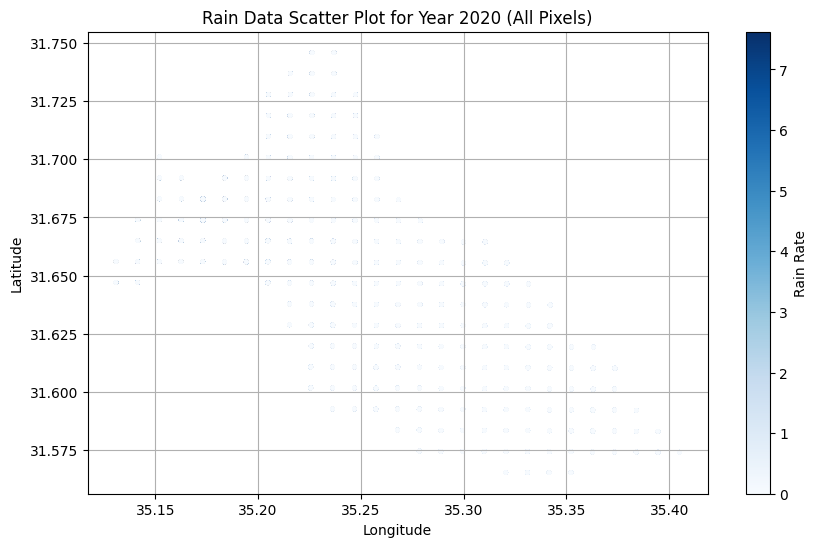

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os

# Define the file path pattern for the rain data files
rain_file_pattern = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_*_cropped_lead6h.csv'

# Get all file paths that match the pattern
rain_files = glob.glob(rain_file_pattern)

# Optional: sort files by year (extracted from the filename)
def get_year(file_path):
    filename = os.path.basename(file_path)
    # Assuming filename format: darga_rain_YEAR_cropped_lead6h.csv
    parts = filename.split("_")
    return int(parts[2])

rain_files = sorted(rain_files, key=get_year)

# Iterate over each rain file and plot the scatter plot for all data points
for file_path in rain_files:
    # Extract the year from the file name
    filename = os.path.basename(file_path)
    parts = filename.split("_")
    year = parts[2]
    
    # Read the rain data for the current year
    rain_data = pd.read_csv(file_path)
    
    # Create scatter plot for all pixels in this year
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(rain_data['longitude'], rain_data['latitude'],
                          c=rain_data['rainrate'], cmap='Blues', s=5)
    plt.colorbar(scatter, label='Rain Rate')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(f'Rain Data Scatter Plot for Year {year} (All Pixels)')
    plt.grid(True)
    plt.show()


In [69]:
import pandas as pd
import glob
import os

# Define the file path pattern for the rain data files
rain_file_pattern = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_*_cropped_lead6h.csv'

# Get all file paths that match the pattern
rain_files = glob.glob(rain_file_pattern)

# Dictionary to store the maximum rain date for each year
max_rain_date = {}

for file_path in rain_files:
    # Extract the year from the file name; assuming filename format: darga_rain_YEAR_cropped_lead6h.csv
    filename = os.path.basename(file_path)
    parts = filename.split("_")
    year = parts[2]
    
    # Read the rain data for the current year
    df = pd.read_csv(file_path)
    
    # Convert the 'time' column to datetime objects
    df['time'] = pd.to_datetime(df['time'])
    
    # Find the row with the maximum rainrate
    idx_max = df['rainrate'].idxmax()
    max_row = df.loc[idx_max]
    
    # Extract the date portion from the timestamp
    max_date = max_row['time'].date()
    
    max_rain_date[year] = max_date

# Print the date with the maximum rain for each year
for year, date in sorted(max_rain_date.items()):
    print(f"Year {year}: Maximum rain occurred on {date}")


Year 2012: Maximum rain occurred on 2012-01-30
Year 2013: Maximum rain occurred on 2013-01-30
Year 2014: Maximum rain occurred on 2014-11-17
Year 2015: Maximum rain occurred on 2015-10-27
Year 2016: Maximum rain occurred on 2016-02-07
Year 2018: Maximum rain occurred on 2018-04-25
Year 2019: Maximum rain occurred on 2019-02-28
Year 2020: Maximum rain occurred on 2020-02-16


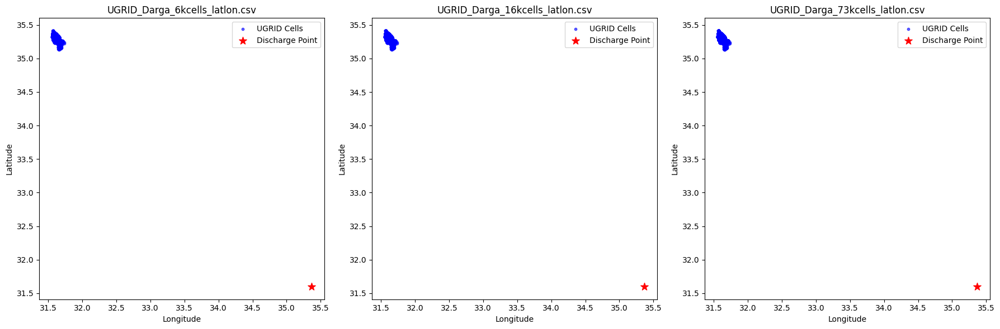

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the UGRID directory and file names
ugrid_directory = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/'
ugrid_files = [
    'UGRID_Darga_6kcells_latlon.csv',
    'UGRID_Darga_16kcells_latlon.csv',
    'UGRID_Darga_73kcells_latlon.csv'
]

# Define discharge file path (for 2012)
discharge_file_path = os.path.join(ugrid_directory, 'darga discharge', 'darga_discharge_2012.csv')

# Load discharge data (assuming all rows have the same coordinates)
discharge_data = pd.read_csv(discharge_file_path)
# We'll use the coordinates from the first row
discharge_lon = discharge_data['lon'].iloc[0]
discharge_lat = discharge_data['lat'].iloc[0]

# Create a figure with 3 subplots (one for each UGRID file)
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=False, sharey=False)

for ax, filename in zip(axes, ugrid_files):
    file_path = os.path.join(ugrid_directory, filename)
    
    # Load the UGRID data
    ugrid_df = pd.read_csv(file_path)
    
    # Plot the UGRID data points (longitude vs latitude)
    ax.scatter(ugrid_df['longitude'], ugrid_df['latitude'],
               s=10, c='blue', alpha=0.6, label='UGRID Cells')
    
    # Overlay the discharge coordinate as a red star marker
    ax.scatter(discharge_lon, discharge_lat, s=100, c='red', marker='*', label='Discharge Point')
    
    # Set title and axis labels
    ax.set_title(filename)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.legend()

plt.tight_layout()
plt.show()


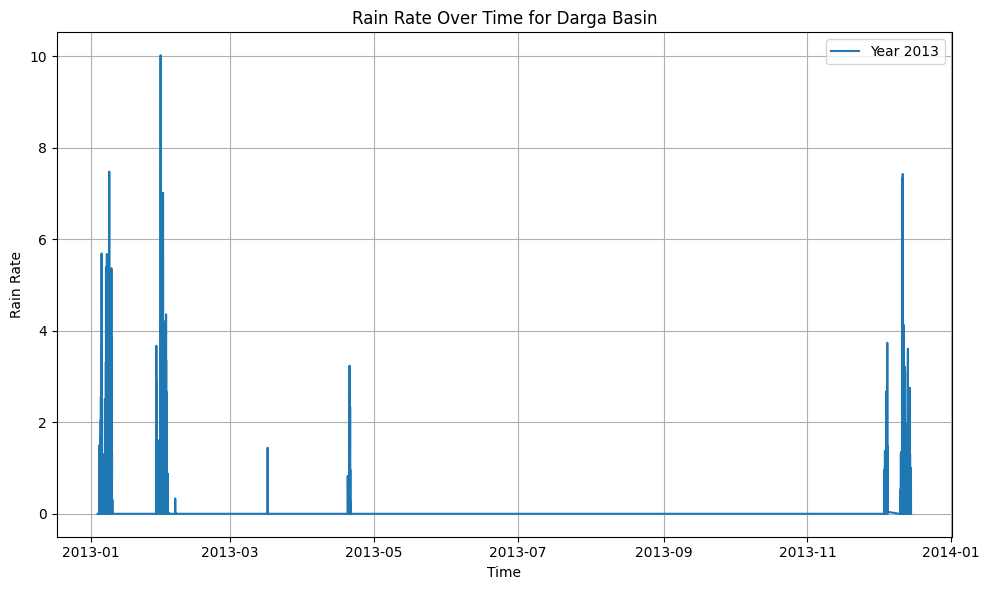

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory containing the files
directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library"

# Initialize a figure
plt.figure(figsize=(10, 6))

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.endswith("_2013_cropped_lead6h.csv"):
        file_path = os.path.join(directory, filename)
        
        # Read the CSV file
        df = pd.read_csv(file_path)
        
        # Convert 'time' column to datetime format
        df['time'] = pd.to_datetime(df['time'])
        
        # Extract year from 'time'
        df['year'] = df['time'].dt.year
        
        # Plot rain rate over time
        plt.plot(df['time'], df['rainrate'], label=f"Year {df['year'].iloc[0]}")

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Rain Rate')
plt.title('Rain Rate Over Time for Darga Basin')
plt.legend()
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()



#10/12/2013 15/12/2013

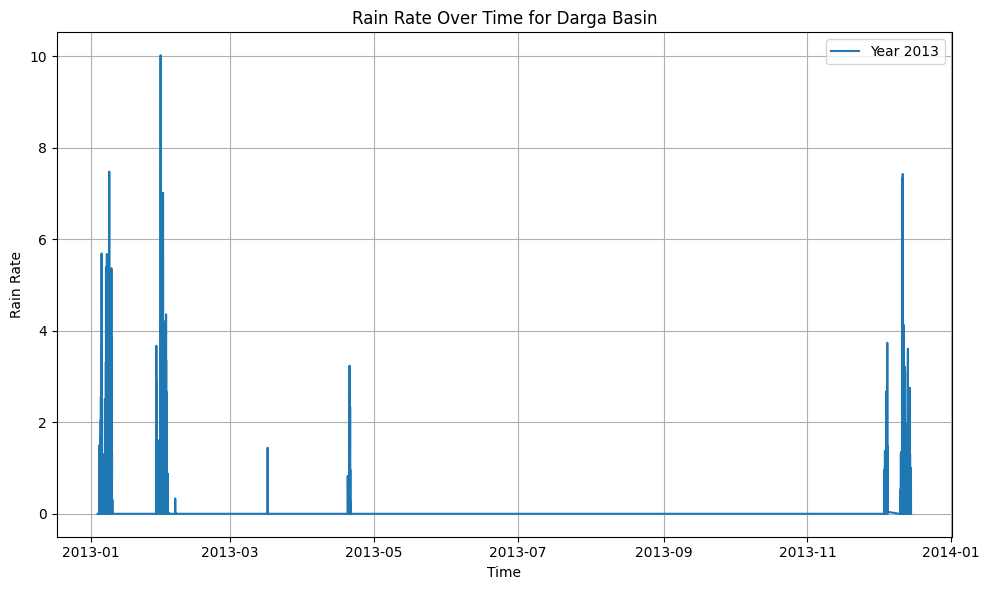

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Directory containing the files
directory = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library"

# Initialize a figure
plt.figure(figsize=(10, 6))

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.endswith("_2013_cropped_lead6h.csv"):
        file_path = os.path.join(directory, filename)
        
        # Read the CSV file
        df = pd.read_csv(file_path)
        
        # Convert 'time' column to datetime format
        df['time'] = pd.to_datetime(df['time'])
        
        # Extract year from 'time'
        df['year'] = df['time'].dt.year
        
        # Plot rain rate over time
        plt.plot(df['time'], df['rainrate'], label=f"Year {df['year'].iloc[0]}")

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Rain Rate')
plt.title('Rain Rate Over Time for Darga Basin')
plt.legend()
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()


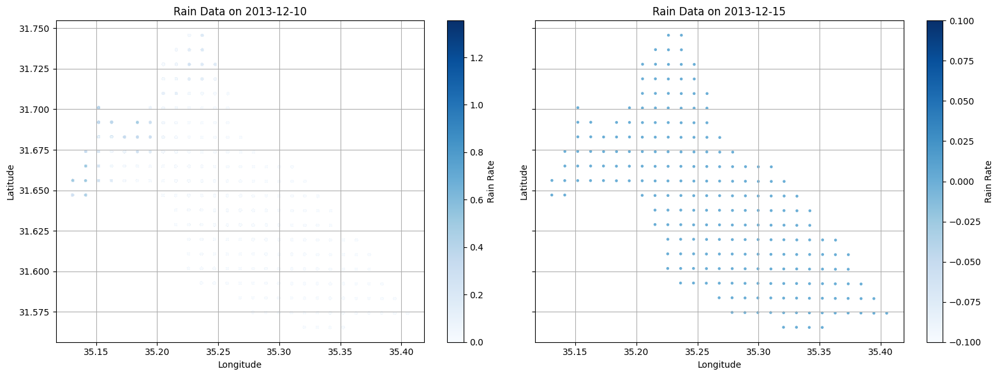

In [76]:
import pandas as pd
import matplotlib.pyplot as plt

# File path for the 2013 rain data file
rain_file_path = '/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/rain darga based event library/darga_rain_2013_cropped_lead6h.csv'

# Load the data and convert 'time' column to datetime
df = pd.read_csv(rain_file_path)
df['time'] = pd.to_datetime(df['time'])

# Define the target dates (as date objects)
date1 = pd.to_datetime("2013-12-10").date()
date2 = pd.to_datetime("2013-12-15").date()

# Filter data for each date
df_date1 = df[df['time'].dt.date == date1]
df_date2 = df[df['time'].dt.date == date2]

# Create a figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True, sharey=True)

# Plot for 10/12/2013
sc1 = axes[0].scatter(df_date1['longitude'], df_date1['latitude'],
                      c=df_date1['rainrate'], cmap='Blues', s=5)
axes[0].set_title(f"Rain Data on {date1}")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].grid(True)
cbar1 = plt.colorbar(sc1, ax=axes[0])
cbar1.set_label("Rain Rate")

# Plot for 15/12/2013
sc2 = axes[1].scatter(df_date2['longitude'], df_date2['latitude'],
                      c=df_date2['rainrate'], cmap='Blues', s=5)
axes[1].set_title(f"Rain Data on {date2}")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].grid(True)
cbar2 = plt.colorbar(sc2, ax=axes[1])
cbar2.set_label("Rain Rate")

plt.tight_layout()
plt.show()


In [ ]:
----------------------------------------------------------------

2025-03-24 17:30:25,293 [INFO] Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-03-24 17:30:25,294 [INFO] MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1000x600 -pix_fmt rgba -framerate 1.25 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpg5gb1owv/temp.m4v


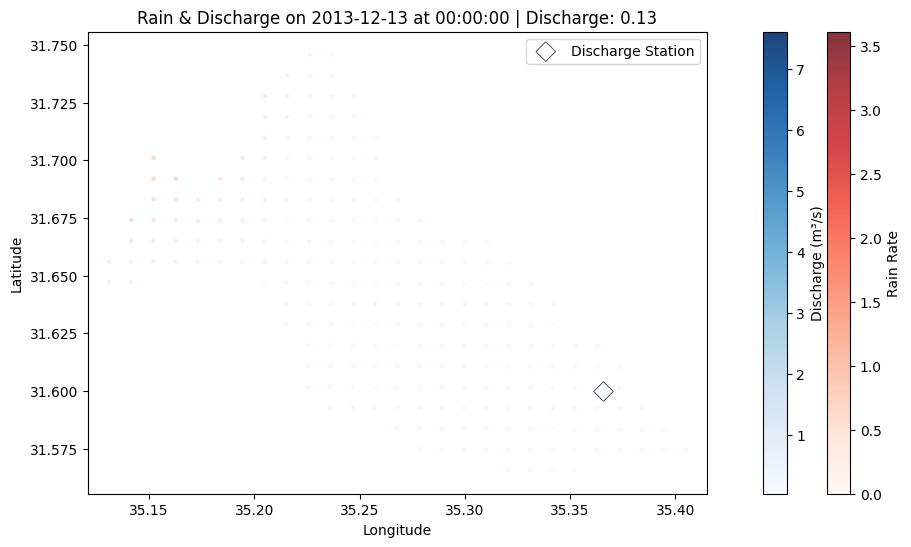

In [96]:
# Uncomment the following line if using the inline backend:
%matplotlib inline

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

# ------------------------------------------------------------------------------
# 1. LOAD & PREP RAIN DATA
# ------------------------------------------------------------------------------
rain_file_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv"
)
df_rain = pd.read_csv(rain_file_path)
df_rain["time"] = pd.to_datetime(df_rain["time"])

# Choose target date for the animation
target_date = pd.to_datetime("2013-12-13").date()
df_rain_day = df_rain[df_rain["time"].dt.date == target_date]

# Extract sorted unique timestamps for the day
unique_times = sorted(df_rain_day["time"].unique())

# Determine global min/max for rain rate (for consistent color scaling)
rain_min = df_rain_day["rainrate"].min()
rain_max = df_rain_day["rainrate"].max()

# ------------------------------------------------------------------------------
# 2. LOAD & PREP DISCHARGE DATA
# ------------------------------------------------------------------------------
discharge_file_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2013.csv"
)
df_discharge = pd.read_csv(discharge_file_path)
df_discharge["date"] = pd.to_datetime(df_discharge["date"])

# Filter discharge data for the same target date
df_discharge_day = df_discharge[df_discharge["date"].dt.date == target_date]

# Get station location (assumed constant)
if not df_discharge_day.empty:
    station_lon = df_discharge_day["lon"].iloc[0]
    station_lat = df_discharge_day["lat"].iloc[0]
else:
    station_lon = df_discharge["lon"].iloc[0]
    station_lat = df_discharge["lat"].iloc[0]

# Determine global min/max for discharge for color scaling
discharge_min = df_discharge_day["rg_qms"].min() if not df_discharge_day.empty else 0.0
discharge_max = df_discharge_day["rg_qms"].max() if not df_discharge_day.empty else 1.0

# ------------------------------------------------------------------------------
# 3. SET UP FIGURE & SCATTERS
# ------------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6))

# --- Rain Scatter: using a red-based colormap ("Reds") ---
sc_rain = ax.scatter(
    [], [], c=[], cmap="Reds", s=5,
    vmin=rain_min, vmax=rain_max, alpha=0.8
)
cbar_rain = plt.colorbar(sc_rain, ax=ax, fraction=0.046, pad=0.04)
cbar_rain.set_label("Rain Rate")

# --- Discharge Scatter: using a blue-based colormap ("Blues") ---
sc_discharge = ax.scatter(
    [], [], c=[], cmap="Blues", s=100, marker="D",
    vmin=discharge_min, vmax=discharge_max, alpha=0.9,
    edgecolor="black", linewidth=0.5, label="Discharge Station"
)
cbar_discharge = plt.colorbar(sc_discharge, ax=ax, fraction=0.046, pad=0.08)
cbar_discharge.set_label("Discharge (m³/s)")

ax.set_xlim(df_rain_day["longitude"].min() - 0.01, df_rain_day["longitude"].max() + 0.01)
ax.set_ylim(df_rain_day["latitude"].min() - 0.01, df_rain_day["latitude"].max() + 0.01)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title(f"Rain & Discharge on {target_date}")
ax.legend()

# ------------------------------------------------------------------------------
# 4. ANIMATION UPDATE FUNCTION
# ------------------------------------------------------------------------------
def update(frame):
    current_time = unique_times[frame]

    # --- Update Rain Scatter ---
    current_rain = df_rain_day[df_rain_day["time"] == current_time]
    offsets_rain = np.column_stack((current_rain["longitude"], current_rain["latitude"]))
    sc_rain.set_offsets(offsets_rain)
    sc_rain.set_array(current_rain["rainrate"].values)

    # --- Update Discharge Scatter ---
    # Attempt to match discharge record with the current time
    current_discharge = df_discharge_day[df_discharge_day["date"] == current_time]
    if not current_discharge.empty:
        discharge_value = current_discharge["rg_qms"].iloc[0]
    else:
        discharge_value = 0.0

    sc_discharge.set_offsets([[station_lon, station_lat]])
    sc_discharge.set_array([discharge_value])

    ax.set_title(
        f"Rain & Discharge on {target_date} at {current_time.time()} | "
        f"Discharge: {discharge_value:.2f}"
    )
    return sc_rain, sc_discharge

# ------------------------------------------------------------------------------
# 5. CREATE AND DISPLAY ANIMATION
# ------------------------------------------------------------------------------
ani = animation.FuncAnimation(
    fig, update, frames=len(unique_times), interval=800, blit=False, repeat=True
)
HTML(ani.to_html5_video())


In [91]:
import pandas as pd
import glob
import os

# Define the file pattern for the discharge files
discharge_pattern = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/"
    "darga_discharge_*.csv"
)

# Get a list of all matching discharge files
discharge_files = glob.glob(discharge_pattern)

# Dictionary to store the max discharge date for each year
max_discharge_dates = {}

for file in discharge_files:
    # Extract the year from the filename.
    # Expected format: darga_discharge_YEAR.csv
    filename = os.path.basename(file)
    parts = filename.split("_")
    # "2012.csv" is in the last part; remove the ".csv" extension
    year = parts[-1].replace(".csv", "")
    
    # Load the discharge data
    df = pd.read_csv(file)
    
    # Convert the 'date' column to datetime objects
    df['date'] = pd.to_datetime(df['date'])
    
    # Find the index of the maximum discharge value (assuming 'rg_qms' is discharge)
    idx_max = df['rg_qms'].idxmax()
    # Get the corresponding date (only the date part)
    max_date = df.loc[idx_max, 'date'].date()
    
    max_discharge_dates[year] = max_date

# Print out the results
for year, date in sorted(max_discharge_dates.items()):
    print(f"Year {year}: Maximum discharge occurred on {date}")


Year 2012: Maximum discharge occurred on 2012-02-18
Year 2013: Maximum discharge occurred on 2013-01-10
Year 2014: Maximum discharge occurred on 2014-03-09
Year 2015: Maximum discharge occurred on 2015-04-16
Year 2016: Maximum discharge occurred on 2016-01-26
Year 2018: Maximum discharge occurred on 2018-02-17
Year 2019: Maximum discharge occurred on 2019-01-16
Year 2020: Maximum discharge occurred on 2020-03-06


In [95]:
import pandas as pd

# File path for the 2013 discharge data
discharge_file_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2013.csv"
)

# Load the discharge data and convert 'date' column to datetime
df = pd.read_csv(discharge_file_path)
df['date'] = pd.to_datetime(df['date'])

# Sort the data by 'rg_qms' in descending order and select the top 4 rows
top4 = df.sort_values('rg_qms', ascending=False).head(4)

# Display the top 4 rows with the date and discharge value
print("Top 4 maximum discharge dates in 2013:")
print(top4[['date', 'rg_qms']])


Top 4 maximum discharge dates in 2013:
                     date  rg_qms
1345  2013-01-10 08:10:00  8.9647
1346  2013-01-10 08:20:00  8.3553
1344  2013-01-10 08:00:00  8.2720
36708 2013-12-13 22:00:00  7.6125


In [99]:
import pandas as pd

# File path for the 2013 rain data
rain_file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv"

# Load the data and convert the 'time' column to datetime
df = pd.read_csv(rain_file_path)
df['time'] = pd.to_datetime(df['time'])

# Get sorted unique timestamps from the file by converting to a Series
timestamps = pd.Series(pd.to_datetime(df['time'].unique())).sort_values()

# Define the expected complete date range for 2013 at 10-minute intervals.
# 2013 is a non-leap year: from 2013-01-01 00:00:00 to 2014-01-01 00:00:00, excluding the end.
start_time = pd.Timestamp("2013-01-01 00:00:00")
end_time = pd.Timestamp("2014-01-01 00:00:00")
expected_range = pd.date_range(start=start_time, end=end_time, freq='10T', inclusive='left')

# Compare the file timestamps with the expected range
complete = (len(timestamps) == len(expected_range)) and all(timestamps == expected_range)
missing = set(expected_range) - set(timestamps)
extra = set(timestamps) - set(expected_range)

print("Number of timestamps in file:", len(timestamps))
print("Expected number of timestamps:", len(expected_range))

if complete:
    print("The data covers the entire year 2013 with 10-minute intervals.")
else:
    print("The data is incomplete or has extra timestamps.")
    if missing:
        print("\nMissing timestamps:")
        for ts in sorted(missing):
            print(ts)
    if extra:
        print("\nExtra timestamps:")
        for ts in sorted(extra):
            print(ts)



Number of timestamps in file: 39312
Expected number of timestamps: 52560
The data is incomplete or has extra timestamps.

Missing timestamps:
2013-06-01 00:00:00
2013-06-01 00:10:00
2013-06-01 00:20:00
2013-06-01 00:30:00
2013-06-01 00:40:00
2013-06-01 00:50:00
2013-06-01 01:00:00
2013-06-01 01:10:00
2013-06-01 01:20:00
2013-06-01 01:30:00
2013-06-01 01:40:00
2013-06-01 01:50:00
2013-06-01 02:00:00
2013-06-01 02:10:00
2013-06-01 02:20:00
2013-06-01 02:30:00
2013-06-01 02:40:00
2013-06-01 02:50:00
2013-06-01 03:00:00
2013-06-01 03:10:00
2013-06-01 03:20:00
2013-06-01 03:30:00
2013-06-01 03:40:00
2013-06-01 03:50:00
2013-06-01 04:00:00
2013-06-01 04:10:00
2013-06-01 04:20:00
2013-06-01 04:30:00
2013-06-01 04:40:00
2013-06-01 04:50:00
2013-06-01 05:00:00
2013-06-01 05:10:00
2013-06-01 05:20:00
2013-06-01 05:30:00
2013-06-01 05:40:00
2013-06-01 05:50:00
2013-06-01 06:00:00
2013-06-01 06:10:00
2013-06-01 06:20:00
2013-06-01 06:30:00
2013-06-01 06:40:00
2013-06-01 06:50:00
2013-06-01 07:00:0

/tmp/ipykernel_4897/3924128653.py:17: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  expected_range = pd.date_range(start=start_time, end=end_time, freq='10T', inclusive='left')


In [100]:
import pandas as pd

# File path for the 2013 rain data
rain_file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv"

# Load the data and convert the 'time' column to datetime
df = pd.read_csv(rain_file_path)
df['time'] = pd.to_datetime(df['time'])

# Create a 'month' column from the time data
df['month'] = df['time'].dt.month

# Group by month and count the number of unique timestamps
monthly_counts = df.groupby('month')['time'].nunique()
print("Number of unique timestamps per month in 2013 (from data):")
print(monthly_counts)

# Now, let's compute the expected number of timestamps per month.
# We assume 10-minute intervals for the full month.
expected_counts = {}
for month in range(1, 13):
    start = pd.Timestamp(f"2013-{month:02d}-01 00:00:00")
    if month == 12:
        end = pd.Timestamp("2014-01-01 00:00:00")
    else:
        end = pd.Timestamp(f"2013-{month+1:02d}-01 00:00:00")
    expected_range = pd.date_range(start=start, end=end, freq='10T', inclusive='left')
    expected_counts[month] = len(expected_range)

print("\nExpected number of timestamps per month in 2013:")
for month in sorted(expected_counts):
    print(f"Month {month:02d}: {expected_counts[month]}")


Number of unique timestamps per month in 2013 (from data):
month
1     4464
2     4032
3     4464
4     4320
5     4464
9     4320
10    4464
11    4320
12    4464
Name: time, dtype: int64

Expected number of timestamps per month in 2013:
Month 01: 4464
Month 02: 4032
Month 03: 4464
Month 04: 4320
Month 05: 4464
Month 06: 4320
Month 07: 4464
Month 08: 4464
Month 09: 4320
Month 10: 4464
Month 11: 4320
Month 12: 4464


/tmp/ipykernel_4897/2749394322.py:27: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  expected_range = pd.date_range(start=start, end=end, freq='10T', inclusive='left')


In [102]:
import pandas as pd
import glob
import os

# Define the file pattern for the rain files (for years 2012, 2013, 2014, 2015, 2016, 2018, 2019, and 2020)
rain_file_pattern = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_*.csv"
)

# Get list of matching files
rain_files = glob.glob(rain_file_pattern)

print("Found rain files:")
for file in rain_files:
    print(file)

# Define the months to remove: May (5) and September (9)
months_to_remove = {5, 9}

# Process each file: filter out rows where 'time' is in the unwanted months and overwrite the file
for file in rain_files:
    print(f"\nProcessing file: {file}")
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    initial_count = len(df)
    
    # Filter out rows where the month is either May or September
    df_filtered = df[~df['time'].dt.month.isin(months_to_remove)]
    final_count = len(df_filtered)
    
    # Overwrite the original file with the filtered data
    df_filtered.to_csv(file, index=False)
    print(f"Rows before: {initial_count}, rows after filtering: {final_count}")

# Test the operation: verify that none of the updated files contains records from May or September.
print("\nTesting updated files:")
for file in rain_files:
    df_test = pd.read_csv(file)
    df_test['time'] = pd.to_datetime(df_test['time'])
    # Check if any rows belong to months 5 or 9
    bad_rows = df_test[df_test['time'].dt.month.isin(months_to_remove)]
    if bad_rows.empty:
        print(f"{os.path.basename(file)}: PASS - No records from months {months_to_remove}.")
    else:
        print(f"{os.path.basename(file)}: FAIL - Found {len(bad_rows)} records from months {months_to_remove}.")


Found rain files:
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2016.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2018.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2020.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2019.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2014.cs

In [104]:
import pandas as pd
import glob
import os
from datetime import timedelta

# Define the file pattern for the rain files for years 2012, 2013, 2014, 2015, 2016, 2018, 2019, and 2020.
rain_file_pattern = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_*.csv"
)

# Get list of all matching files
rain_files = glob.glob(rain_file_pattern)
print("Processing dry periods in the following files:")
for file in rain_files:
    print(file)

print("\nDry period counts (>=8 consecutive dry days) per year:")

# Process each file
for file in rain_files:
    # Extract year from filename.
    # Expected filename format: darga_rain_YYYY*.csv
    base = os.path.basename(file)
    # e.g., "darga_rain_2013_cropped_lead6h.csv" => year is at index 2 if splitting by '_'
    parts = base.split('_')
    year_str = parts[2]
    # Ensure we get the first 4 characters as year (e.g., "2013")
    year = int(year_str[:4])
    
    # Load the rain data and convert 'time' column to datetime
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    
    # Create a new column with just the date (dropping time)
    df['date'] = df['time'].dt.date
    
    # Compute the daily total rain (summing all 10-minute rainrate values for the day)
    daily_rain = df.groupby('date')['rainrate'].sum()
    
    # Mark a day as dry if the total rain is exactly 0.
    # (Depending on your data, you might consider a small threshold instead of 0.)
    dry_days = [d for d, total in daily_rain.items() if total == 0]
    dry_days = sorted(dry_days)  # List of date objects
    
    # Count contiguous sequences (blocks) of dry days that are at least 8 days long.
    dry_periods = 0
    current_block = []
    for d in dry_days:
        if not current_block:
            current_block = [d]
        else:
            # Check if this day is exactly 1 day after the previous day
            if d == current_block[-1] + timedelta(days=1):
                current_block.append(d)
            else:
                # End of current contiguous block; check its length
                if len(current_block) >= 8:
                    dry_periods += 1
                current_block = [d]
    # After loop, check the final block
    if current_block and len(current_block) >= 8:
        dry_periods += 1

    print(f"Year {year}: {dry_periods} dry period(s) (>=8 consecutive dry days)")


Processing dry periods in the following files:
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2016.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2018.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2020.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2019.csv
/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/

In [105]:
import pandas as pd
import glob
import os
from datetime import timedelta

# Define the file pattern for the rain files.
rain_file_pattern = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_*.csv"
)

# Get list of matching files.
rain_files = glob.glob(rain_file_pattern)

# Dictionary to store the dry period counts per year.
dry_period_counts = {}

for file in rain_files:
    # Extract the year from the filename.
    # Expected filename format: darga_rain_YYYY_cropped_lead6h.csv
    base = os.path.basename(file)
    parts = base.split('_')
    year_str = parts[2]  # e.g., "2013"
    year = int(year_str[:4])
    
    # Load the rain data and convert the 'time' column.
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    # Create a new column with just the date (without time)
    df['date'] = df['time'].dt.date
    
    # Compute daily total rain.
    daily_rain = df.groupby('date')['rainrate'].sum()
    
    # Identify dry days: days with 0 total rain.
    dry_days = sorted([d for d, total in daily_rain.items() if total == 0])
    
    # Count non-overlapping dry periods: each period is 8 consecutive dry days.
    # For each contiguous block, the number of dry periods is floor(block_length / 8).
    dry_periods = 0
    current_block = []
    for d in dry_days:
        if not current_block:
            current_block = [d]
        else:
            if d == current_block[-1] + timedelta(days=1):
                current_block.append(d)
            else:
                dry_periods += len(current_block) // 8
                current_block = [d]
    if current_block:
        dry_periods += len(current_block) // 8
    
    dry_period_counts[year] = dry_periods

# Print the results.
print("Non-overlapping dry periods (>=8 consecutive dry days) per year:")
for year in sorted(dry_period_counts):
    print(f"Year {year}: {dry_period_counts[year]} dry period(s)")


Non-overlapping dry periods (>=8 consecutive dry days) per year:
Year 2012: 1 dry period(s)
Year 2013: 3 dry period(s)
Year 2014: 5 dry period(s)
Year 2015: 2 dry period(s)
Year 2016: 2 dry period(s)
Year 2018: 6 dry period(s)
Year 2019: 2 dry period(s)
Year 2020: 3 dry period(s)


In [106]:
import pandas as pd
import glob
import os
from datetime import timedelta

# Define the file pattern for the rain files (for the specified years)
rain_file_pattern = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_*.csv"
)

# Get list of matching files
rain_files = glob.glob(rain_file_pattern)

# Dictionary to store dry period details per year:
# For each year, a list of tuples (start_date, end_date) for each non-overlapping dry period
dry_period_details = {}

for file in rain_files:
    # Extract year from the filename. Expected filename: darga_rain_YYYY_cropped_lead6h.csv
    base = os.path.basename(file)
    parts = base.split('_')
    year_str = parts[2]  # e.g., "2013"
    year = int(year_str[:4])
    
    # Load the rain data and convert 'time' column to datetime; extract date only.
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df['date'] = df['time'].dt.date
    
    # Compute daily total rain (summing all 10-minute values for each day)
    daily_rain = df.groupby('date')['rainrate'].sum()
    
    # Identify dry days (days with total rain == 0)
    dry_days = sorted([d for d, total in daily_rain.items() if total == 0])
    
    # For each contiguous block of dry days, subdivide into non-overlapping segments of 8 days.
    segments = []  # List of tuples: (start_date, end_date) for each dry period segment.
    current_block = []
    
    for d in dry_days:
        if not current_block:
            current_block = [d]
        else:
            if d == current_block[-1] + timedelta(days=1):
                current_block.append(d)
            else:
                # Process the current contiguous block.
                num_segments = len(current_block) // 8
                for i in range(num_segments):
                    seg_start = current_block[i*8]
                    seg_end = current_block[i*8 + 7]
                    segments.append((seg_start, seg_end))
                current_block = [d]
    # Process any remaining block after loop.
    if current_block:
        num_segments = len(current_block) // 8
        for i in range(num_segments):
            seg_start = current_block[i*8]
            seg_end = current_block[i*8 + 7]
            segments.append((seg_start, seg_end))
    
    dry_period_details[year] = segments

# Print the results sorted by year.
print("Non-overlapping dry periods (>=8 consecutive dry days) per year with intervals:")
for year in sorted(dry_period_details):
    segments = dry_period_details[year]
    count = len(segments)
    print(f"Year {year}: {count} dry period(s)")
    for seg in segments:
        print(f"    {seg[0]} to {seg[1]}")


Non-overlapping dry periods (>=8 consecutive dry days) per year with intervals:
Year 2012: 1 dry period(s)
    2012-10-23 to 2012-10-30
Year 2013: 3 dry period(s)
    2013-01-13 to 2013-01-20
    2013-03-24 to 2013-03-31
    2013-10-20 to 2013-10-27
Year 2014: 5 dry period(s)
    2014-01-18 to 2014-01-25
    2014-02-06 to 2014-02-13
    2014-03-31 to 2014-04-07
    2014-10-21 to 2014-10-28
    2014-11-06 to 2014-11-13
Year 2015: 2 dry period(s)
    2015-01-21 to 2015-01-28
    2015-12-04 to 2015-12-11
Year 2016: 2 dry period(s)
    2016-03-04 to 2016-03-11
    2016-10-01 to 2016-10-08
Year 2018: 6 dry period(s)
    2018-01-31 to 2018-02-07
    2018-02-28 to 2018-03-07
    2018-03-11 to 2018-03-18
    2018-03-31 to 2018-04-07
    2018-10-03 to 2018-10-10
    2018-10-27 to 2018-11-03
Year 2019: 2 dry period(s)
    2019-04-07 to 2019-04-14
    2019-11-17 to 2019-11-24
Year 2020: 3 dry period(s)
    2020-10-01 to 2020-10-08
    2020-10-09 to 2020-10-16
    2020-10-21 to 2020-10-28


In [107]:
import pandas as pd

# Define the file path
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"

# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
print("Head of the DataFrame:")
print(df.head())

# Display descriptive statistics of the DataFrame
print("\nDescriptive Statistics:")
print(df.describe())


Head of the DataFrame:
                  time  latitude  longitude  rainrate
0  2012-01-01 00:00:00   31.7457    35.2263       0.0
1  2012-01-01 00:00:00   31.7457    35.2369       0.0
2  2012-01-01 00:00:00   31.7368    35.2157       0.0
3  2012-01-01 00:00:00   31.7367    35.2263       0.0
4  2012-01-01 00:00:00   31.7367    35.2369       0.0

Descriptive Statistics:
           latitude     longitude      rainrate
count  7.085232e+06  7.085232e+06  7.085232e+06
mean   3.164211e+01  3.526436e+01  1.131272e-02
std    4.436148e-02  6.165522e-02  1.091900e-01
min    3.156540e+01  3.513080e+01  0.000000e+00
25%    3.160180e+01  3.522580e+01  0.000000e+00
50%    3.164640e+01  3.525770e+01  0.000000e+00
75%    3.167390e+01  3.531040e+01  0.000000e+00
max    3.174570e+01  3.540500e+01  8.003000e+00


Time range:
Min time: 2012-01-01 00:00:00
Max time: 2012-12-31 23:50:00
Number of unique time frames (10-min intervals): 30672
Number of unique days: 213


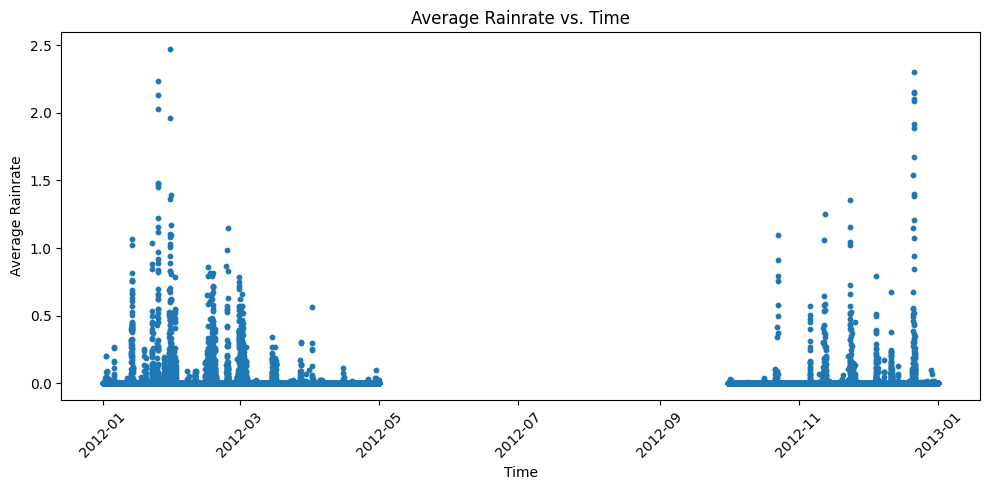

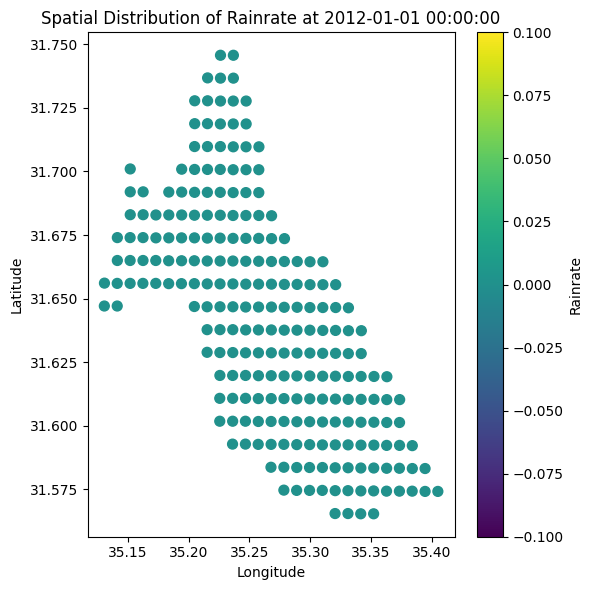

In [108]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the file path
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"

# Load the data
df = pd.read_csv(file_path)

# Convert the 'time' column to datetime objects
df['time'] = pd.to_datetime(df['time'])

# Investigate the dates in the dataset
print("Time range:")
print("Min time:", df['time'].min())
print("Max time:", df['time'].max())

unique_time_frames = df['time'].nunique()
print("Number of unique time frames (10-min intervals):", unique_time_frames)

unique_days = df['time'].dt.date.nunique()
print("Number of unique days:", unique_days)

# Scatter plot 1: Average Rainrate vs. Time
# Group data by each time frame and calculate the mean rainrate
time_avg = df.groupby('time')['rainrate'].mean().reset_index()

plt.figure(figsize=(10, 5))
plt.scatter(time_avg['time'], time_avg['rainrate'], s=10)
plt.xlabel('Time')
plt.ylabel('Average Rainrate')
plt.title('Average Rainrate vs. Time')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Scatter plot 2: Spatial distribution of rainrate at a specific time frame
# Select a specific time frame. Here, we choose the earliest timestamp.
selected_time = df['time'].min()
df_selected = df[df['time'] == selected_time]

plt.figure(figsize=(6, 6))
scatter = plt.scatter(df_selected['longitude'], df_selected['latitude'], 
                      c=df_selected['rainrate'], cmap='viridis', s=50)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Spatial Distribution of Rainrate at {selected_time}')
cbar = plt.colorbar(scatter)
cbar.set_label('Rainrate')
plt.tight_layout()
plt.show()


In [109]:
import pandas as pd

# Define the file path for the discharge data
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"

# Load the CSV file into a DataFrame
df_discharge = pd.read_csv(file_path)

# Display the head of the DataFrame
print("Head of the Discharge Data:")
print(df_discharge.head())


Head of the Discharge Data:
   name                 date  rg_qms       lon       lat
0  דרגה  2012-01-01 00:00:00     0.0  35.36552  31.60015
1  דרגה  2012-01-01 00:10:00     0.0  35.36552  31.60015
2  דרגה  2012-01-01 00:20:00     0.0  35.36552  31.60015
3  דרגה  2012-01-01 00:30:00     0.0  35.36552  31.60015
4  דרגה  2012-01-01 00:40:00     0.0  35.36552  31.60015


Head of the Discharge Data:
   name                date  rg_qms       lon       lat
0  דרגה 2012-01-01 00:00:00     0.0  35.36552  31.60015
1  דרגה 2012-01-01 00:10:00     0.0  35.36552  31.60015
2  דרגה 2012-01-01 00:20:00     0.0  35.36552  31.60015
3  דרגה 2012-01-01 00:30:00     0.0  35.36552  31.60015
4  דרגה 2012-01-01 00:40:00     0.0  35.36552  31.60015


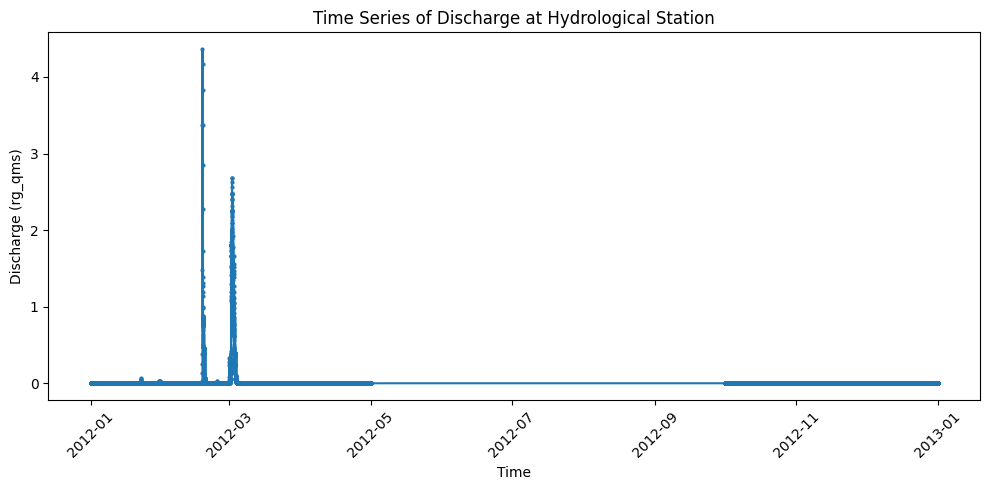

In [112]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the file path for the discharge data
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"

# Load the CSV file into a DataFrame
df_discharge = pd.read_csv(file_path)

# Convert the 'date' column to datetime objects
df_discharge['date'] = pd.to_datetime(df_discharge['date'])

# Optional: Print the head of the DataFrame
print("Head of the Discharge Data:")
print(df_discharge.head())

# Plotting the discharge time series
plt.figure(figsize=(10, 5))
plt.plot(df_discharge['date'], df_discharge['rg_qms'], marker='o', linestyle='-', markersize=2)
plt.xlabel('Time')
plt.ylabel('Discharge (rg_qms)')
plt.title('Time Series of Discharge at Hydrological Station')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


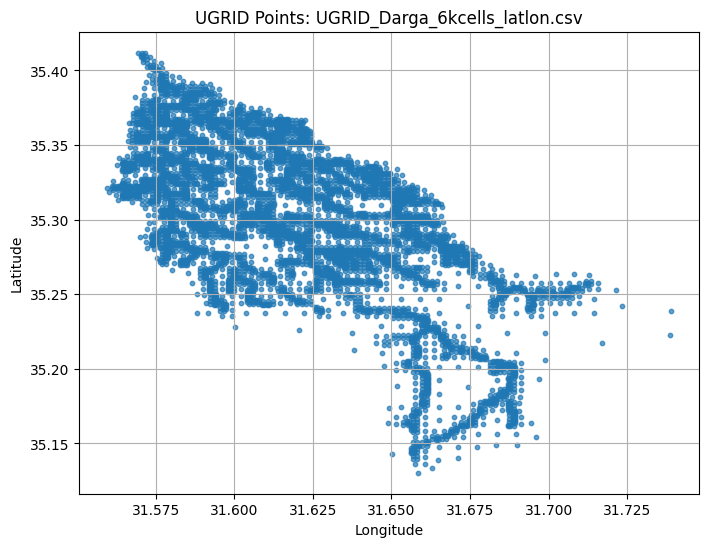

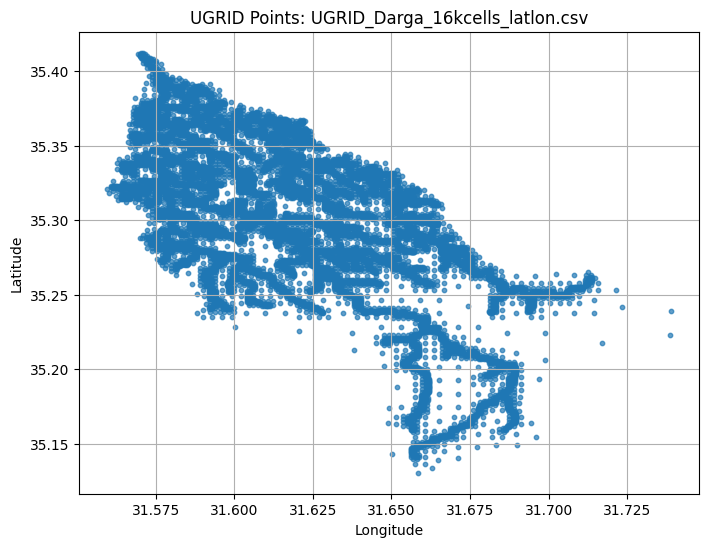

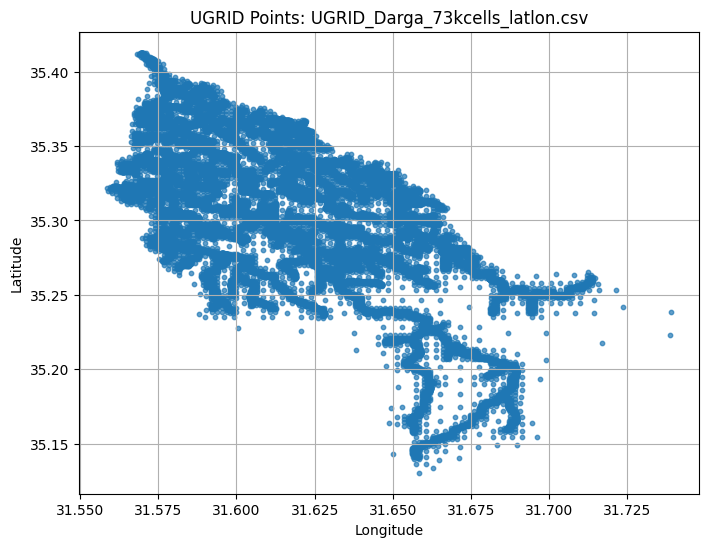

In [115]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the folder path containing the UGRID CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# List of UGRID file names
ugrid_files = [
    "UGRID_Darga_6kcells_latlon.csv",
    "UGRID_Darga_16kcells_latlon.csv",
    "UGRID_Darga_73kcells_latlon.csv"
]

# Loop over each file to read the data and create a scatter plot
for file_name in ugrid_files:
    file_path = os.path.join(folder_path, file_name)
    
    # Load the CSV file into a DataFrame
    df = pd.read_csv(file_path)
    
    # Create a scatter plot: x-axis is longitude, y-axis is latitude
    plt.figure(figsize=(8, 6))
    plt.scatter(df['longitude'], df['latitude'], s=10, alpha=0.7)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"UGRID Points: {file_name}")
    plt.grid(True)
    plt.show()


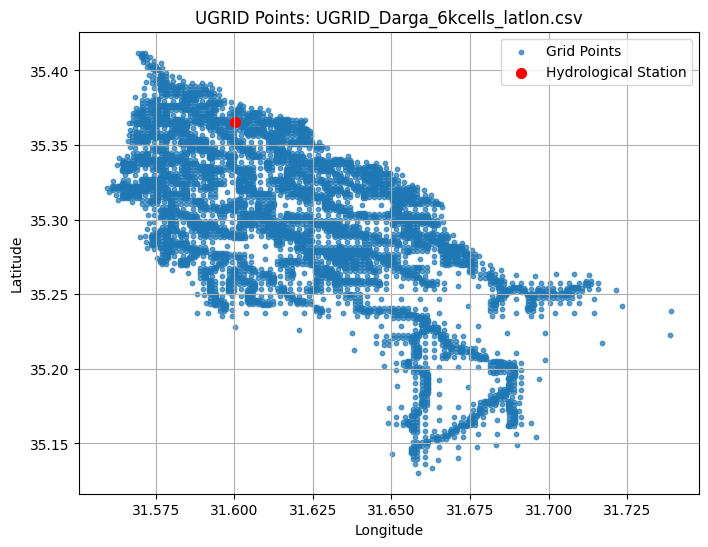

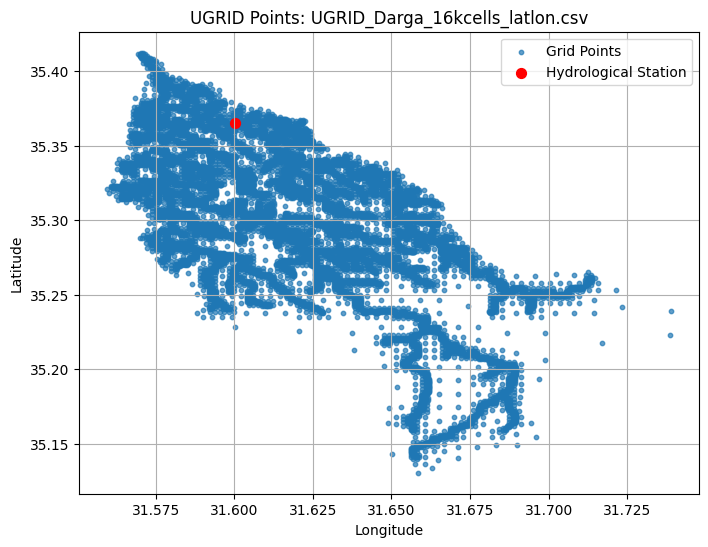

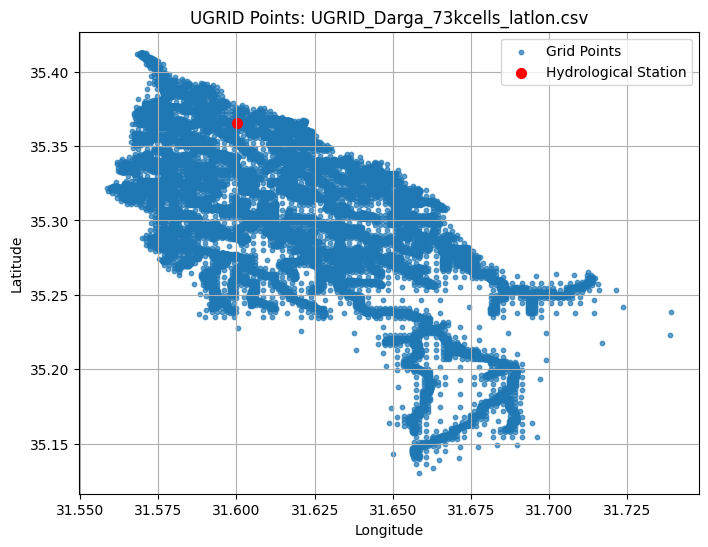

In [117]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the folder path containing the UGRID CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# List of UGRID file names
ugrid_files = [
    "UGRID_Darga_6kcells_latlon.csv",
    "UGRID_Darga_16kcells_latlon.csv",
    "UGRID_Darga_73kcells_latlon.csv"
]

# Hydrological station coordinates (longitude, latitude)
station_lat = 35.36552
station_lon = 31.60015

# Loop over each file to read the data and create a scatter plot
for file_name in ugrid_files:
    file_path = os.path.join(folder_path, file_name)
    
    # Load the CSV file into a DataFrame
    df = pd.read_csv(file_path)
    
    # Create a scatter plot: x-axis is longitude, y-axis is latitude
    plt.figure(figsize=(8, 6))
    plt.scatter(df['longitude'], df['latitude'], s=10, alpha=0.7, label='Grid Points')
    
    # Add a red marker for the hydrological station
    plt.scatter(station_lon, station_lat, color='red', s=50, marker='o', label='Hydrological Station')
    
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"UGRID Points: {file_name}")
    plt.legend()
    plt.grid(True)
    plt.show()


In [120]:
import pandas as pd
import glob
import os

# Define the folder path containing the discharge CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"

# Build a list of CSV files matching the pattern
csv_files = glob.glob(os.path.join(folder_path, "darga_discharge_*.csv"))

for file_path in csv_files:
    print("Processing:", file_path)
    
    # Read the CSV file
    df = pd.read_csv(file_path)
    
    # Swap the 'lon' and 'lat' columns using a temporary variable
    temp = df['lon'].copy()
    df['lon'] = df['lat']
    df['lat'] = temp
    
    # Overwrite the original file with the corrected data
    df.to_csv(file_path, index=False)
    
    print("Swapped columns 'lon' and 'lat' in:", file_path)

print("All discharge files have been updated with swapped coordinates.")


Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv
Swapped columns 'lon' and 'lat' in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2016.csv
Swapped columns 'lon' and 'lat' in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2016.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2019.csv
Swapped columns 'lon' 

In [122]:
import pandas as pd
import glob
import os

# Define the folder path containing the discharge CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"

# Locate all discharge CSV files
csv_files = glob.glob(os.path.join(folder_path, "darga_discharge_*.csv"))

for file_path in csv_files:
    print("Processing:", file_path)
    
    # Read the CSV file
    df = pd.read_csv(file_path)
    
    # Rename the columns:
    # Change 'lon' (which has values around 35.*) to 'latitude'
    # and 'lat' (which has values around 31.*) to 'longitude'
    df = df.rename(columns={"lon": "latitude", "lat": "longitude"})
    
    # Overwrite the original file with the updated DataFrame
    df.to_csv(file_path, index=False)
    
    print("Renamed 'lon' to 'latitude' and 'lat' to 'longitude' in:", file_path)

print("All discharge files have been updated with the correct coordinate names.")


Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv
Renamed 'lon' to 'latitude' and 'lat' to 'longitude' in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2016.csv
Renamed 'lon' to 'latitude' and 'lat' to 'longitude' in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2016.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga

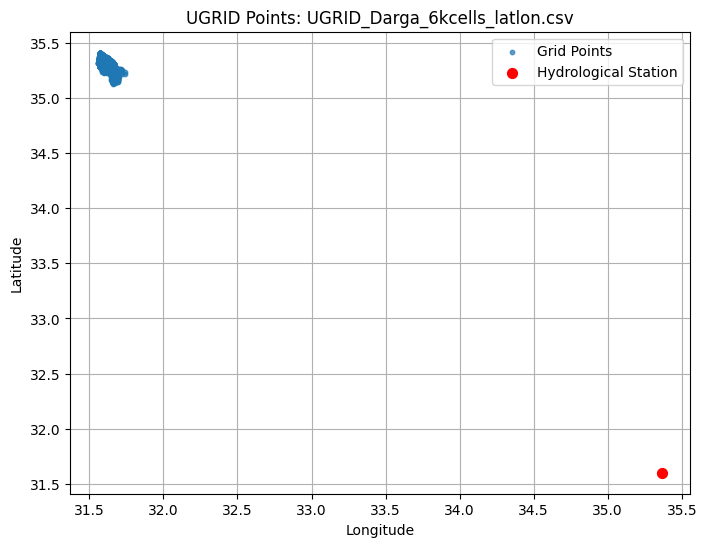

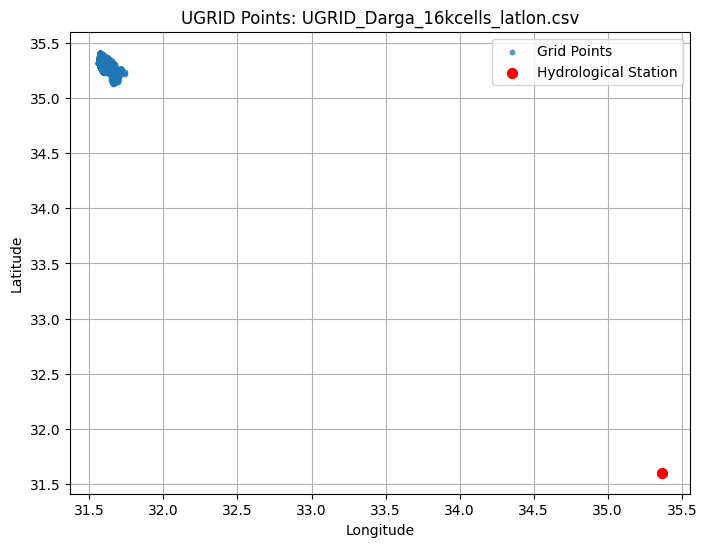

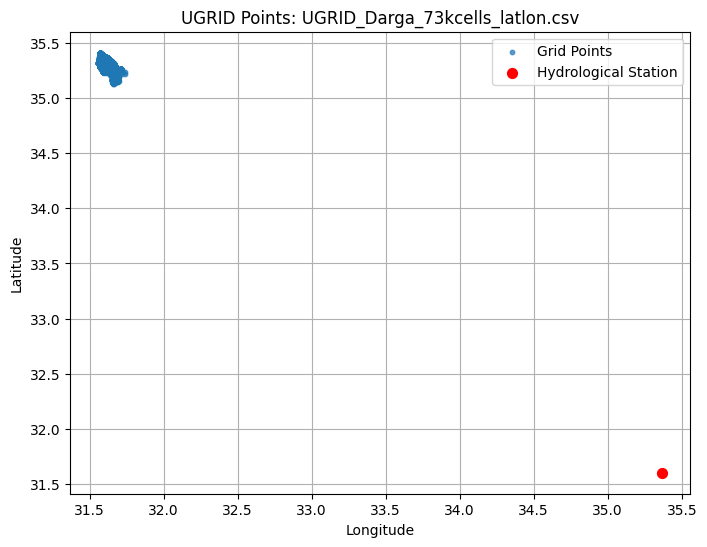

In [133]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the folder path containing the UGRID CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# List of UGRID file names
ugrid_files = [
    "UGRID_Darga_6kcells_latlon.csv",
    "UGRID_Darga_16kcells_latlon.csv",
    "UGRID_Darga_73kcells_latlon.csv"
]

# Hydrological station coordinates:
# From your discharge file header, x (longitude) is 35.36552 and y (latitude) is 31.60015.
station_lon = 35.36552
station_lat = 31.60015

# Loop over each UGRID file to load and plot the grid points along with the hydrological station
for file_name in ugrid_files:
    file_path = os.path.join(folder_path, file_name)
    df = pd.read_csv(file_path)
    
    plt.figure(figsize=(8, 6))
    # Scatter plot of the grid points (x=longitude, y=latitude)
    plt.scatter(df['longitude'], df['latitude'], s=10, alpha=0.7, label='Grid Points')
    
    # Overlay the hydrological station as a red marker
    plt.scatter(station_lon, station_lat, color='red', s=50, marker='o', label='Hydrological Station')
    
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"UGRID Points: {file_name}")
    plt.legend()
    plt.grid(True)
    plt.show()


In [126]:
import pandas as pd
import glob
import os

# Define the folder path containing the discharge CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"

# Locate all discharge CSV files
csv_files = glob.glob(os.path.join(folder_path, "darga_discharge_*.csv"))

# Iterate over each file
for file_path in csv_files:
    print("Processing:", file_path)
    
    # Read the CSV file into a DataFrame
    df = pd.read_csv(file_path)
    
    # Swap the coordinate columns:
    # New "latitude" should come from the current "longitude" (35.* values)
    # New "longitude" should come from the current "latitude" (31.* values)
    df['latitude'], df['longitude'] = df['longitude'].copy(), df['latitude'].copy()
    
    # Overwrite the original file with the corrected data
    df.to_csv(file_path, index=False)
    
    print("Corrected coordinates in:", file_path)

print("All discharge files have been updated with the correct coordinate values.")


Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv
Corrected coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2016.csv
Corrected coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2016.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2019.csv
Corrected coordinates in: /media/data-ssd/

In [128]:
import pandas as pd

# File paths
rain_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
ugrid_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells_latlon.csv"

# Load the data
df_rain = pd.read_csv(rain_file)
df_discharge = pd.read_csv(discharge_file)
df_ugrid = pd.read_csv(ugrid_file)

# Display the head of each DataFrame
print("Head of 2012 Rain Data:")
print(df_rain.head())
print("\n" + "="*50 + "\n")

print("Head of 2012 Discharge Data:")
print(df_discharge.head())
print("\n" + "="*50 + "\n")

print("Head of 6k UGRID Data:")
print(df_ugrid.head())


Head of 2012 Rain Data:
                  time  latitude  longitude  rainrate
0  2012-01-01 00:00:00   31.7457    35.2263       0.0
1  2012-01-01 00:00:00   31.7457    35.2369       0.0
2  2012-01-01 00:00:00   31.7368    35.2157       0.0
3  2012-01-01 00:00:00   31.7367    35.2263       0.0
4  2012-01-01 00:00:00   31.7367    35.2369       0.0


Head of 2012 Discharge Data:
   name                 date  rg_qms  latitude  longitude
0  דרגה  2012-01-01 00:00:00     0.0  35.36552   31.60015
1  דרגה  2012-01-01 00:10:00     0.0  35.36552   31.60015
2  דרגה  2012-01-01 00:20:00     0.0  35.36552   31.60015
3  דרגה  2012-01-01 00:30:00     0.0  35.36552   31.60015
4  דרגה  2012-01-01 00:40:00     0.0  35.36552   31.60015


Head of 6k UGRID Data:
   ID  AREA_2M   latitude  longitude  STRM_ORDER  STREAM_CELL         DEM  \
0   1   260847  35.266465  31.580134           3            1  509.220426   
1   2  1510689  35.227964  31.600390           3            0  722.415574   
2   3    39704  3

In [129]:
import pandas as pd
import glob
import os

# Define the folder path containing the rain CSV files
rain_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"

# Locate all rain CSV files in the folder (assuming they are named like darga_rain_2012.csv, etc.)
csv_files = glob.glob(os.path.join(rain_folder, "darga_rain_*.csv"))

# Iterate over each file, swap the coordinate columns, and overwrite the file
for file_path in csv_files:
    print("Processing:", file_path)
    
    # Read the CSV file
    df = pd.read_csv(file_path)
    
    # Swap the coordinate columns:
    # The current 'latitude' column holds values around 31.*, and
    # the current 'longitude' column holds values around 35.*.
    # We want the new 'latitude' to have the ~35.* values and
    # the new 'longitude' to have the ~31.* values.
    df['latitude'], df['longitude'] = df['longitude'].copy(), df['latitude'].copy()
    
    # Overwrite the file with the corrected data
    df.to_csv(file_path, index=False)
    
    print("Corrected coordinates in:", file_path)

print("All rain files have been updated with the correct coordinate values.")


Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2016.csv
Corrected coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2016.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2018.csv
Corrected coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2018.csv
Processing: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv
Corrected coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC mo

In [130]:
import pandas as pd

# File paths
rain_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
ugrid_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells_latlon.csv"

# Load the data
df_rain = pd.read_csv(rain_file)
df_discharge = pd.read_csv(discharge_file)
df_ugrid = pd.read_csv(ugrid_file)

# Display the head of each DataFrame
print("Head of 2012 Rain Data:")
print(df_rain.head())
print("\n" + "="*50 + "\n")

print("Head of 2012 Discharge Data:")
print(df_discharge.head())
print("\n" + "="*50 + "\n")

print("Head of 6k UGRID Data:")
print(df_ugrid.head())

Head of 2012 Rain Data:
                  time  latitude  longitude  rainrate
0  2012-01-01 00:00:00   35.2263    31.7457       0.0
1  2012-01-01 00:00:00   35.2369    31.7457       0.0
2  2012-01-01 00:00:00   35.2157    31.7368       0.0
3  2012-01-01 00:00:00   35.2263    31.7367       0.0
4  2012-01-01 00:00:00   35.2369    31.7367       0.0


Head of 2012 Discharge Data:
   name                 date  rg_qms  latitude  longitude
0  דרגה  2012-01-01 00:00:00     0.0  35.36552   31.60015
1  דרגה  2012-01-01 00:10:00     0.0  35.36552   31.60015
2  דרגה  2012-01-01 00:20:00     0.0  35.36552   31.60015
3  דרגה  2012-01-01 00:30:00     0.0  35.36552   31.60015
4  דרגה  2012-01-01 00:40:00     0.0  35.36552   31.60015


Head of 6k UGRID Data:
   ID  AREA_2M   latitude  longitude  STRM_ORDER  STREAM_CELL         DEM  \
0   1   260847  35.266465  31.580134           3            1  509.220426   
1   2  1510689  35.227964  31.600390           3            0  722.415574   
2   3    39704  3

In [1]:
import pandas as pd
import glob
import os

def ensure_correct_coordinates(file_path):
    """Read a CSV file, check coordinate order, and swap if necessary.
    
    Desired order: latitude ~31.* and longitude ~35.*.
    If the first row shows latitude > longitude, then the file’s
    coordinates are swapped. We then swap them so that:
      new latitude = original longitude,
      new longitude = original latitude.
    """
    try:
        df = pd.read_csv(file_path)
        # Check if file is not empty
        if df.empty:
            print(f"Empty file, skipping: {file_path}")
            return
        
        # Get the first row's coordinates (assuming they are numeric)
        first_lat = df['latitude'].iloc[0]
        first_lon = df['longitude'].iloc[0]
        
        # If latitude is greater than longitude, then values are reversed.
        if first_lat > first_lon:
            df['latitude'], df['longitude'] = df['longitude'].copy(), df['latitude'].copy()
            df.to_csv(file_path, index=False)
            print(f"Swapped coordinates in: {file_path}")
        else:
            print(f"No swap needed in: {file_path}")
    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Define folders and file patterns
rain_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
ugrid_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# Find all files in each group
rain_files = glob.glob(os.path.join(rain_folder, "darga_rain_*.csv"))
discharge_files = glob.glob(os.path.join(discharge_folder, "darga_discharge_*.csv"))
ugrid_files = glob.glob(os.path.join(ugrid_folder, "UGRID_Darga_*latlon.csv"))

print("Processing Rain Files:")
for file_path in rain_files:
    ensure_correct_coordinates(file_path)

print("\nProcessing Discharge Files:")
for file_path in discharge_files:
    ensure_correct_coordinates(file_path)

print("\nProcessing UGRID Files:")
for file_path in ugrid_files:
    ensure_correct_coordinates(file_path)

print("\nAll files processed.")


Processing Rain Files:
Swapped coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2016.csv
Swapped coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2018.csv
Swapped coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2013.csv
Swapped coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2020.csv
Swapped coordinates in: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2019.csv
Swapped coordinates in: /media/data-s

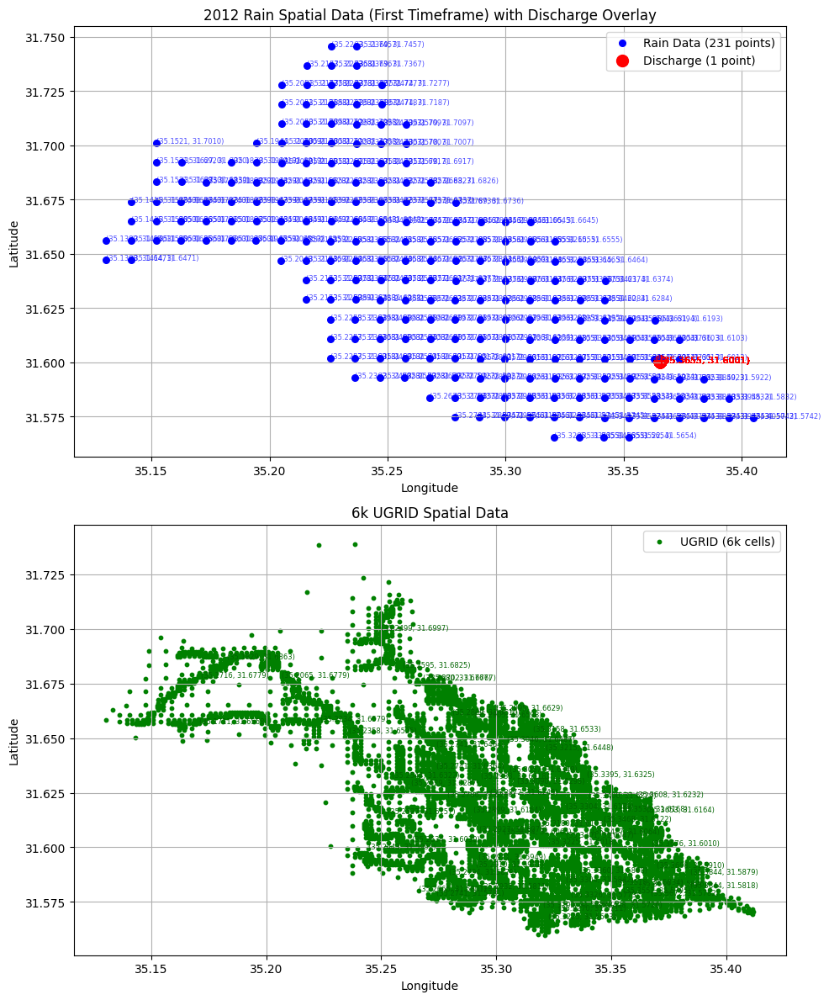

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# File paths
rain_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
ugrid_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells_latlon.csv"

# Load datasets
df_rain = pd.read_csv(rain_file)
df_discharge = pd.read_csv(discharge_file)
df_ugrid = pd.read_csv(ugrid_file)

# --- Assume files are already corrected such that:
#      latitude values are ~31.* and longitude values are ~35.*
# --- For the rain data, select the first timeframe (should be 231 points)
first_time = df_rain['time'].iloc[0]
df_rain_first = df_rain[df_rain['time'] == first_time]

# Create a figure with two subplots (top for rain + discharge, bottom for UGRID)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))

# --- Top Plot: 2012 Rain Data (first timeframe) with Discharge Overlay ---
ax1.scatter(df_rain_first['longitude'], df_rain_first['latitude'],
            color='blue', s=30, label='Rain Data (231 points)')
# Annotate each rain point with its (longitude, latitude)
for idx, row in df_rain_first.iterrows():
    ax1.annotate(f"({row['longitude']:.4f}, {row['latitude']:.4f})",
                 (row['longitude'], row['latitude']),
                 fontsize=6, color='blue', alpha=0.7)

# Overlay the discharge point (should be 1 point)
ax1.scatter(df_discharge['longitude'], df_discharge['latitude'],
            color='red', marker='o', s=100, label='Discharge (1 point)')
for idx, row in df_discharge.iterrows():
    ax1.annotate(f"({row['longitude']:.4f}, {row['latitude']:.4f})",
                 (row['longitude'], row['latitude']),
                 fontsize=8, color='red')

ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax1.set_title("2012 Rain Spatial Data (First Timeframe) with Discharge Overlay")
ax1.legend()
ax1.grid(True)

# --- Bottom Plot: 6k UGRID Data ---
ax2.scatter(df_ugrid['longitude'], df_ugrid['latitude'],
            color='green', s=10, label='UGRID (6k cells)')
# To reduce clutter, annotate every 100th point
for idx, row in df_ugrid.iloc[::100].iterrows():
    ax2.annotate(f"({row['longitude']:.4f}, {row['latitude']:.4f})",
                 (row['longitude'], row['latitude']),
                 fontsize=6, color='darkgreen')

ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")
ax2.set_title("6k UGRID Spatial Data")
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


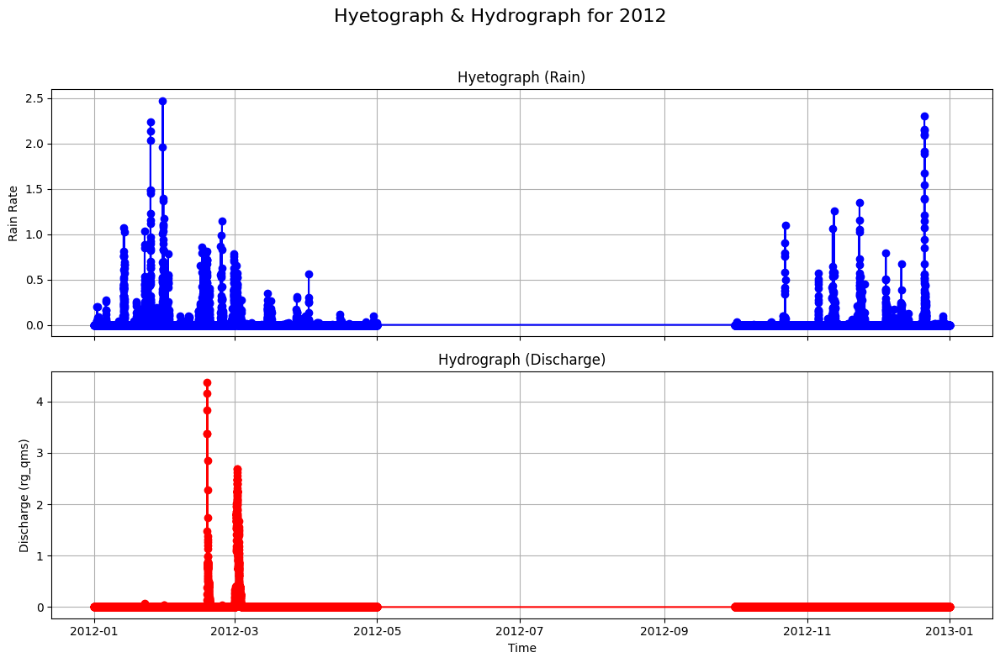

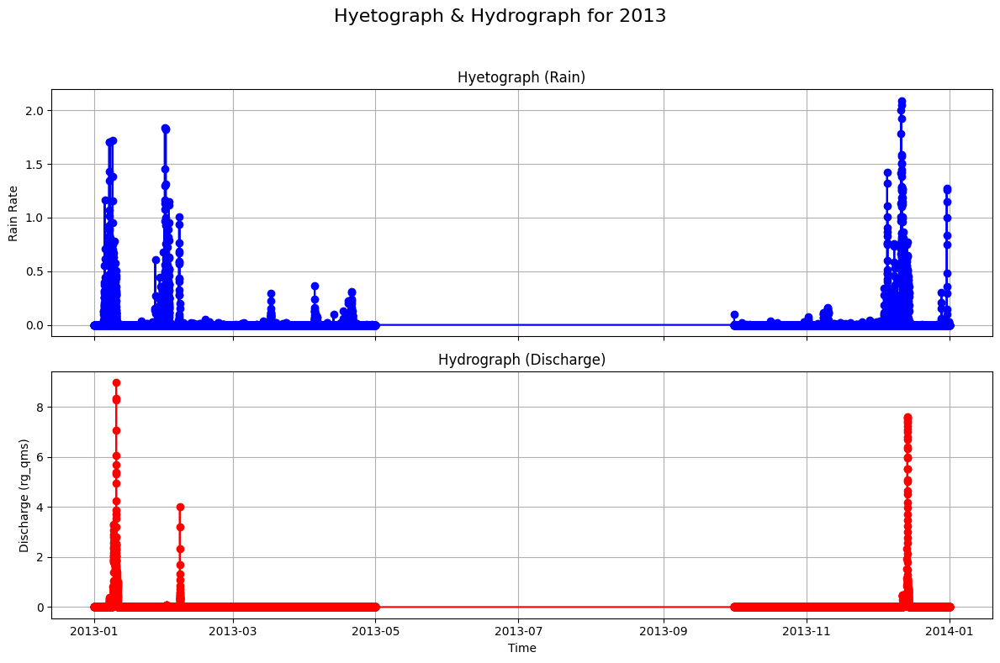

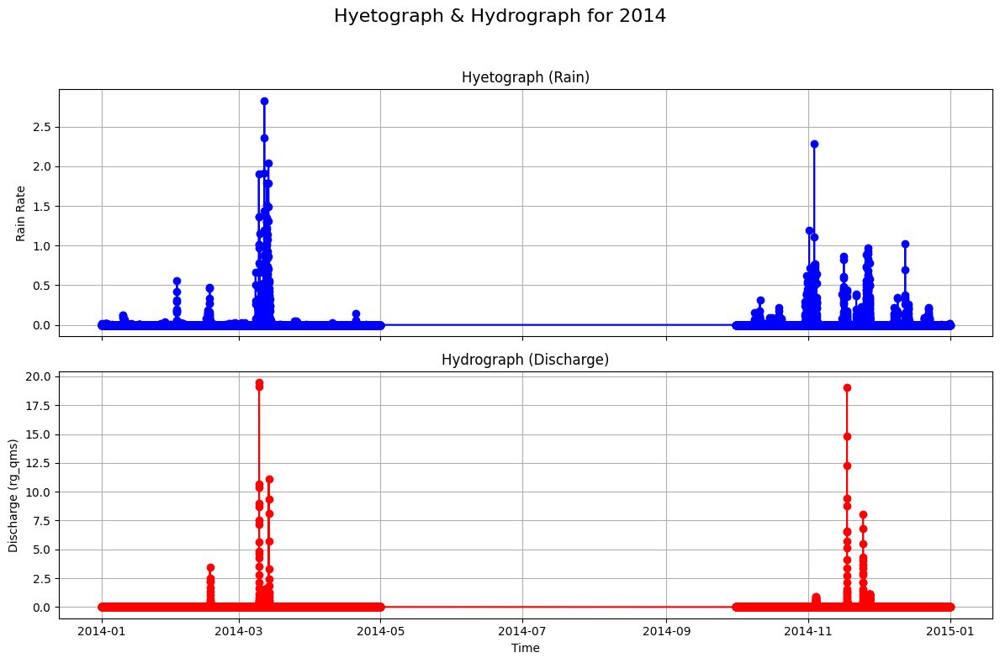

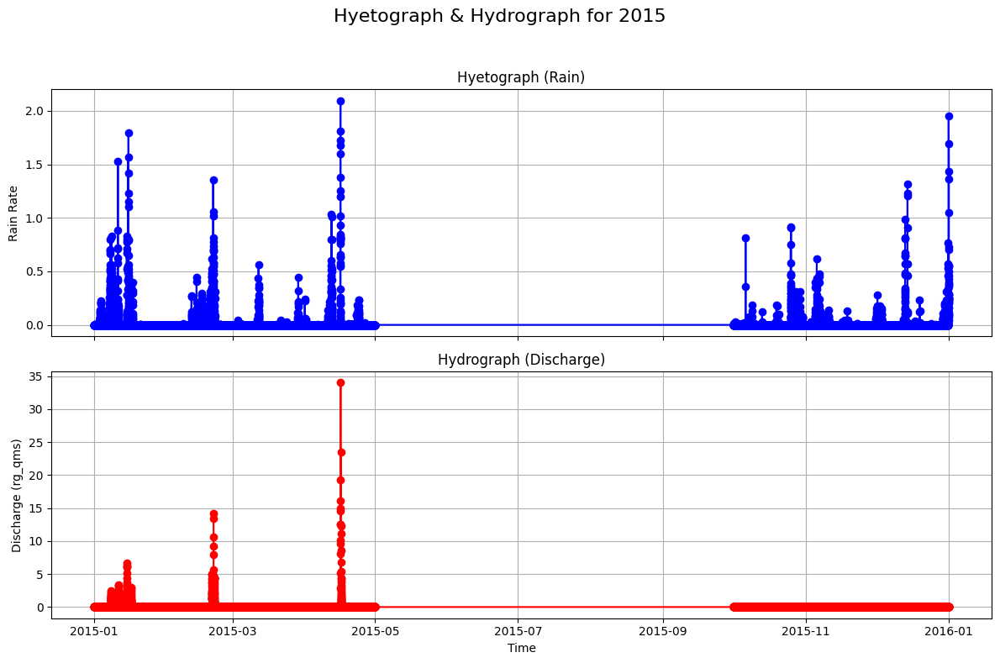

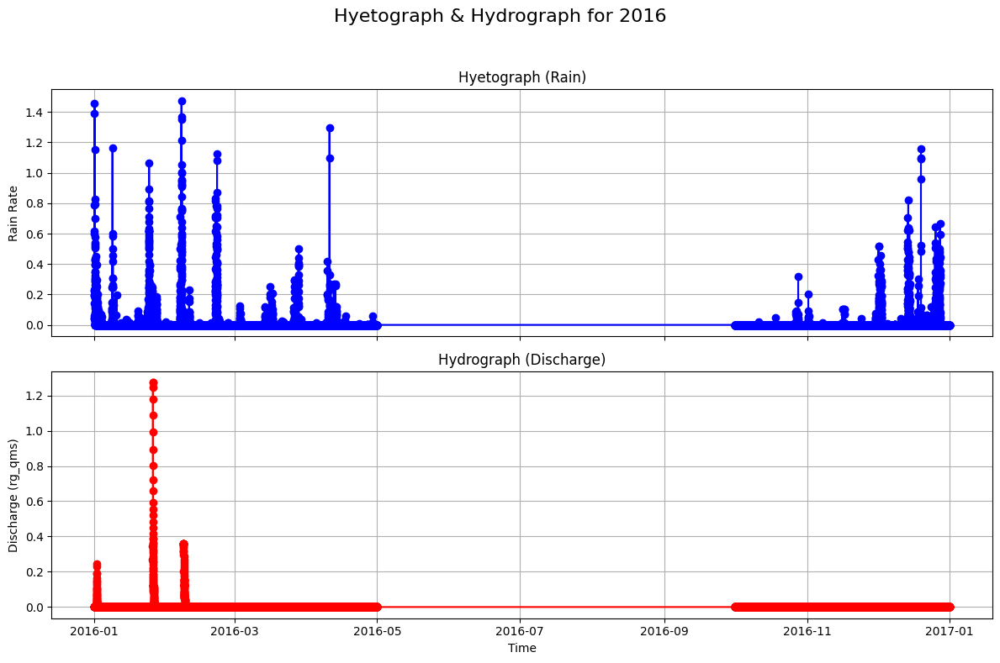

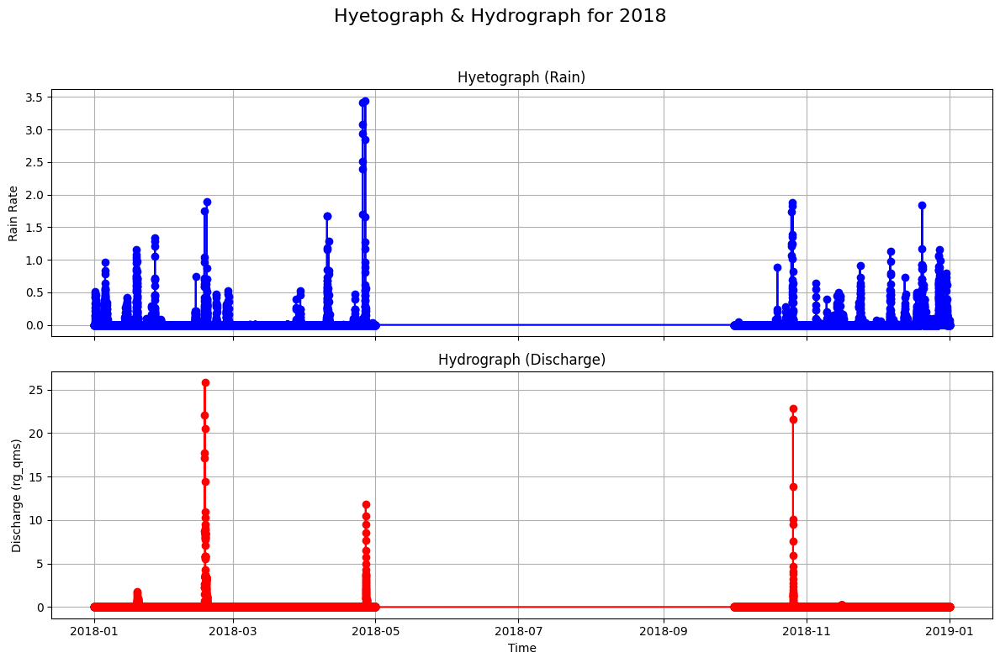

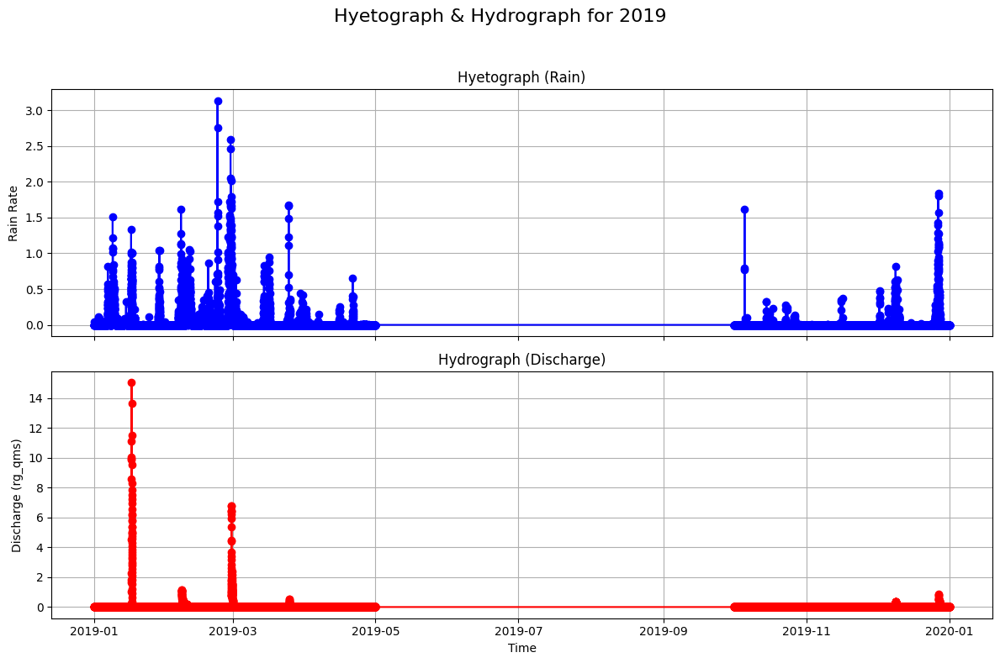

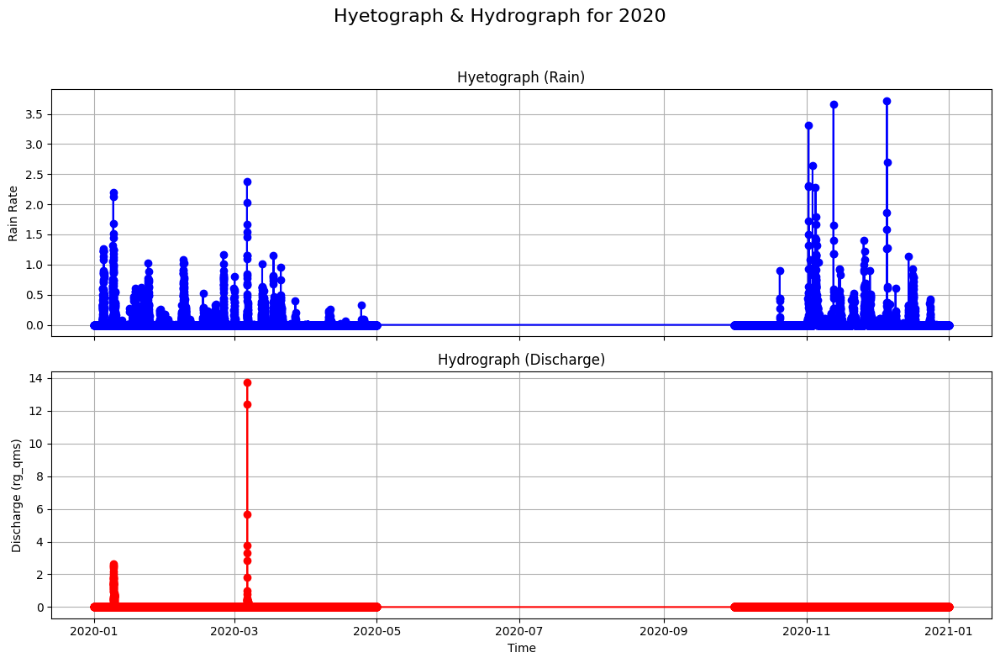

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# List of years for which we have data
years = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# Base folders for rain and discharge data
rain_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain"
discharge_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"

for year in years:
    # Build file paths for the current year
    rain_file = f"{rain_folder}/darga_rain_{year}.csv"
    discharge_file = f"{discharge_folder}/darga_discharge_{year}.csv"
    
    # Load rain and discharge data
    df_rain = pd.read_csv(rain_file)
    df_discharge = pd.read_csv(discharge_file)
    
    # Convert time columns to datetime objects
    df_rain['time'] = pd.to_datetime(df_rain['time'])
    df_discharge['date'] = pd.to_datetime(df_discharge['date'])
    
    # Aggregate rain data spatially:
    # For each timestamp, average the rain rate across all spatial pixels.
    rain_agg = df_rain.groupby('time')['rainrate'].mean().reset_index()
    
    # Create a figure with two subplots (top: hyetograph, bottom: hydrograph)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
    fig.suptitle(f"Hyetograph & Hydrograph for {year}", fontsize=16)
    
    # Plot hyetograph (rain)
    ax1.plot(rain_agg['time'], rain_agg['rainrate'], color='blue', marker='o', linestyle='-')
    ax1.set_ylabel("Rain Rate")
    ax1.set_title("Hyetograph (Rain)")
    ax1.grid(True)
    
    # Plot hydrograph (discharge)
    ax2.plot(df_discharge['date'], df_discharge['rg_qms'], color='red', marker='o', linestyle='-')
    ax2.set_ylabel("Discharge (rg_qms)")
    ax2.set_title("Hydrograph (Discharge)")
    ax2.set_xlabel("Time")
    ax2.grid(True)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


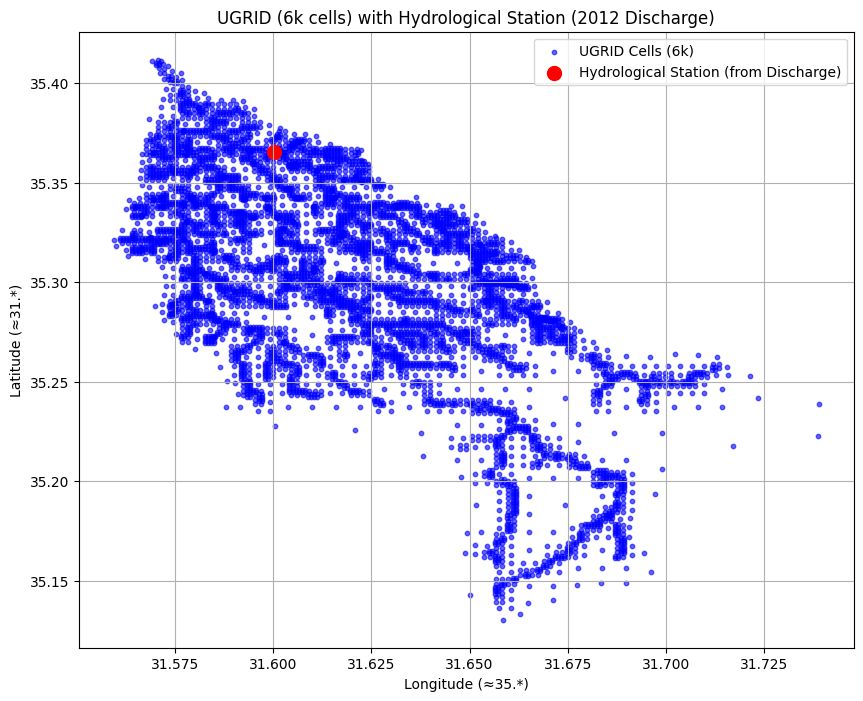

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# File paths
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
ugrid_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells_latlon.csv"

# 1. Read the discharge file and extract the hydrological station coordinates
df_discharge = pd.read_csv(discharge_file)
# All rows have the same coordinates, so take the first row.
row = df_discharge.iloc[0]
# Current values in the file:
#   latitude: 35.36552 and longitude: 31.60015
# Desired final system: latitude ≈ 31.* and longitude ≈ 35.*,
# so we swap them.
station_lat = row["longitude"]   # becomes ~31.60015
station_lon = row["latitude"]    # becomes ~35.36552

# 2. Read the UGRID file and correct its coordinate order
df_ugrid = pd.read_csv(ugrid_file)
# The UGRID file currently has:
#   latitude ≈ 35.* and longitude ≈ 31.*
# We create corrected columns:
df_ugrid["correct_lat"] = df_ugrid["longitude"]  # ~31.*
df_ugrid["correct_lon"] = df_ugrid["latitude"]   # ~35.*

# 3. Plot the UGRID data and overlay the hydrological station
plt.figure(figsize=(10, 8))
plt.scatter(df_ugrid["correct_lon"], df_ugrid["correct_lat"],
            s=10, color='blue', alpha=0.6, label='UGRID Cells (6k)')
plt.scatter(station_lon, station_lat, color='red', s=100, marker='o',
            label='Hydrological Station (from Discharge)')

plt.xlabel("Longitude (≈35.*)")
plt.ylabel("Latitude (≈31.*)")
plt.title("UGRID (6k cells) with Hydrological Station (2012 Discharge)")
plt.legend()
plt.grid(True)
plt.show()


In [10]:
import pandas as pd

def inspect_file(file_path, file_label, lat_col='latitude', lon_col='longitude'):
    """Reads a CSV file, prints diagnostic information about coordinates."""
    print(f"\n{'='*70}")
    print(f"Inspecting {file_label}: {file_path}")
    try:
        df = pd.read_csv(file_path)
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return
    
    print(f"Shape: {df.shape} (rows, columns)")
    print(f"Columns: {list(df.columns)}")
    
    # Print head
    print("\nHead of the file:")
    print(df.head())
    
    # Check if the latitude and longitude columns exist
    if lat_col not in df.columns or lon_col not in df.columns:
        print(f"\n[WARNING] Columns '{lat_col}' or '{lon_col}' not found in {file_label}.")
        return
    
    # Print min and max of latitude and longitude
    print("\nCoordinate stats:")
    print(f"  {lat_col} min: {df[lat_col].min()}, max: {df[lat_col].max()}")
    print(f"  {lon_col} min: {df[lon_col].min()}, max: {df[lon_col].max()}")
    
    # Check first row
    first_lat = df[lat_col].iloc[0]
    first_lon = df[lon_col].iloc[0]
    print(f"\nFirst row -> {lat_col}: {first_lat}, {lon_col}: {first_lon}")
    
    if first_lat > first_lon:
        print("[NOTE] The first row has latitude > longitude, which can indicate swapped columns.\n")
    else:
        print("[NOTE] The first row has latitude <= longitude, which might be correct or still need checking.\n")

# -------------------------------------------------------------------------
# Adjust the file paths below to match your actual file structure
# -------------------------------------------------------------------------
rain_2012 = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_2012 = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
ugrid_6k = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells_latlon.csv"

# Inspect the three key files
inspect_file(rain_2012, "2012 Rain")
inspect_file(discharge_2012, "2012 Discharge")
inspect_file(ugrid_6k, "6k UGRID")



Inspecting 2012 Rain: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv
Shape: (7085232, 4) (rows, columns)
Columns: ['time', 'latitude', 'longitude', 'rainrate']

Head of the file:
                  time  latitude  longitude  rainrate
0  2012-01-01 00:00:00   31.7457    35.2263       0.0
1  2012-01-01 00:00:00   31.7457    35.2369       0.0
2  2012-01-01 00:00:00   31.7368    35.2157       0.0
3  2012-01-01 00:00:00   31.7367    35.2263       0.0
4  2012-01-01 00:00:00   31.7367    35.2369       0.0

Coordinate stats:
  latitude min: 31.5654, max: 31.7457
  longitude min: 35.1308, max: 35.405

First row -> latitude: 31.7457, longitude: 35.2263
[NOTE] The first row has latitude <= longitude, which might be correct or still need checking.


Inspecting 2012 Discharge: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PIN

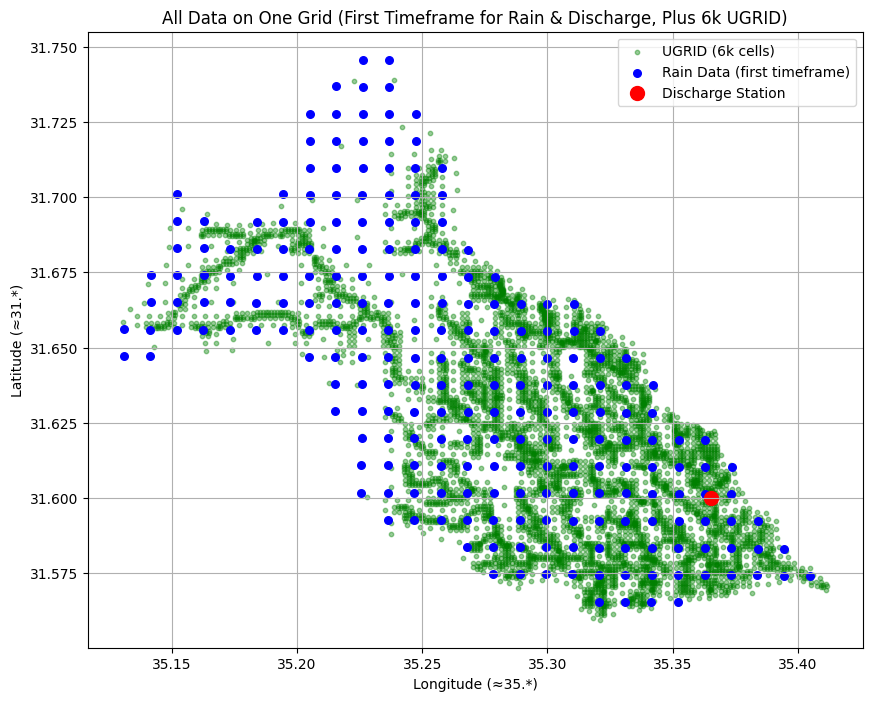

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------------------------------------------------
# 1. Load Data
# -------------------------------------------------------------------------
rain_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga rain/darga_rain_2012.csv"
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
ugrid_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells_latlon.csv"

df_rain = pd.read_csv(rain_file)
df_discharge = pd.read_csv(discharge_file)
df_ugrid = pd.read_csv(ugrid_file)

# Convert relevant time columns to datetime
df_rain['time'] = pd.to_datetime(df_rain['time'])
df_discharge['date'] = pd.to_datetime(df_discharge['date'])

# -------------------------------------------------------------------------
# 2. Extract First Timestamp Data
# -------------------------------------------------------------------------
# For rain: select rows corresponding to the earliest time
first_rain_time = df_rain['time'].min()
df_rain_first = df_rain[df_rain['time'] == first_rain_time]

# For discharge: select the first row (the station location is the same anyway)
# but we'll keep it consistent with the "first timestamp" logic
first_discharge_time = df_discharge['date'].min()
df_discharge_first = df_discharge[df_discharge['date'] == first_discharge_time]

# -------------------------------------------------------------------------
# 3. Plot All Data on One Grid
# -------------------------------------------------------------------------
plt.figure(figsize=(10, 8))

# 3a. Plot UGRID (6k cells)
plt.scatter(
    df_ugrid['longitude'], df_ugrid['latitude'],
    s=10, color='green', alpha=0.4, label='UGRID (6k cells)'
)

# 3b. Plot Rain Data (first timestamp)
plt.scatter(
    df_rain_first['longitude'], df_rain_first['latitude'],
    s=30, color='blue', label='Rain Data (first timeframe)'
)

# 3c. Plot Discharge Station (first timestamp)
plt.scatter(
    df_discharge_first['longitude'], df_discharge_first['latitude'],
    s=100, color='red', marker='o', label='Discharge Station'
)

# -------------------------------------------------------------------------
# 4. Finalize the Plot
# -------------------------------------------------------------------------
plt.xlabel("Longitude (≈35.*)")
plt.ylabel("Latitude (≈31.*)")
plt.title("All Data on One Grid (First Timeframe for Rain & Discharge, Plus 6k UGRID)")
plt.legend()
plt.grid(True)
plt.show()


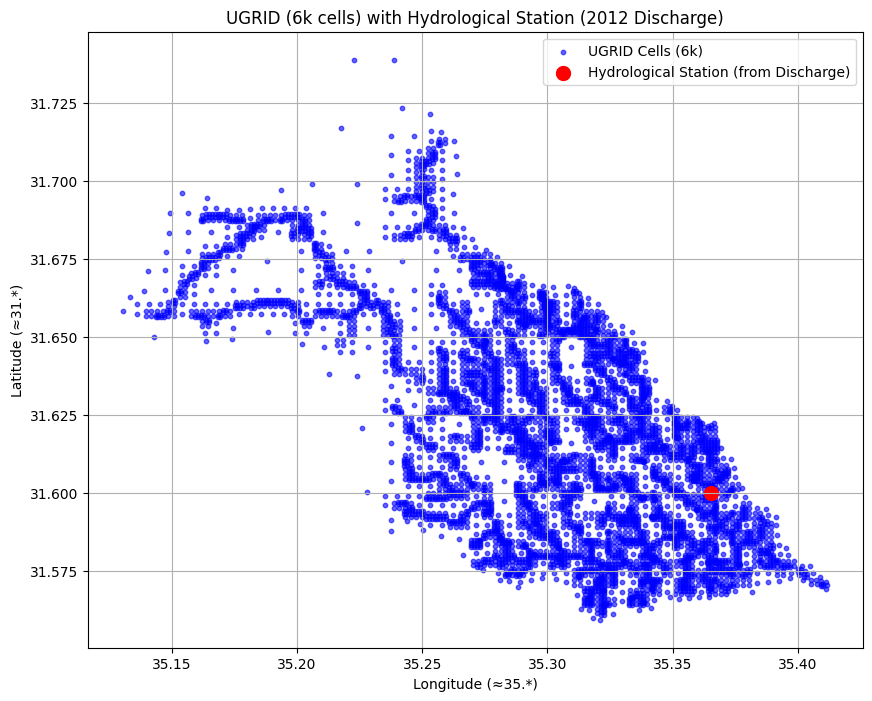

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# File paths
discharge_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv"
ugrid_file = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/UGRID_Darga_6kcells_latlon.csv"

# 1. Read the discharge file and extract the hydrological station coordinates
df_discharge = pd.read_csv(discharge_file)
row = df_discharge.iloc[0]
# Use the columns as they are in the file
station_lat = row["latitude"]    # ~31.60015
station_lon = row["longitude"]   # ~35.36552

# 2. Read the UGRID file (which already has correct coordinates)
df_ugrid = pd.read_csv(ugrid_file)
# No need to swap the UGRID coordinates. They are:
#    latitude ~31.* and longitude ~35.*

# 3. Plot the UGRID data and overlay the hydrological station
plt.figure(figsize=(10, 8))
plt.scatter(df_ugrid["longitude"], df_ugrid["latitude"],
            s=10, color='blue', alpha=0.6, label='UGRID Cells (6k)')
plt.scatter(station_lon, station_lat, color='red', s=100, marker='o',
            label='Hydrological Station (from Discharge)')

plt.xlabel("Longitude (≈35.*)")
plt.ylabel("Latitude (≈31.*)")
plt.title("UGRID (6k cells) with Hydrological Station (2012 Discharge)")
plt.legend()
plt.grid(True)
plt.show()


In [15]:
#ITS FIT ACCORDING o3MINI
import os
import logging
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
# Main folder with the 3 UGRID files:
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# Our UGRID files are already correct; their names include the _latlon suffix.
UGRID_FILES = [
    "UGRID_Darga_6kcells_latlon.csv",
    "UGRID_Darga_16kcells_latlon.csv",
    "UGRID_Darga_73kcells_latlon.csv"
]

# Folder where the 8 rain CSV files live (one per year)
RAIN_FOLDER = os.path.join(SPATIAL_FOLDER, "darga rain")

# Output folder for final kriged+merged results
KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results")

# Years of rain data
RAIN_YEARS = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# ------------------------------------------------------------------------------
# LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# STEP A: RENAME UGRID FILES IN PLACE (OPTIONAL)
# ------------------------------------------------------------------------------
# Since our UGRID files are already correct, you can comment out the call to this function.
def rename_ugrid_in_place():
    """
    For each file in UGRID_FILES, rename columns X->latitude, Y->longitude,
    and then rename the file to include '_latlon' at the end.
    
    WARNING: This modifies files in SPATIAL_FOLDER.
    """
    for fname in UGRID_FILES:
        old_path = os.path.join(SPATIAL_FOLDER, fname)
        if not os.path.exists(old_path):
            logging.warning(f"[rename_ugrid_in_place] File not found => {old_path}")
            continue
        
        df = pd.read_csv(old_path)
        
        # Rename columns if they exist
        rename_dict = {}
        if "X" in df.columns:
            rename_dict["X"] = "latitude"
        if "Y" in df.columns:
            rename_dict["Y"] = "longitude"
        
        df.rename(columns=rename_dict, inplace=True)
        df.to_csv(old_path, index=False)
        
        new_fname = fname.replace(".csv", "_latlon.csv")
        new_path = os.path.join(SPATIAL_FOLDER, new_fname)
        os.rename(old_path, new_path)
        logging.info(f"Renamed: {fname} => {new_fname}, columns X->latitude, Y->longitude")

# Uncomment the next line only if you need to rename the UGRID files.
# rename_ugrid_in_place()

# ------------------------------------------------------------------------------
# STEP B1: Ordinary Kriging for One Timestep
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Perform kriging using a 'spherical' variogram model.
    :param rain_subset: DataFrame with [latitude, longitude, rainrate]
    :param grid_lat: UGRID 'latitude' array
    :param grid_lon: UGRID 'longitude' array
    :return: np.array of kriged values across the grid
    """
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="spherical",
        verbose=False,
        enable_plotting=False
    )
    
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
# STEP B2: Krige an Entire Year + Merge
# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_path, rain_file, output_csv):
    """
    - Load the UGRID (latlon) file.
    - Load a year's rain data [time, latitude, longitude, rainrate].
    - For each timestamp, if <3 points => fill with 0; if std==0 => fill with mean; else perform kriging.
    - Merge kriged values with UGRID static columns and output CSV.
    """
    logging.info(f"=== Kriging {os.path.basename(rain_file)} onto {os.path.basename(ugrid_path)} => {output_csv}")
    
    df_ugrid = pd.read_csv(ugrid_path)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] UGRID missing 'latitude' or 'longitude'. Aborting.")
        return
    
    if not os.path.exists(rain_file):
        logging.error(f"[krige_rain_one_year] Rain file not found: {rain_file}")
        return
    
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] Rain data missing 'time' column. Aborting.")
        return
    
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    logging.info(f"  Found {len(unique_times)} timestamps in {os.path.basename(rain_file)}.")
    
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    
    results_list = []
    
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            # Not enough points => fill with zeros
            kriged_vals = np.zeros_like(grid_lat)
        else:
            val_std = subset["rainrate"].std()
            if val_std < 1e-8:
                # Nearly constant values => fill with the mean value
                mean_val = subset["rainrate"].mean()
                kriged_vals = np.full_like(grid_lat, mean_val)
            else:
                try:
                    kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
                except Exception as e:
                    logging.error(f"  Time={tstamp} kriging error => {e}, fallback=mean.")
                    mean_val = subset["rainrate"].mean()
                    kriged_vals = np.full_like(grid_lat, mean_val)
        
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results_list.append(df_kriged)
        
        if (i+1) % 50 == 0:
            logging.info(f"  Processed {i+1}/{len(unique_times)} timesteps.")
    
    df_kriged_all = pd.concat(results_list, ignore_index=True)
    
    # Merge with static columns from UGRID
    static_cols = [c for c in df_ugrid.columns if c not in ("ID", "latitude", "longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID", "latitude", "longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] Saved: {output_csv}")

# ------------------------------------------------------------------------------
# MAIN
# ------------------------------------------------------------------------------
def main():
    # Since our UGRID files are already correct, we do not call rename_ugrid_in_place().
    # rename_ugrid_in_place()
    
    # new_ugrid_files are taken from the already-correct UGRID_FILES list.
    new_ugrid_files = UGRID_FILES
    
    for fname in new_ugrid_files:
        latlon_ugrid_path = os.path.join(SPATIAL_FOLDER, fname)
        
        if "6kcells" in fname:
            out_subdir = "6k_rain_kriged_merged"
        elif "16kcells" in fname:
            out_subdir = "16k_rain_kriged_merged"
        elif "73kcells" in fname:
            out_subdir = "73k_rain_kriged_merged"
        else:
            out_subdir = "unknown_resolution"
        
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        os.makedirs(out_dir, exist_ok=True)
        
        logging.info(f"--- Kriging for UGRID: {fname} => Output folder: {out_dir}")
        
        for year in RAIN_YEARS:
            rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
            out_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
            
            krige_rain_one_year(
                ugrid_path=latlon_ugrid_path,
                rain_file=rain_file,
                output_csv=out_csv
            )

# ------------------------------------------------------------------------------
# OPTIONAL TEST
# ------------------------------------------------------------------------------
def test_kriging_results():
    """
    Minimal check for one final CSV, e.g. the 6k 2012 data,
    to see if it has the expected columns.
    """
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2012_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error(f"[TEST] Not found => {test_file}.")
        return
    
    df_test = pd.read_csv(test_file, nrows=20)
    required = {"ID", "time", "rainrate", "latitude", "longitude"}
    missing = required - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Missing columns => {missing}")
    else:
        logging.info("[TEST] Found expected columns => PASSED!")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()


2025-03-26 14:25:09,521 [INFO] --- Kriging for UGRID: UGRID_Darga_6kcells_latlon.csv => Output folder: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged
2025-03-26 14:25:09,521 [INFO] === Kriging darga_rain_2012.csv onto UGRID_Darga_6kcells_latlon.csv => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv
2025-03-26 14:25:11,054 [INFO]   Found 30672 timestamps in darga_rain_2012.csv.
2025-03-26 14:25:24,368 [INFO]   Processed 50/30672 timesteps.
2025-03-26 14:25:37,638 [INFO]   Processed 100/30672 timesteps.
2025-03-26 14:25:50,932 [INFO]   Processed 150/30672 timesteps.
2025-03-26 14:26:07,776 [INFO]   Processed 200/30672 timesteps.
2025-03-26 14:26:22,953 [INFO]   Processed 250/30672 timesteps.
2025-03-

KeyboardInterrupt: 

In [ ]:


####this code should perform Ordinary Kriging just on the 6K res and 16K res
































#this code start with the 7K and 16K. giving up the 73K
import os
import logging
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
# Main folder with the 3 UGRID files:
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# The 3 original CSV names (we keep the 73k entry but will skip it later)
UGRID_FILES = [
    "UGRID_Darga_6kcells_latlon.csv",
    "UGRID_Darga_16kcells_latlon.csv",
    "UGRID_Darga_73kcells_latlon.csv"
]

# Where the 8 rain CSV files live (one per year)
RAIN_FOLDER = os.path.join(SPATIAL_FOLDER, "darga rain")

# Output folder for final kriged+merged results
KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results")

# Years of rain data
RAIN_YEARS = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]

# ------------------------------------------------------------------------------
# LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# STEP B1: Ordinary Kriging for One Timestep
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Perform kriging using a 'spherical' variogram model.
    :param rain_subset: DataFrame with [latitude, longitude, rainrate]
    :param grid_lat: UGRID 'latitude' array
    :param grid_lon: UGRID 'longitude' array
    :return: np.array of kriged values across the grid
    """
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="spherical",
        verbose=False,
        enable_plotting=False
    )
    
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
# STEP B2: Krige an Entire Year + Merge
# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_path, rain_file, output_csv):
    """
    - Load the UGRID (latlon) file.
    - Load year of rain data [time, latitude, longitude, rainrate].
    - For each timestamp, if <3 points => fill with 0; if std==0 => fill with mean; else perform kriging.
    - Merge with UGRID static columns => final df => CSV in output_csv.
    """
    logging.info(f"=== Kriging {os.path.basename(rain_file)} onto {os.path.basename(ugrid_path)} => {output_csv}")
    
    df_ugrid = pd.read_csv(ugrid_path)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] UGRID missing 'latitude' or 'longitude'. Aborting.")
        return
    
    if not os.path.exists(rain_file):
        logging.error(f"[krige_rain_one_year] Rain file not found: {rain_file}")
        return
    
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] Rain data missing 'time' column. Aborting.")
        return
    
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    logging.info(f"  Found {len(unique_times)} timestamps in {os.path.basename(rain_file)}.")
    
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    
    results_list = []
    
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            # Not enough points => fill with zeros
            kriged_vals = np.zeros_like(grid_lat)
        else:
            val_std = subset["rainrate"].std()
            if val_std < 1e-8:
                # Nearly constant => fill with mean value
                mean_val = subset["rainrate"].mean()
                kriged_vals = np.full_like(grid_lat, mean_val)
            else:
                try:
                    kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
                except Exception as e:
                    logging.error(f"  Time={tstamp} kriging error => {e}, fallback=mean.")
                    mean_val = subset["rainrate"].mean()
                    kriged_vals = np.full_like(grid_lat, mean_val)
        
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results_list.append(df_kriged)
        
        if (i+1) % 50 == 0:
            logging.info(f"  Processed {i+1}/{len(unique_times)} timesteps.")
    
    df_kriged_all = pd.concat(results_list, ignore_index=True)
    
    # Merge with static columns
    static_cols = [c for c in df_ugrid.columns if c not in ("ID", "latitude", "longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID", "latitude", "longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] Saved: {output_csv}")

# ------------------------------------------------------------------------------
# MAIN – Process 6k first, then 16k; skip 73k for now.
# ------------------------------------------------------------------------------
def main():
    new_ugrid_files = UGRID_FILES  # Using the original list
    
    # Process only 6k resolution first
    for fname in new_ugrid_files:
        if "6kcells" in fname:  # Only process 6k files
            latlon_ugrid_path = os.path.join(SPATIAL_FOLDER, fname)
            out_subdir = "6k_rain_kriged_merged"
            out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
            os.makedirs(out_dir, exist_ok=True)
            
            logging.info(f"--- Kriging for UGRID (6k): {fname} => Output folder: {out_dir}")
            
            for year in RAIN_YEARS:
                rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
                out_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
                krige_rain_one_year(
                    ugrid_path=latlon_ugrid_path,
                    rain_file=rain_file,
                    output_csv=out_csv
                )
    
    # Now process only 16k resolution
    for fname in new_ugrid_files:
        if "16kcells" in fname:  # Only process 16k files
            latlon_ugrid_path = os.path.join(SPATIAL_FOLDER, fname)
            out_subdir = "16k_rain_kriged_merged"
            out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
            os.makedirs(out_dir, exist_ok=True)
            
            logging.info(f"--- Kriging for UGRID (16k): {fname} => Output folder: {out_dir}")
            
            for year in RAIN_YEARS:
                rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
                out_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
                krige_rain_one_year(
                    ugrid_path=latlon_ugrid_path,
                    rain_file=rain_file,
                    output_csv=out_csv
                )

# ------------------------------------------------------------------------------
# OPTIONAL TEST – Minimal check for one final CSV (6k, 2012)
# ------------------------------------------------------------------------------
def test_kriging_results():
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2012_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error(f"[TEST] Not found => {test_file}.")
        return
    
    df_test = pd.read_csv(test_file, nrows=20)
    required = {"ID", "time", "rainrate", "latitude", "longitude"}
    missing = required - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Missing columns => {missing}")
    else:
        logging.info("[TEST] Found expected columns => PASSED!")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()


In [ ]:
####this code should perform Ordinary Kriging just on the 6K res 










import os
import logging
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
# Main folder with the UGRID files:
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# We now only process the 6K resolution file.
UGRID_FILES = [
    "UGRID_Darga_6kcells_latlon.csv"
]

# Where the 8 rain CSV files live (one per year)
RAIN_FOLDER = os.path.join(SPATIAL_FOLDER, "darga rain")

# Output folder for final kriged+merged results
KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results")

# Years of rain data
RAIN_YEARS = [2013, 2014, 2015, 2016, 2018, 2019, 2020]

# ------------------------------------------------------------------------------
# LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# STEP B1: Ordinary Kriging for One Timestep
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Perform kriging using a 'spherical' variogram model.
    :param rain_subset: DataFrame with [latitude, longitude, rainrate]
    :param grid_lat: UGRID 'latitude' array
    :param grid_lon: UGRID 'longitude' array
    :return: np.array of kriged values across the grid
    """
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="spherical",
        verbose=False,
        enable_plotting=False
    )
    
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
# STEP B2: Krige an Entire Year + Merge
# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_path, rain_file, output_csv):
    """
    - Load the UGRID (latlon) file.
    - Load year of rain data [time, latitude, longitude, rainrate].
    - For each timestamp, if <3 points => fill with 0; if std==0 => fill with mean; else perform kriging.
    - Merge with UGRID static columns => final df => CSV in output_csv.
    """
    logging.info(f"=== Kriging {os.path.basename(rain_file)} onto {os.path.basename(ugrid_path)} => {output_csv}")
    
    df_ugrid = pd.read_csv(ugrid_path)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] UGRID missing 'latitude' or 'longitude'. Aborting.")
        return
    
    if not os.path.exists(rain_file):
        logging.error(f"[krige_rain_one_year] Rain file not found: {rain_file}")
        return
    
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] Rain data missing 'time' column. Aborting.")
        return
    
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    logging.info(f"  Found {len(unique_times)} timestamps in {os.path.basename(rain_file)}.")
    
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    
    results_list = []
    
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            # Not enough points => fill with zeros
            kriged_vals = np.zeros_like(grid_lat)
        else:
            val_std = subset["rainrate"].std()
            if val_std < 1e-8:
                # Nearly constant => fill with mean value
                mean_val = subset["rainrate"].mean()
                kriged_vals = np.full_like(grid_lat, mean_val)
            else:
                try:
                    kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
                except Exception as e:
                    logging.error(f"  Time={tstamp} kriging error => {e}, fallback=mean.")
                    mean_val = subset["rainrate"].mean()
                    kriged_vals = np.full_like(grid_lat, mean_val)
        
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results_list.append(df_kriged)
        
        if (i+1) % 50 == 0:
            logging.info(f"  Processed {i+1}/{len(unique_times)} timesteps.")
    
    df_kriged_all = pd.concat(results_list, ignore_index=True)
    
    # Merge with static columns from UGRID
    static_cols = [c for c in df_ugrid.columns if c not in ("ID", "latitude", "longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID", "latitude", "longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] Saved: {output_csv}")

# ------------------------------------------------------------------------------
# MAIN – Process only the 6K resolution
# ------------------------------------------------------------------------------
def main():
    new_ugrid_files = UGRID_FILES  # Only the 6K file is in this list now.
    
    for fname in new_ugrid_files:
        # We are processing only the 6K resolution
        latlon_ugrid_path = os.path.join(SPATIAL_FOLDER, fname)
        out_subdir = "6k_rain_kriged_merged"
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        os.makedirs(out_dir, exist_ok=True)
        
        logging.info(f"--- Kriging for UGRID (6k): {fname} => Output folder: {out_dir}")
        
        for year in RAIN_YEARS:
            rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
            out_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
            
            krige_rain_one_year(
                ugrid_path=latlon_ugrid_path,
                rain_file=rain_file,
                output_csv=out_csv
            )

# ------------------------------------------------------------------------------
# OPTIONAL TEST – Minimal check for one final CSV (6k, 2012)
# ------------------------------------------------------------------------------
def test_kriging_results():
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2013_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error(f"[TEST] Not found => {test_file}.")
        return
    
    df_test = pd.read_csv(test_file, nrows=20)
    required = {"ID", "time", "rainrate", "latitude", "longitude"}
    missing = required - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Missing columns => {missing}")
    else:
        logging.info("[TEST] Found expected columns => PASSED!")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()

In [16]:
import os
import glob
import pandas as pd

# Path to the folder containing the kriged merged 6k rain CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged"

# Use glob to list all CSV files in the folder
csv_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Iterate through each file and print its shape and head
for file_path in csv_files:
    print(f"File: {os.path.basename(file_path)}")
    try:
        df = pd.read_csv(file_path)
        print("Shape:", df.shape)
        print("Head:")
        print(df.head())
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
    print("=" * 80)


File: darga_rain_2012_kriged_merged.csv
Shape: (192129408, 20)
Head:
   ID                 time  rainrate   latitude  longitude  AREA_2M  \
0   1  2012-01-01 00:00:00       0.0  31.580134  35.266465   260847   
1   2  2012-01-01 00:00:00       0.0  31.600390  35.227964  1510689   
2   3  2012-01-01 00:00:00       0.0  31.588026  35.237338    39704   
3   4  2012-01-01 00:00:00       0.0  31.588228  35.250409     6199   
4   5  2012-01-01 00:00:00       0.0  31.591590  35.237395   565912   

   STRM_ORDER  STREAM_CELL         DEM      SLOPE      ASPECT       TPI  \
0           3            1  509.220426  15.650532  132.073175  0.000826   
1           3            0  722.415574  10.963549  108.124702  0.000169   
2           3            0  636.302826   7.839208   97.363758  0.007185   
3           4            0  607.918402  21.184869  174.946609  0.012958   
4           3            1  620.572343  12.773313  124.620981 -0.002496   

        TRI  TRIRILEY   TRIRMSD  ROUGHNESS    FLOWDIR

In [2]:
def print_csv_head(file_path, n_lines=5):
    """
    Print the first n_lines of a large CSV file efficiently.
    """
    with open(file_path, 'r', encoding='utf-8') as f:
        for i in range(n_lines):
            # Read one line at a time
            line = f.readline()
            if not line:
                break  # End if file has fewer than n_lines
            print(line.rstrip('\n'))

# Example usage:
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/" \
            "full POC model/3 final files according to spatial PINN Hebrew/" \
            "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/" \
            "darga_rain_2012_kriged_merged.csv"

print_csv_head(file_path, n_lines=5)


ID,time,rainrate,latitude,longitude,AREA_2M,STRM_ORDER,STREAM_CELL,DEM,SLOPE,ASPECT,TPI,TRI,TRIRILEY,TRIRMSD,ROUGHNESS,FLOWDIR,EQUATION,D50MM,manning_n
1,2012-01-01 00:00:00,0.0,31.5801338138766,35.2664649147905,260847,3,1,509.220425573129,15.6505322674781,132.073175282012,0.000826492835607,0.881682005888141,2.83805133903136,1.00340267359232,2.95526383551432,51.4582951979987,DQ,0.1,0.0436664503504278
2,2012-01-01 00:00:00,0.0,31.6003904751897,35.2279644715279,1510689,3,0,722.415574362972,10.9635486444591,108.12470183076,0.0001691272603998,0.605801338398537,1.94197904227359,0.686593274856918,2.02104911427344,33.9051296951767,SCS,0.5,0.0407803154228957
3,2012-01-01 00:00:00,0.0,31.5880261485107,35.2373376997486,39704,3,0,636.302825989386,7.83920755897282,97.363758442466,0.0071852836223563,0.428773782132852,1.36374528245811,0.482156768518647,1.37754954328441,43.3535353535354,SCS,0.5,0.0372503834594019
4,2012-01-01 00:00:00,0.0,31.5882275712214,35.250408533927,6199,4,0,607.918402353923,21.

In [3]:
import pandas as pd

file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/" \
            "full POC model/3 final files according to spatial PINN Hebrew/" \
            "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/" \
            "darga_rain_2012_kriged_merged.csv"

# Adjust chunksize to a suitable number for your system
chunksize = 100_000  

# Read the first chunk only
for chunk in pd.read_csv(file_path, chunksize=chunksize):
    # Print just the first 5 rows in that chunk
    print(chunk.head(5))
    # Stop after the first chunk
    break


   ID                 time  rainrate   latitude  longitude  AREA_2M  \
0   1  2012-01-01 00:00:00       0.0  31.580134  35.266465   260847   
1   2  2012-01-01 00:00:00       0.0  31.600390  35.227964  1510689   
2   3  2012-01-01 00:00:00       0.0  31.588026  35.237338    39704   
3   4  2012-01-01 00:00:00       0.0  31.588228  35.250409     6199   
4   5  2012-01-01 00:00:00       0.0  31.591590  35.237395   565912   

   STRM_ORDER  STREAM_CELL         DEM      SLOPE      ASPECT       TPI  \
0           3            1  509.220426  15.650532  132.073175  0.000826   
1           3            0  722.415574  10.963549  108.124702  0.000169   
2           3            0  636.302826   7.839208   97.363758  0.007185   
3           4            0  607.918402  21.184869  174.946609  0.012958   
4           3            1  620.572343  12.773313  124.620981 -0.002496   

        TRI  TRIRILEY   TRIRMSD  ROUGHNESS    FLOWDIR EQUATION  D50MM  \
0  0.881682  2.838051  1.003403   2.955264  51.45

In [4]:
def get_csv_shape(file_path, encoding='utf-8'):
    """
    Returns the shape of a CSV file in (num_rows, num_columns) format,
    without loading it fully into memory.
    """
    
    # --- 1) Get number of columns from the header ---
    with open(file_path, 'r', encoding=encoding) as f:
        header_line = f.readline().rstrip('\n')
    # Split the header by comma (assuming ',' as a delimiter)
    num_columns = len(header_line.split(','))

    # --- 2) Count total lines (i.e., rows) in the file ---
    # We open the file in binary mode and count b'\n' occurrences in blocks
    total_lines = 0
    block_size = 1_048_576  # 1 MB chunk

    with open(file_path, 'rb') as f:
        while True:
            chunk = f.read(block_size)
            if not chunk:
                break
            total_lines += chunk.count(b'\n')
    
    # Subtract 1 for the header line
    # The shape is (data_row_count x column_count)
    num_rows = total_lines - 1

    return num_rows, num_columns

# Example usage:
file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/" \
            "full POC model/3 final files according to spatial PINN Hebrew/" \
            "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/" \
            "darga_rain_2012_kriged_merged.csv"

shape = get_csv_shape(file_path)
print(f"CSV shape (rows x columns): {shape}")


KeyboardInterrupt: 

Found earliest timestamp = 2012-01-01 00:00:00
Number of cells (rows) at this time = 6264


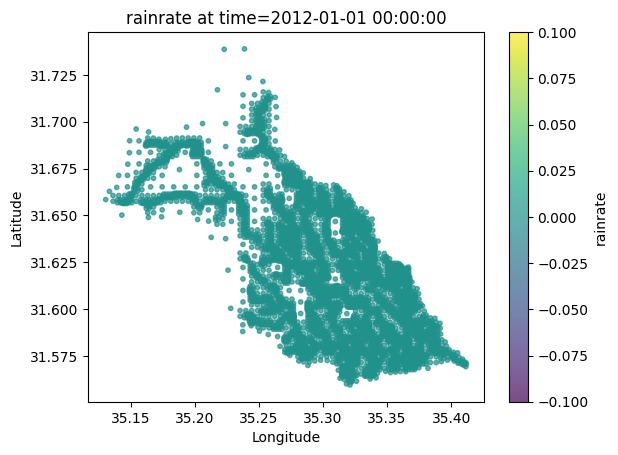

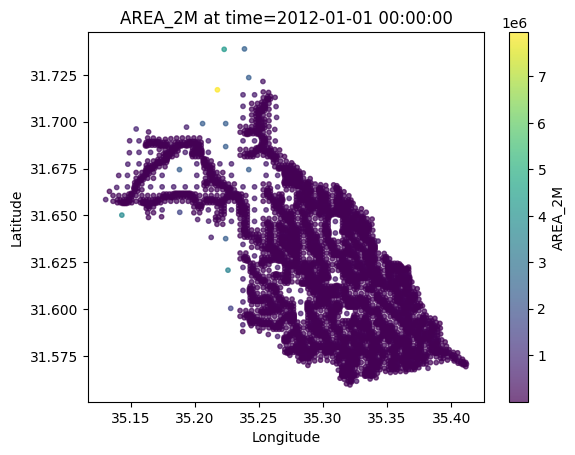

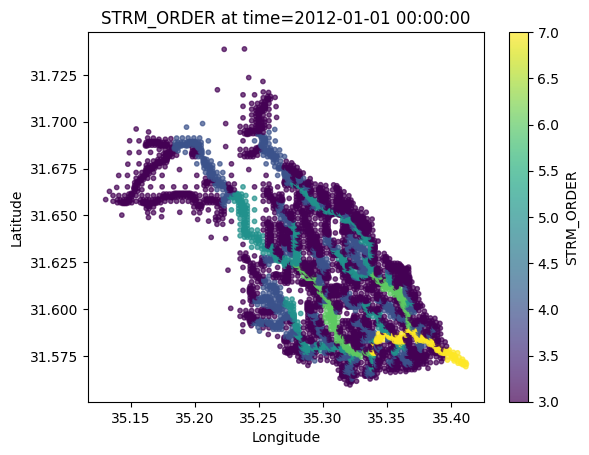

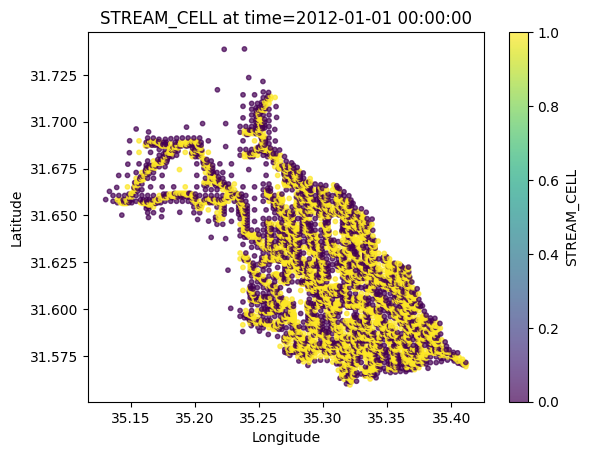

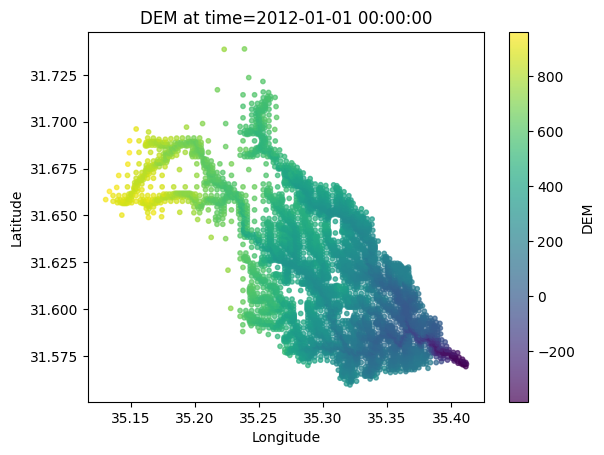

...

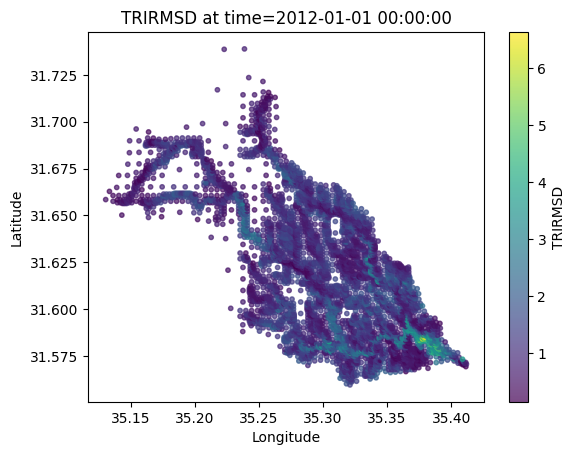

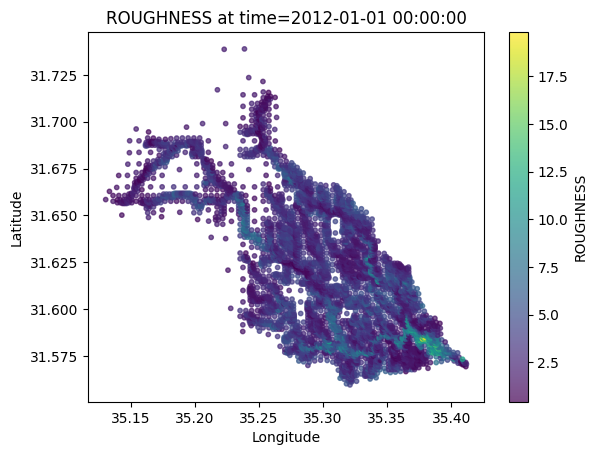

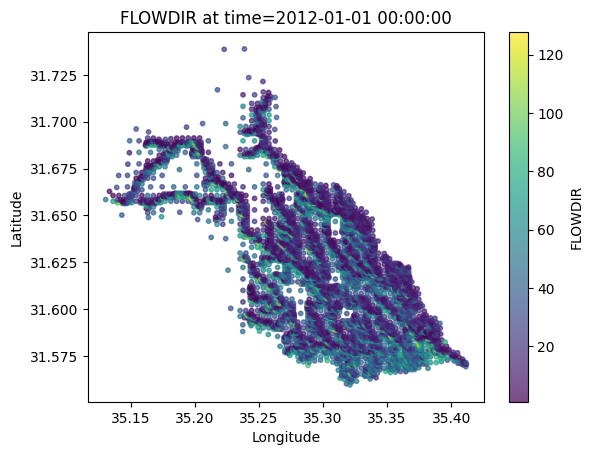

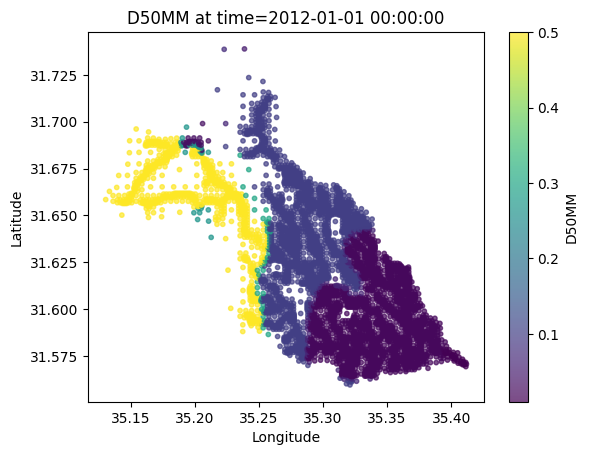

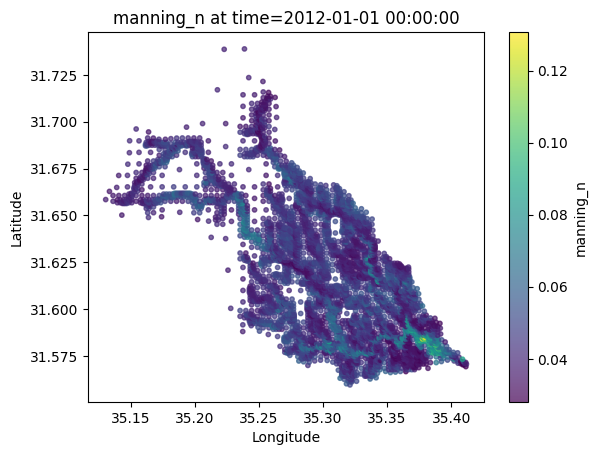

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

def visualize_first_timestamp(file_path, chunksize=200000):
    """
    Displays a series of scatter plots for the earliest timestamp 
    in the file (based on the first chunk). Each numeric feature 
    is shown on its own plot, with points colored by the feature value.
    """
    # -- 1) Read the first chunk of data --
    # 'parse_dates' ensures pandas treats the 'time' column as datetime.
    chunk_iter = pd.read_csv(file_path, chunksize=chunksize, parse_dates=['time'])
    first_chunk = next(chunk_iter)  # Only read the first chunk

    # -- 2) Identify the earliest timestamp in this chunk --
    # (Assuming the file is sorted by time, so this is the file's earliest time.)
    earliest_time = first_chunk['time'].min()
    
    # -- 3) Filter to rows that match the earliest timestamp --
    df_first_time = first_chunk[first_chunk['time'] == earliest_time]
    
    # -- 4) List of features to plot (excluding ID, time, latitude, longitude, etc.) --
    # Adjust as needed.
    features_to_plot = [
        'rainrate', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE',
        'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR',
        'D50MM', 'manning_n'
    ]
    
    print(f"Found earliest timestamp = {earliest_time}")
    print(f"Number of cells (rows) at this time = {len(df_first_time)}")
    
    # -- 5) Scatter plots: latitude vs. longitude, colored by each feature --
    for feature in features_to_plot:
        plt.figure()  # Each feature gets its own figure
        sc = plt.scatter(
            x=df_first_time['longitude'],
            y=df_first_time['latitude'],
            c=df_first_time[feature],
            s=10,  # Size of the scatter points
            alpha=0.7
        )
        plt.colorbar(sc, label=feature)
        plt.title(f"{feature} at time={earliest_time}")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.show()

# Example usage:
if __name__ == "__main__":
    file_path = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.csv"
    )
    visualize_first_timestamp(file_path)


In [6]:
import pandas as pd

def get_earliest_timestamp_cell_count(file_path, chunksize=200_000):
    """
    Finds the earliest timestamp in a time-sorted CSV file and counts 
    how many rows (grid cells) correspond to that timestamp.
    
    Assumes:
    1) The CSV has a 'time' column.
    2) The file is sorted in ascending order by 'time.'
    3) The first row encountered has the earliest time in the entire file.
    4) 'time' is parseable as a datetime if we use parse_dates=['time'].
    """
    # Prepare an iterator for chunked reading
    chunk_iter = pd.read_csv(file_path, chunksize=chunksize, parse_dates=['time'])
    
    earliest_time = None  # Will store earliest timestamp once we know it
    count_for_earliest = 0  # Number of rows with that earliest timestamp
    
    for chunk in chunk_iter:
        # If we haven't established earliest_time yet,
        # we set it to the minimum time found in this chunk.
        if earliest_time is None:
            earliest_time = chunk['time'].iloc[0]  # earliest row in chunk
            # In a strictly sorted file, .iloc[0] is the earliest row in this chunk,
            # which should also be the earliest time in the entire file.
        
        # Filter rows that match earliest_time
        # (For the first chunk, this will capture all rows with that time.)
        matched = chunk[chunk['time'] == earliest_time]
        count_for_earliest += len(matched)
        
        # Now check if there's any time in this chunk that is strictly greater 
        # than earliest_time. If yes, we've passed the earliest_time in the file 
        # and can stop reading further chunks.
        if (chunk['time'] > earliest_time).any():
            break

    return earliest_time, count_for_earliest


# Example usage:
if __name__ == "__main__":
    file_path = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.csv"
    )
    earliest_ts, cell_count = get_earliest_timestamp_cell_count(file_path)
    print(f"Earliest timestamp in file: {earliest_ts}")
    print(f"Exact number of grid cells for that time frame: {cell_count}")


Earliest timestamp in file: 2012-01-01 00:00:00
Exact number of grid cells for that time frame: 6264


In [7]:
192129408/6264

30672.0

In [8]:
import pandas as pd

file_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga discharge/darga_discharge_2012.csv"
)

# Just read 5 rows to keep memory usage small
df = pd.read_csv(file_path, nrows=5)
print(df)


   name                 date  rg_qms  latitude  longitude
0  דרגה  2012-01-01 00:00:00     0.0  31.60015   35.36552
1  דרגה  2012-01-01 00:10:00     0.0  31.60015   35.36552
2  דרגה  2012-01-01 00:20:00     0.0  31.60015   35.36552
3  דרגה  2012-01-01 00:30:00     0.0  31.60015   35.36552
4  דרגה  2012-01-01 00:40:00     0.0  31.60015   35.36552


In [ ]:
import pandas as pd
import numpy as np
import math
import time
import os

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Computes haversine distance (in meters) between two lat/lon points.
    Returns floating-point distance in meters.
    """
    R = 6371_000  # Earth radius in meters
    phi1, phi2 = math.radians(lat1), math.radians(lat2)
    dphi = math.radians(lat2 - lat1)
    dlambda = math.radians(lon2 - lon1)

    a = (math.sin(dphi / 2) ** 2
         + math.cos(phi1) * math.cos(phi2) * math.sin(dlambda / 2) ** 2)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    return R * c

def find_nearest_pixel(sample_df, station_lat, station_lon):
    """
    Given a sample of your big dataset, find the single pixel (lat/lon)
    that is closest to (station_lat, station_lon).
    """
    # Drop duplicates so we only compute distance once per unique pixel
    unique_pixels = sample_df[['latitude', 'longitude']].drop_duplicates().reset_index(drop=True)
    
    distances = unique_pixels.apply(
        lambda row: haversine_distance(
            station_lat, station_lon,
            row['latitude'], row['longitude']
        ), axis=1
    )
    min_idx = distances.idxmin()
    return unique_pixels.loc[min_idx, 'latitude'], unique_pixels.loc[min_idx, 'longitude']

def integrate_discharge(
    big_rain_file,
    discharge_file,
    output_file,
    chunksize=200_000,
):
    """
    1) Find the pixel in big_rain_file that's nearest to the discharge station (from discharge_file).
    2) Read big_rain_file chunk by chunk:
       - Add 'discharge' column set to NaN in the original rows.
       - For each time in the chunk, if station has a discharge measurement, create
         a new row that copies from the nearest pixel but sets discharge and station lat/lon.
    3) Write the result to output_file chunk by chunk (appending).
    """
    start_time = time.time()
    print(f"Starting integrate_discharge: {big_rain_file}")
    
    # --- Load small discharge data ---
    df_station = pd.read_csv(discharge_file, parse_dates=['date'])
    station_lat = df_station['latitude'].iloc[0]
    station_lon = df_station['longitude'].iloc[0]
    # Convert discharge data to dictionary for fast lookups
    station_dict = df_station.set_index('date')['rg_qms'].to_dict()
    
    # --- Sample the big file to find the nearest pixel ---
    print("  -> Finding nearest pixel from sample...")
    sample_df = pd.read_csv(big_rain_file, nrows=100_000)  # read a subset
    nearest_lat, nearest_lon = find_nearest_pixel(sample_df, station_lat, station_lon)
    print(f"  -> Nearest lat/lon = ({nearest_lat}, {nearest_lon})")

    # --- Prepare column list, add 'discharge' if it doesn't exist ---
    headers_df = pd.read_csv(big_rain_file, nrows=0)
    columns = list(headers_df.columns)
    if 'discharge' not in columns:
        columns.append('discharge')
    
    # --- Initialize output file with header ---
    if os.path.exists(output_file):
        os.remove(output_file)
    with open(output_file, 'w', encoding='utf-8') as out_f:
        out_f.write(",".join(columns) + "\n")
    
    chunk_count = 0
    # --- Iterate over big file in chunks ---
    for chunk in pd.read_csv(big_rain_file, chunksize=chunksize, parse_dates=['time']):
        chunk_count += 1
        chunk_start = time.time()
        
        # Ensure 'discharge' column exists
        if 'discharge' not in chunk.columns:
            chunk['discharge'] = np.nan
        
        # Identify the rows matching nearest lat/lon so we can clone them
        mask = (
            (chunk['latitude'] == nearest_lat) &
            (chunk['longitude'] == nearest_lon)
        )
        subset = chunk.loc[mask]
        
        new_station_rows = []
        for idx, row in subset.iterrows():
            t = row['time']
            # If station has a discharge measurement at time t
            if t in station_dict:
                copied_row = row.copy()
                copied_row['latitude'] = station_lat
                copied_row['longitude'] = station_lon
                copied_row['discharge'] = station_dict[t]
                # Possibly set an ID if you want
                # copied_row['ID'] = 999999
                new_station_rows.append(copied_row)
        
        # Append new station rows to chunk
        if new_station_rows:
            station_df = pd.DataFrame(new_station_rows)
            chunk = pd.concat([chunk, station_df], ignore_index=True)
        
        # Write this chunk to CSV
        chunk.to_csv(output_file, mode='a', header=False, index=False)
        
        chunk_end = time.time()
        print(
            f"  -> Chunk #{chunk_count} processed. "
            f"New rows: {len(new_station_rows)}. "
            f"Time: {chunk_end - chunk_start:.1f}s"
        )
    
    total_time = time.time() - start_time
    print(f"Finished writing {output_file} in {total_time:.1f}s")

# --- Process all 8 years ---
def process_all_years():
    years = [2012, 2013, 2014, 2015, 2016, 2018, 2019, 2020]
    base_rain_path = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    )
    base_discharge_path = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/darga discharge/"
    )
    output_dir = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/combined_output/"
    )
    
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    for yr in years:
        big_rain_file = os.path.join(base_rain_path, f"darga_rain_{yr}_kriged_merged.csv")
        discharge_file = os.path.join(base_discharge_path, f"darga_discharge_{yr}.csv")
        output_file = os.path.join(output_dir, f"darga_rain_discharge_{yr}.csv")
        
        print(f"=== Processing year {yr} ===")
        integrate_discharge(
            big_rain_file=big_rain_file,
            discharge_file=discharge_file,
            output_file=output_file,
            chunksize=200_000
        )
        print(f"--- Finished year {yr} ---\n")

# Run it all
process_all_years()
